# 11 - Stable Diffusion Restoration

**Origin:** Existing Notebook 21, rebuilt against the normalized Notebook 08 contracts  
**Refactor status:** Finished        
**Validation status:** Finished        
**Completion gate passed:** Yes  
**Output root:** `outputs/11_stable_diffusion_restoration/`  
**Depends on:** Notebooks 01 and 08

## Purpose

Generate reproducible Stable Diffusion 1.5 inpainting candidates for every methodologically eligible case declared by Notebook 08.

The approved design contains:

- 410 primary generic-prompt candidates using seed 2026;
- 50 identity/no-op zero controls within the primary candidates;
- 360 primary model-inference candidates;
- 120 predeclared nonzero prompt-ablation cases;
- four additional contextual prompt variants per prompt-ablation case;
- 480 contextual prompt-ablation candidates;
- 40 predeclared canonical nonzero uncertainty cases;
- three additional seeds per uncertainty case;
- 120 uncertainty-extension candidates;
- 1,010 total candidate rows and restored images;
- 960 model-inference candidates and 50 zero-control copies.

The primary candidate is always the fixed generic-prompt candidate using seed 2026. Contextual prompts and repeated seeds form controlled ablations only. Evaluation metrics must never be used to choose cases or primary candidates.

Binary missing-region masks use foreground values `>= 128`. Eligible synthetic-effect masks use foreground values `>= 13`. Pixels outside the approved mask are preserved exactly through masked compositing.

Stable Diffusion outputs are plausible prompt-conditioned reconstructions. They are not evidence of historically correct content and do not constitute conservation recommendations.

## Batch 1 - Contract, Initialization, and Dependency Preflight

This batch:

- initializes the Notebook 11 execution identity;
- loads the approved versioned configuration;
- reads the refreshed inventory and project-path registry;
- validates the completed Notebook 08 handoff;
- declares every approved input and output;
- verifies helper and schema versions;
- verifies the pinned model, scheduler, prompt, seed, retry, mask, and compositing policies;
- checks the installed Diffusers and CUDA environment;
- reconciles the complete 1,010-candidate design;
- validates legacy cleanup and notebook-owned output paths;
- creates only the approved Notebook 11 output directories.

It does not download or load the Stable Diffusion model, perform inference, or generate canonical output artifacts.

In [1]:
from pathlib import Path
from importlib.metadata import version as package_version
import json
import platform
import sys

import accelerate
import diffusers
import matplotlib
import numpy as np
import pandas as pd
import safetensors
import torch
import transformers
import yaml
from IPython.display import display
from PIL import Image


# ---------------------------------------------------------------------------
# Minimal repository bootstrap
# ---------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()

PROJECT_ROOT_MATCHES = [
    candidate
    for candidate in (
        CURRENT_DIRECTORY,
        *CURRENT_DIRECTORY.parents,
    )
    if (
        (candidate / ".git").exists()
        and (candidate / "src" / "restoration_eval").is_dir()
        and (candidate / "notebooks").is_dir()
    )
]

if not PROJECT_ROOT_MATCHES:
    raise FileNotFoundError(
        "Could not locate the painting-restoration repository root "
        f"from {CURRENT_DIRECTORY}."
    )

PROJECT_ROOT = PROJECT_ROOT_MATCHES[0]
SOURCE_DIRECTORY = PROJECT_ROOT / "src"

if str(SOURCE_DIRECTORY) not in sys.path:
    sys.path.insert(0, str(SOURCE_DIRECTORY))


# ---------------------------------------------------------------------------
# Versioned project helpers
# ---------------------------------------------------------------------------

from restoration_eval import __version__ as PACKAGE_VERSION

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
    utc_now_iso,
)

from restoration_eval.paths import (
    INVENTORY_RUN_PATH,
    PATHS_MODULE_VERSION,
    PROJECT_FILE_INVENTORY_PATH,
    PROJECT_PATHS_JSON_PATH,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    require_notebook_output_path,
    to_repo_relative,
    validate_project_paths_registry,
)

from restoration_eval.restoration_stable_diffusion import (
    CONFIG_SCHEMA_VERSION,
    MODEL_NAME,
    RESTORATION_GENERATOR_NAME,
    RESTORATION_GENERATOR_VERSION,
    load_stable_diffusion_config,
    runtime_environment,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    CASE_REGISTRY_SCHEMA,
    MODEL_ELIGIBILITY_SCHEMA,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    PROMPT_POLICY_SCHEMA,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    SCHEMAS_MODULE_VERSION,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    VALIDATION_CHECKS_SCHEMA,
    validate_dataframe,
)

from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)


# ---------------------------------------------------------------------------
# Notebook execution identity
# ---------------------------------------------------------------------------

NOTEBOOK_ID = "11"
NOTEBOOK_STEM = "11_stable_diffusion_restoration"
NOTEBOOK_NAME = "Stable Diffusion Restoration"

ORIGIN = (
    "Existing Notebook 21; rebuilt against normalized Notebook 08 "
    "contracts with controlled prompt and repeated-seed designs"
)

RUN_STARTED_AT_UTC = utc_now_iso()

SUPPORTED_PYTHON_MINORS = {
    (3, 11),
    (3, 12),
}

HELPER_VERSIONS = {
    "restoration_eval": PACKAGE_VERSION,
    "paths": PATHS_MODULE_VERSION,
    "schemas": SCHEMAS_MODULE_VERSION,
    "manifests": MANIFESTS_MODULE_VERSION,
    "validation": VALIDATION_MODULE_VERSION,
    "restoration_stable_diffusion": RESTORATION_GENERATOR_VERSION,
}

print("Notebook:", f"{NOTEBOOK_ID} - {NOTEBOOK_NAME}")
print("Repository root:", PROJECT_ROOT)
print("Run started:", RUN_STARTED_AT_UTC)
print("Python executable:", sys.executable)
print("Python:", platform.python_version())
print("pandas:", pd.__version__)
print("NumPy:", np.__version__)
print("Matplotlib:", matplotlib.__version__)
print("Pillow:", getattr(Image, "__version__", "unknown"))
print("PyYAML:", yaml.__version__)
print("PyTorch:", torch.__version__)
print("Diffusers:", diffusers.__version__)
print("Transformers:", transformers.__version__)
print("Accelerate:", accelerate.__version__)
print("Safetensors:", safetensors.__version__)
print("Stable Diffusion helper:", RESTORATION_GENERATOR_VERSION)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Notebook: 11 - Stable Diffusion Restoration
Repository root: D:\Masters\FH\Thesis\painting-restoration-eval
Run started: 2026-08-24T11:19:49.870283Z
Python executable: D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Scripts\python.exe
Python: 3.12.6
pandas: 2.3.3
NumPy: 1.26.4
Matplotlib: 3.11.0
Pillow: 9.5.0
PyYAML: 6.0.3
PyTorch: 2.5.1+cu121
Diffusers: 0.27.2
Transformers: 4.48.3
Accelerate: 1.14.0
Safetensors: 0.8.0
Stable Diffusion helper: 5.1.0


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\transformers\utils\hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


In [2]:
# ---------------------------------------------------------------------------
# Approved configuration and dependency paths
# ---------------------------------------------------------------------------

CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "experiments"
    / "stable_diffusion.yaml"
)

HELPER_PATH = (
    PROJECT_ROOT
    / "src"
    / "restoration_eval"
    / "restoration_stable_diffusion.py"
)

SCHEMAS_PATH = (
    PROJECT_ROOT
    / "src"
    / "restoration_eval"
    / "schemas.py"
)

NOTEBOOK_PATH = (
    PROJECT_ROOT
    / "notebooks"
    / "11_stable_diffusion_restoration.ipynb"
)

sd_config = load_stable_diffusion_config(CONFIG_PATH)

EXPECTED_COUNTS = sd_config["expected"]
configured_inputs = sd_config["inputs"]
configured_output = sd_config["output"]
configured_model = sd_config["model"]
configured_design = sd_config["candidate_design"]
configured_execution = sd_config["execution"]


# ---------------------------------------------------------------------------
# Explicit input paths
# ---------------------------------------------------------------------------

INPUTS = {
    "project_inventory": (
        PROJECT_ROOT / PROJECT_FILE_INVENTORY_PATH
    ),
    "inventory_run": (
        PROJECT_ROOT / INVENTORY_RUN_PATH
    ),
    "project_paths_registry": (
        PROJECT_ROOT / PROJECT_PATHS_JSON_PATH
    ),
    "stable_diffusion_config": CONFIG_PATH,
    "artworks": (
        PROJECT_ROOT
        / configured_inputs["artworks_path"]
    ),
    "case_registry": (
        PROJECT_ROOT
        / configured_inputs["case_registry_path"]
    ),
    "model_eligibility": (
        PROJECT_ROOT
        / configured_inputs["model_eligibility_path"]
    ),
    "schema_registry": (
        PROJECT_ROOT
        / configured_inputs["schema_registry_path"]
    ),
    "upstream_run_manifest": (
        PROJECT_ROOT
        / configured_inputs["upstream_run_manifest_path"]
    ),
    "upstream_artifacts": (
        PROJECT_ROOT
        / configured_inputs["upstream_artifacts_path"]
    ),
    "evaluation_contract_config": (
        PROJECT_ROOT
        / configured_inputs["evaluation_contract_config_path"]
    ),
    "synthetic_degradation_config": (
        PROJECT_ROOT
        / configured_inputs["synthetic_degradation_config_path"]
    ),
    "stable_diffusion_helper": HELPER_PATH,
    "schemas_helper": SCHEMAS_PATH,
}


# ---------------------------------------------------------------------------
# Inventory, registry, and Notebook 08 handoff
# ---------------------------------------------------------------------------

inventory_df = pd.read_csv(
    INPUTS["project_inventory"],
    low_memory=False,
)

with INPUTS["inventory_run"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

project_paths_registry = load_project_paths_registry(
    PROJECT_ROOT
)

with INPUTS["upstream_run_manifest"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    upstream_run_manifest = json.load(handle)

upstream_artifacts_df = pd.read_csv(
    INPUTS["upstream_artifacts"]
)

with INPUTS["schema_registry"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    upstream_schema_registry = json.load(handle)

with INPUTS["evaluation_contract_config"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    evaluation_contract_config = yaml.safe_load(handle)

with INPUTS["synthetic_degradation_config"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    synthetic_degradation_config = yaml.safe_load(handle)

inventory_relative_paths = set(
    inventory_df["relative_path"]
    .astype(str)
    .str.replace("\\", "/", regex=False)
)

project_paths_errors = validate_project_paths_registry(
    project_paths_registry
)

upstream_artifact_validation = validate_dataframe(
    upstream_artifacts_df,
    ARTIFACT_MANIFEST_SCHEMA,
)

upstream_schema_names = {
    schema_record["name"]
    for schema_record
    in upstream_schema_registry["schemas"]
}


# ---------------------------------------------------------------------------
# Installed environment preflight
# ---------------------------------------------------------------------------

DEPENDENCY_VERSIONS = {
    "torch": package_version("torch"),
    "diffusers": package_version("diffusers"),
    "transformers": package_version("transformers"),
    "accelerate": package_version("accelerate"),
    "safetensors": package_version("safetensors"),
    "Pillow": package_version("Pillow"),
}

CUDA_AVAILABLE = bool(torch.cuda.is_available())
EFFECTIVE_PREFLIGHT_DEVICE = (
    "cuda"
    if CUDA_AVAILABLE
    else "cpu"
)

sd_runtime_environment = runtime_environment(
    EFFECTIVE_PREFLIGHT_DEVICE
)


# ---------------------------------------------------------------------------
# Notebook-owned output paths
# ---------------------------------------------------------------------------

OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
    create=False,
)

OUTPUTS = {
    "candidates": (
        OUTPUT_ROOT
        / configured_output["candidates_path"]
    ),
    "prompt_policy": (
        OUTPUT_ROOT
        / configured_output["prompt_policy_path"]
    ),
    "restored_images": (
        OUTPUT_ROOT
        / configured_output["restored_directory"]
    ),
    "runtime_summary": (
        OUTPUT_ROOT
        / configured_output["runtime_summary_path"]
    ),
    "prompt_ablation_design": (
        OUTPUT_ROOT
        / configured_output["prompt_ablation_design_path"]
    ),
    "candidate_examples": (
        OUTPUT_ROOT
        / configured_output["candidate_examples_figure_path"]
    ),
    "prompt_comparison_examples": (
        OUTPUT_ROOT
        / configured_output["prompt_comparison_figure_path"]
    ),
    "prompt_policy_report": (
        OUTPUT_ROOT
        / configured_output["prompt_policy_report_path"]
    ),
    "run_manifest": (
        OUTPUT_ROOT
        / configured_output["run_manifest_path"]
    ),
    "artifact_manifest": (
        OUTPUT_ROOT
        / configured_output["artifacts_path"]
    ),
    "validation_checks": (
        OUTPUT_ROOT
        / configured_output["validation_path"]
    ),
    "checkpoint": (
        OUTPUT_ROOT
        / configured_output["checkpoint_path"]
    ),
    "smoke_directory": (
        OUTPUT_ROOT
        / configured_output["smoke_directory"]
    ),
    "failure_logs_directory": (
        OUTPUT_ROOT
        / configured_output["retained_failure_logs_directory"]
    ),
}

for output_path in OUTPUTS.values():
    require_notebook_output_path(
        output_path,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )

OUTPUT_DIRECTORIES = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "data",
        "images",
        "metrics",
        "figures",
        "reports",
        "manifests",
        "validation",
        "work",
    ),
    PROJECT_ROOT,
)

OUTPUTS["restored_images"].mkdir(
    parents=True,
    exist_ok=True,
)

OUTPUTS["smoke_directory"].mkdir(
    parents=True,
    exist_ok=True,
)

print("Inventory run:", inventory_run["inventory_run_id"])
print("Inventory rows:", len(inventory_df))
print("Notebook 08 status:", upstream_run_manifest["run_status"])
print("CUDA available:", CUDA_AVAILABLE)
print("CUDA device:", sd_runtime_environment["gpu_name"] or "none")
print("Output root:", OUTPUT_ROOT)
print("Approved output directories created:", len(OUTPUT_DIRECTORIES))

Inventory run: inventory_20260824T110404Z_e3c3dcbe
Inventory rows: 10110
Notebook 08 status: completed
CUDA available: True
CUDA device: NVIDIA GeForce RTX 3060 Laptop GPU
Output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\11_stable_diffusion_restoration
Approved output directories created: 8


In [3]:
# ---------------------------------------------------------------------------
# Normalized input contract
# ---------------------------------------------------------------------------

input_contract_records = [
    {
        "input_key": "project_inventory",
        "producer": "tools/build_project_inventory.py",
        "relative_path": to_repo_relative(
            INPUTS["project_inventory"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "csv",
        "schema_version": "project_file_inventory.v1",
        "required_columns_or_keys": (
            "inventory_schema_version, inventory_run_id, relative_path, "
            "file_kind, size_bytes, hash_value"
        ),
        "expected_cardinality": len(inventory_df),
        "applicability": "repository",
    },
    {
        "input_key": "inventory_run",
        "producer": "tools/build_project_inventory.py",
        "relative_path": to_repo_relative(
            INPUTS["inventory_run"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "json",
        "schema_version": "inventory_run.v1",
        "required_columns_or_keys": (
            "inventory_run_id, status, inventory_sha256, summary"
        ),
        "expected_cardinality": 1,
        "applicability": "repository",
    },
    {
        "input_key": "project_paths_registry",
        "producer": "validated notebook handoffs",
        "relative_path": to_repo_relative(
            INPUTS["project_paths_registry"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "json",
        "schema_version": "project_paths.v1",
        "required_columns_or_keys": (
            "registry_schema_version, artifacts"
        ),
        "expected_cardinality": len(
            project_paths_registry["artifacts"]
        ),
        "applicability": "repository",
    },
    {
        "input_key": "stable_diffusion_config",
        "producer": "project configuration",
        "relative_path": to_repo_relative(
            CONFIG_PATH,
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "yaml",
        "schema_version": CONFIG_SCHEMA_VERSION,
        "required_columns_or_keys": (
            "dataset, inputs, output, model, prompt_policy, "
            "candidate_design, execution, expected"
        ),
        "expected_cardinality": 1,
        "applicability": "stable_diffusion",
    },
    {
        "input_key": "artworks",
        "producer": "Notebook 01",
        "relative_path": to_repo_relative(
            INPUTS["artworks"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "csv",
        "schema_version": sd_config["schema_versions"]["artworks"],
        "required_columns_or_keys": (
            "painting_id, title, artist, date_or_period, "
            "style_or_period, category"
        ),
        "expected_cardinality": EXPECTED_COUNTS["artwork_count"],
        "applicability": "prompt_metadata",
    },
    {
        "input_key": "case_registry",
        "producer": "Notebook 08",
        "relative_path": to_repo_relative(
            INPUTS["case_registry"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "csv",
        "schema_version": CASE_REGISTRY_SCHEMA.version,
        "required_columns_or_keys": ", ".join(
            CASE_REGISTRY_SCHEMA.required_columns
        ),
        "expected_cardinality": EXPECTED_COUNTS["case_registry_rows"],
        "applicability": "all_cases",
    },
    {
        "input_key": "model_eligibility",
        "producer": "Notebook 08",
        "relative_path": to_repo_relative(
            INPUTS["model_eligibility"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "csv",
        "schema_version": MODEL_ELIGIBILITY_SCHEMA.version,
        "required_columns_or_keys": ", ".join(
            MODEL_ELIGIBILITY_SCHEMA.required_columns
        ),
        "expected_cardinality": EXPECTED_COUNTS["model_eligibility_rows"],
        "applicability": "all_case_model_pairs",
    },
    {
        "input_key": "schema_registry",
        "producer": "Notebook 08",
        "relative_path": to_repo_relative(
            INPUTS["schema_registry"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "json",
        "schema_version": "schema_registry.v1",
        "required_columns_or_keys": (
            "schema_registry_version, producer_module, schemas"
        ),
        "expected_cardinality": len(
            upstream_schema_registry["schemas"]
        ),
        "applicability": "upstream_contracts",
    },
    {
        "input_key": "upstream_run_manifest",
        "producer": "Notebook 08",
        "relative_path": to_repo_relative(
            INPUTS["upstream_run_manifest"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "json",
        "schema_version": "run_manifest.v1",
        "required_columns_or_keys": (
            "run_id, run_status, validation_summary, "
            "completion_gate_passed"
        ),
        "expected_cardinality": 1,
        "applicability": "notebook_08_handoff",
    },
    {
        "input_key": "upstream_artifacts",
        "producer": "Notebook 08",
        "relative_path": to_repo_relative(
            INPUTS["upstream_artifacts"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "csv",
        "schema_version": ARTIFACT_MANIFEST_SCHEMA.version,
        "required_columns_or_keys": ", ".join(
            ARTIFACT_MANIFEST_SCHEMA.required_columns
        ),
        "expected_cardinality": len(upstream_artifacts_df),
        "applicability": "notebook_08_handoff",
    },
    {
        "input_key": "evaluation_contract_config",
        "producer": "project configuration",
        "relative_path": to_repo_relative(
            INPUTS["evaluation_contract_config"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "yaml",
        "schema_version": "evaluation_contract_config.v1",
        "required_columns_or_keys": (
            "dataset, output, models, schemas"
        ),
        "expected_cardinality": 1,
        "applicability": "eligibility_policy",
    },
    {
        "input_key": "synthetic_degradation_config",
        "producer": "project configuration",
        "relative_path": to_repo_relative(
            INPUTS["synthetic_degradation_config"],
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "yaml",
        "schema_version": "synthetic_degradation_config.v1",
        "required_columns_or_keys": (
            "dataset, inputs, generator, degradations"
        ),
        "expected_cardinality": 1,
        "applicability": "synthetic_mask_threshold",
    },
    {
        "input_key": "stable_diffusion_helper",
        "producer": "restoration_eval",
        "relative_path": to_repo_relative(
            HELPER_PATH,
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "python",
        "schema_version": RESTORATION_GENERATOR_VERSION,
        "required_columns_or_keys": (
            "configuration, design, execution, resume, validation"
        ),
        "expected_cardinality": 1,
        "applicability": "stable_diffusion",
    },
    {
        "input_key": "schemas_helper",
        "producer": "restoration_eval",
        "relative_path": to_repo_relative(
            SCHEMAS_PATH,
            PROJECT_ROOT,
        ),
        "required": True,
        "format": "python",
        "schema_version": SCHEMAS_MODULE_VERSION,
        "required_columns_or_keys": (
            "stable_diffusion_candidates, prompt_policy, "
            "prompt_ablation_design"
        ),
        "expected_cardinality": 1,
        "applicability": "normalized_contracts",
    },
]

INPUT_CONTRACT = pd.DataFrame(input_contract_records)


# ---------------------------------------------------------------------------
# Normalized output contract
# ---------------------------------------------------------------------------

output_contract_records = [
    {
        "output_key": "stable_diffusion.candidates",
        "relative_path": to_repo_relative(
            OUTPUTS["candidates"],
            PROJECT_ROOT,
        ),
        "artifact_role": "primary",
        "format": "csv",
        "schema_version": STABLE_DIFFUSION_CANDIDATES_SCHEMA.version,
        "expected_cardinality": EXPECTED_COUNTS["candidate_count"],
        "downstream_consumers": "Notebooks 13-21 and later reporting",
    },
    {
        "output_key": "stable_diffusion.prompt_policy",
        "relative_path": to_repo_relative(
            OUTPUTS["prompt_policy"],
            PROJECT_ROOT,
        ),
        "artifact_role": "method_contract",
        "format": "csv",
        "schema_version": PROMPT_POLICY_SCHEMA.version,
        "expected_cardinality": EXPECTED_COUNTS["prompt_policy_row_count"],
        "downstream_consumers": "Prompt and XAI analyses",
    },
    {
        "output_key": "stable_diffusion.restored_images",
        "relative_path": to_repo_relative(
            OUTPUTS["restored_images"],
            PROJECT_ROOT,
        ),
        "artifact_role": "primary",
        "format": "png_directory",
        "schema_version": sd_config["schema_versions"]["restored_images"],
        "expected_cardinality": EXPECTED_COUNTS["restored_file_count"],
        "downstream_consumers": "Notebooks 13-21",
    },
    {
        "output_key": "stable_diffusion.runtime_summary",
        "relative_path": to_repo_relative(
            OUTPUTS["runtime_summary"],
            PROJECT_ROOT,
        ),
        "artifact_role": "metrics",
        "format": "csv",
        "schema_version": RESTORATION_RUNTIME_SUMMARY_SCHEMA.version,
        "expected_cardinality": "derived normalized scopes",
        "downstream_consumers": "Runtime and computational reporting",
    },
    {
        "output_key": "stable_diffusion.prompt_ablation_design",
        "relative_path": to_repo_relative(
            OUTPUTS["prompt_ablation_design"],
            PROJECT_ROOT,
        ),
        "artifact_role": "method_contract",
        "format": "csv",
        "schema_version": PROMPT_ABLATION_DESIGN_SCHEMA.version,
        "expected_cardinality": EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ],
        "downstream_consumers": "Prompt and uncertainty analyses",
    },
    {
        "output_key": "stable_diffusion.candidate_examples",
        "relative_path": to_repo_relative(
            OUTPUTS["candidate_examples"],
            PROJECT_ROOT,
        ),
        "artifact_role": "reporting",
        "format": "png",
        "schema_version": sd_config["schema_versions"][
            "candidate_examples_figure"
        ],
        "expected_cardinality": 1,
        "downstream_consumers": "Thesis reporting",
    },
    {
        "output_key": "stable_diffusion.prompt_comparison_examples",
        "relative_path": to_repo_relative(
            OUTPUTS["prompt_comparison_examples"],
            PROJECT_ROOT,
        ),
        "artifact_role": "reporting",
        "format": "png",
        "schema_version": sd_config["schema_versions"][
            "prompt_comparison_figure"
        ],
        "expected_cardinality": 1,
        "downstream_consumers": "Prompt-ablation reporting",
    },
    {
        "output_key": "stable_diffusion.prompt_policy_report",
        "relative_path": to_repo_relative(
            OUTPUTS["prompt_policy_report"],
            PROJECT_ROOT,
        ),
        "artifact_role": "reporting",
        "format": "markdown",
        "schema_version": sd_config["schema_versions"][
            "prompt_policy_report"
        ],
        "expected_cardinality": 1,
        "downstream_consumers": "Thesis methods and limitations",
    },
    {
        "output_key": "stable_diffusion.run_manifest",
        "relative_path": to_repo_relative(
            OUTPUTS["run_manifest"],
            PROJECT_ROOT,
        ),
        "artifact_role": "provenance",
        "format": "json",
        "schema_version": sd_config["schema_versions"]["run_manifest"],
        "expected_cardinality": 1,
        "downstream_consumers": "All downstream notebooks",
    },
    {
        "output_key": "stable_diffusion.artifact_manifest",
        "relative_path": to_repo_relative(
            OUTPUTS["artifact_manifest"],
            PROJECT_ROOT,
        ),
        "artifact_role": "provenance",
        "format": "csv",
        "schema_version": ARTIFACT_MANIFEST_SCHEMA.version,
        "expected_cardinality": EXPECTED_COUNTS[
            "artifact_record_count"
        ],
        "downstream_consumers": "Inventory and project-path registry",
    },
    {
        "output_key": "validation.11_stable_diffusion_restoration",
        "relative_path": to_repo_relative(
            OUTPUTS["validation_checks"],
            PROJECT_ROOT,
        ),
        "artifact_role": "validation",
        "format": "csv",
        "schema_version": VALIDATION_CHECKS_SCHEMA.version,
        "expected_cardinality": "one normalized validation table",
        "downstream_consumers": "Completion gate and audit",
    },
]

OUTPUT_CONTRACT = pd.DataFrame(output_contract_records)

print("Declared inputs:", len(INPUT_CONTRACT))
print("Declared canonical outputs:", len(OUTPUT_CONTRACT))
print("Expected artifact-manifest records:", EXPECTED_COUNTS["artifact_record_count"])

Declared inputs: 14
Declared canonical outputs: 11
Expected artifact-manifest records: 9


In [4]:
# ---------------------------------------------------------------------------
# Dependency and fixed-policy summaries
# ---------------------------------------------------------------------------

dependency_preflight_df = pd.DataFrame(
    [
        {
            "dependency": "Python",
            "observed_version": platform.python_version(),
            "required_version": "3.11 or 3.12",
            "passed": sys.version_info[:2] in SUPPORTED_PYTHON_MINORS,
        },
        {
            "dependency": "torch",
            "observed_version": DEPENDENCY_VERSIONS["torch"],
            "required_version": "2.5.1+cu121",
            "passed": DEPENDENCY_VERSIONS["torch"] == "2.5.1+cu121",
        },
        {
            "dependency": "diffusers",
            "observed_version": DEPENDENCY_VERSIONS["diffusers"],
            "required_version": "0.27.2",
            "passed": DEPENDENCY_VERSIONS["diffusers"] == "0.27.2",
        },
        {
            "dependency": "transformers",
            "observed_version": DEPENDENCY_VERSIONS["transformers"],
            "required_version": "installed and importable",
            "passed": bool(DEPENDENCY_VERSIONS["transformers"]),
        },
        {
            "dependency": "accelerate",
            "observed_version": DEPENDENCY_VERSIONS["accelerate"],
            "required_version": "installed and importable",
            "passed": bool(DEPENDENCY_VERSIONS["accelerate"]),
        },
        {
            "dependency": "safetensors",
            "observed_version": DEPENDENCY_VERSIONS["safetensors"],
            "required_version": "installed and importable",
            "passed": bool(DEPENDENCY_VERSIONS["safetensors"]),
        },
        {
            "dependency": "CUDA",
            "observed_version": (
                sd_runtime_environment["cuda_version"]
                if CUDA_AVAILABLE
                else "unavailable"
            ),
            "required_version": "available; CPU fallback disabled",
            "passed": CUDA_AVAILABLE,
        },
    ]
)

policy_preflight_df = pd.DataFrame(
    [
        {
            "policy": "model_id",
            "approved_value": MODEL_NAME,
            "observed_value": configured_model["model_id"],
        },
        {
            "policy": "hf_model_id",
            "approved_value": (
                "stable-diffusion-v1-5/"
                "stable-diffusion-inpainting"
            ),
            "observed_value": configured_model["hf_model_id"],
        },
        {
            "policy": "model_revision",
            "approved_value": (
                "8a4288a76071f7280aedbdb3253bdb9e9d5d84bb"
            ),
            "observed_value": configured_model["model_revision"],
        },
        {
            "policy": "scheduler",
            "approved_value": "DDIMScheduler",
            "observed_value": configured_model["scheduler"],
        },
        {
            "policy": "inference_resolution",
            "approved_value": "512x512",
            "observed_value": (
                f"{configured_model['inference_width']}x"
                f"{configured_model['inference_height']}"
            ),
        },
        {
            "policy": "output_resolution",
            "approved_value": "768x768",
            "observed_value": (
                f"{configured_model['output_width']}x"
                f"{configured_model['output_height']}"
            ),
        },
        {
            "policy": "steps_guidance_strength",
            "approved_value": "30 / 7.5 / 1.0",
            "observed_value": (
                f"{configured_model['num_inference_steps']} / "
                f"{configured_model['guidance_scale']} / "
                f"{configured_model['strength']}"
            ),
        },
        {
            "policy": "primary_prompt_variant",
            "approved_value": "p00_generic",
            "observed_value": sd_config[
                "prompt_policy"
            ]["primary_variant_id"],
        },
        {
            "policy": "primary_seed",
            "approved_value": 2026,
            "observed_value": configured_design["primary_seed"],
        },
        {
            "policy": "uncertainty_seeds",
            "approved_value": [2026, 2027, 2028, 2029],
            "observed_value": configured_design["uncertainty_seeds"],
        },
        {
            "policy": "retry_seed_policy",
            "approved_value": "preserve_exact_seed",
            "observed_value": configured_model["retry_seed_policy"],
        },
        {
            "policy": "compositing",
            "approved_value": (
                "masked_composite_preserve_outside.v1"
            ),
            "observed_value": configured_model["compositing_policy"],
        },
        {
            "policy": "binary_mask_threshold",
            "approved_value": "foreground >= 128",
            "observed_value": (
                "foreground >= "
                f"{configured_model['mask_threshold_policy']['binary_missing_region']['threshold']}"
            ),
        },
        {
            "policy": "synthetic_mask_threshold",
            "approved_value": "foreground >= 13",
            "observed_value": (
                "foreground >= "
                f"{configured_model['mask_threshold_policy']['synthetic_degradation']['threshold']}"
            ),
        },
        {
            "policy": "progress_interval",
            "approved_value": 10,
            "observed_value": configured_execution[
                "progress_interval_candidates"
            ],
        },
    ]
)

policy_preflight_df["passed"] = (
    policy_preflight_df["approved_value"].astype(str)
    == policy_preflight_df["observed_value"].astype(str)
)

candidate_cardinality_df = pd.DataFrame(
    [
        {
            "component": "primary candidates",
            "candidate_count": EXPECTED_COUNTS[
                "primary_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "eligible_nonzero_case_count"
            ],
            "identity_copy_count": EXPECTED_COUNTS[
                "zero_control_case_count"
            ],
        },
        {
            "component": "contextual prompt candidates",
            "candidate_count": EXPECTED_COUNTS[
                "prompt_context_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "prompt_context_candidate_count"
            ],
            "identity_copy_count": 0,
        },
        {
            "component": "uncertainty extensions",
            "candidate_count": EXPECTED_COUNTS[
                "uncertainty_extension_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "uncertainty_extension_candidate_count"
            ],
            "identity_copy_count": 0,
        },
    ]
)

candidate_cardinality_df.loc[
    len(candidate_cardinality_df)
] = {
    "component": "total",
    "candidate_count": int(
        candidate_cardinality_df["candidate_count"].sum()
    ),
    "model_inference_count": int(
        candidate_cardinality_df["model_inference_count"].sum()
    ),
    "identity_copy_count": int(
        candidate_cardinality_df["identity_copy_count"].sum()
    ),
}

print("Dependency checks:", len(dependency_preflight_df))
print("Fixed policy checks:", len(policy_preflight_df))
print(
    "Reconciled candidates:",
    int(candidate_cardinality_df.iloc[-1]["candidate_count"]),
)
print(
    "Reconciled model inference:",
    int(candidate_cardinality_df.iloc[-1]["model_inference_count"]),
)
print(
    "Reconciled identity copies:",
    int(candidate_cardinality_df.iloc[-1]["identity_copy_count"]),
)

Dependency checks: 7
Fixed policy checks: 15
Reconciled candidates: 1010
Reconciled model inference: 960
Reconciled identity copies: 50


In [5]:
# ---------------------------------------------------------------------------
# Batch 1 validation
# ---------------------------------------------------------------------------

VALIDATION = ValidationCollector()


def add_batch_1_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_1_preflight",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# Python and dependency checks
for dependency_row in dependency_preflight_df.itertuples(index=False):
    add_batch_1_check(
        check_id=(
            "dependency_"
            + str(dependency_row.dependency)
            .lower()
            .replace(" ", "_")
        ),
        description=(
            f"{dependency_row.dependency} satisfies the "
            "approved Notebook 11 environment."
        ),
        expected=dependency_row.required_version,
        observed=dependency_row.observed_version,
        passed=dependency_row.passed,
    )


# Declared input existence
for input_key, input_path in INPUTS.items():
    add_batch_1_check(
        check_id=f"input_exists_{input_key}",
        description=(
            f"Declared input {input_key!r} exists."
        ),
        expected=True,
        observed=input_path.exists(),
        passed=input_path.exists(),
        details=to_repo_relative(
            input_path,
            PROJECT_ROOT,
        ),
    )


# Inventory validity
inventory_summary = inventory_run["summary"]

add_batch_1_check(
    check_id="inventory_run_completed",
    description="The refreshed inventory run completed.",
    expected="completed",
    observed=inventory_run["status"],
    passed=inventory_run["status"] == "completed",
)

add_batch_1_check(
    check_id="inventory_read_errors",
    description="The refreshed inventory has no read errors.",
    expected=0,
    observed=inventory_summary["read_error_count"],
    passed=inventory_summary["read_error_count"] == 0,
)

add_batch_1_check(
    check_id="inventory_row_count",
    description=(
        "Inventory CSV rows match the inventory-run summary."
    ),
    expected=inventory_summary["file_count"],
    observed=len(inventory_df),
    passed=len(inventory_df) == inventory_summary["file_count"],
)

inventory_self_keys = {
    "project_inventory",
    "inventory_run",
}

declared_inventory_paths = {
    input_key: to_repo_relative(
        input_path,
        PROJECT_ROOT,
    )
    for input_key, input_path in INPUTS.items()
    if input_key not in inventory_self_keys
}

missing_inventory_inputs = {
    input_key: relative_path
    for input_key, relative_path
    in declared_inventory_paths.items()
    if relative_path not in inventory_relative_paths
}

add_batch_1_check(
    check_id="declared_inputs_in_inventory",
    description=(
        "Every non-self-referential declared input appears in "
        "the refreshed inventory."
    ),
    expected=[],
    observed=missing_inventory_inputs,
    passed=not missing_inventory_inputs,
)


# Project-path registry validity and handoff alignment
add_batch_1_check(
    check_id="project_paths_registry_valid",
    description="The authoritative project-path registry is valid.",
    expected=[],
    observed=project_paths_errors,
    passed=not project_paths_errors,
)

registry_artifacts = {
    record["artifact_key"]: record
    for record in project_paths_registry["artifacts"]
}

registry_expectations = {
    "dataset.artworks": configured_inputs["artworks_path"],
    "experiment_contracts.case_registry": (
        configured_inputs["case_registry_path"]
    ),
    "experiment_contracts.model_eligibility": (
        configured_inputs["model_eligibility_path"]
    ),
    "experiment_contracts.schema_registry": (
        configured_inputs["schema_registry_path"]
    ),
}

for artifact_key, expected_path in registry_expectations.items():
    registry_record = registry_artifacts.get(artifact_key)
    observed_path = (
        registry_record["relative_path"]
        if registry_record
        else ""
    )
    validation_status = (
        registry_record["validation_status"]
        if registry_record
        else ""
    )

    add_batch_1_check(
        check_id=(
            "registry_"
            + artifact_key.replace(".", "_")
        ),
        description=(
            f"Registry artifact {artifact_key!r} exists, is passed, "
            "and matches the configured path."
        ),
        expected={
            "relative_path": expected_path,
            "validation_status": "passed",
        },
        observed={
            "relative_path": observed_path,
            "validation_status": validation_status,
        },
        passed=(
            registry_record is not None
            and observed_path == expected_path
            and validation_status == "passed"
        ),
    )


# Notebook 08 completion and schemas
add_batch_1_check(
    check_id="upstream_run_completed",
    description="Notebook 08 completed successfully.",
    expected="completed",
    observed=upstream_run_manifest["run_status"],
    passed=(
        upstream_run_manifest["run_status"]
        == configured_inputs["required_upstream_run_status"]
    ),
)

add_batch_1_check(
    check_id="upstream_completion_gate",
    description="Notebook 08 passed its completion gate.",
    expected=True,
    observed=upstream_run_manifest["completion_gate_passed"],
    passed=bool(
        upstream_run_manifest["completion_gate_passed"]
    ),
)

add_batch_1_check(
    check_id="upstream_artifact_schema",
    description=(
        "Notebook 08 artifact records satisfy the normalized schema."
    ),
    expected=True,
    observed=upstream_artifact_validation.passed,
    passed=upstream_artifact_validation.passed,
    details=upstream_artifact_validation.to_dict(),
)

add_batch_1_check(
    check_id="upstream_required_schemas",
    description=(
        "Notebook 08 exposes the case-registry and "
        "model-eligibility schemas."
    ),
    expected={
        "case_registry",
        "model_eligibility",
    },
    observed=upstream_schema_names,
    passed={
        "case_registry",
        "model_eligibility",
    }.issubset(upstream_schema_names),
)


# Fixed methodological policies
for policy_row in policy_preflight_df.itertuples(index=False):
    add_batch_1_check(
        check_id=f"policy_{policy_row.policy}",
        description=(
            f"Policy {policy_row.policy!r} matches the "
            "approved configuration."
        ),
        expected=policy_row.approved_value,
        observed=policy_row.observed_value,
        passed=policy_row.passed,
    )

add_batch_1_check(
    check_id="prompt_selection_non_metric",
    description=(
        "Prompt and uncertainty cases use the fixed "
        "metric-independent selection policy."
    ),
    expected="deterministic_hash_stratified_non_metric.v1",
    observed=configured_design["selection_policy"],
    passed=(
        configured_design["selection_policy"]
        == "deterministic_hash_stratified_non_metric.v1"
    ),
)

add_batch_1_check(
    check_id="candidate_count_reconciliation",
    description=(
        "Primary, prompt-context, and uncertainty-extension "
        "counts reconcile to 1,010."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=int(
        candidate_cardinality_df.iloc[-1]["candidate_count"]
    ),
    passed=(
        int(
            candidate_cardinality_df.iloc[-1]["candidate_count"]
        )
        == EXPECTED_COUNTS["candidate_count"]
    ),
)

add_batch_1_check(
    check_id="inference_count_reconciliation",
    description=(
        "Model-inference and zero-copy counts reconcile exactly."
    ),
    expected={
        "model_inference": EXPECTED_COUNTS[
            "model_inference_candidate_count"
        ],
        "identity_copy": EXPECTED_COUNTS[
            "zero_control_case_count"
        ],
    },
    observed={
        "model_inference": int(
            candidate_cardinality_df.iloc[-1][
                "model_inference_count"
            ]
        ),
        "identity_copy": int(
            candidate_cardinality_df.iloc[-1][
                "identity_copy_count"
            ]
        ),
    },
    passed=(
        int(
            candidate_cardinality_df.iloc[-1][
                "model_inference_count"
            ]
        )
        == EXPECTED_COUNTS[
            "model_inference_candidate_count"
        ]
        and int(
            candidate_cardinality_df.iloc[-1][
                "identity_copy_count"
            ]
        )
        == EXPECTED_COUNTS["zero_control_case_count"]
    ),
)


# Normalized schema versions
schema_version_expectations = {
    "candidates": (
        STABLE_DIFFUSION_CANDIDATES_SCHEMA.version,
        "stable_diffusion_candidates.v1",
    ),
    "prompt_policy": (
        PROMPT_POLICY_SCHEMA.version,
        "prompt_policy.v1",
    ),
    "prompt_ablation_design": (
        PROMPT_ABLATION_DESIGN_SCHEMA.version,
        "prompt_ablation_design.v1",
    ),
    "runtime_summary": (
        RESTORATION_RUNTIME_SUMMARY_SCHEMA.version,
        "restoration_runtime_summary.v1",
    ),
}

for schema_name, (
    observed_version,
    expected_version,
) in schema_version_expectations.items():
    add_batch_1_check(
        check_id=f"schema_{schema_name}",
        description=(
            f"The {schema_name} schema has the approved version."
        ),
        expected=expected_version,
        observed=observed_version,
        passed=observed_version == expected_version,
    )


# Output ownership and legacy cleanup
output_ownership_valid = all(
    str(output_path.resolve()).startswith(
        str(OUTPUT_ROOT.resolve())
    )
    for output_path in OUTPUTS.values()
)

add_batch_1_check(
    check_id="output_ownership",
    description=(
        "Every declared output remains inside the Notebook 11 root."
    ),
    expected=True,
    observed=output_ownership_valid,
    passed=output_ownership_valid,
)

legacy_targets = [
    (
        PROJECT_ROOT
        / "notebooks"
        / "11_opencv_lpips_metrics.ipynb"
    ),
    (
        PROJECT_ROOT
        / "notebooks"
        / "21_stable_diffusion_restoration.ipynb"
    ),
    (
        PROJECT_ROOT
        / "outputs"
        / "11_opencv_lpips_metrics"
    ),
    (
        PROJECT_ROOT
        / "outputs"
        / "21_stable_diffusion_restoration"
    ),
    (
        PROJECT_ROOT
        / "data"
        / "processed"
        / "restored"
        / "stable_diffusion"
    ),
]

remaining_legacy_targets = [
    to_repo_relative(path, PROJECT_ROOT)
    for path in legacy_targets
    if path.exists()
]

add_batch_1_check(
    check_id="legacy_cleanup",
    description=(
        "Approved obsolete Notebook 11/21 Stable Diffusion "
        "targets remain absent."
    ),
    expected=[],
    observed=remaining_legacy_targets,
    passed=not remaining_legacy_targets,
)

add_batch_1_check(
    check_id="target_notebook_exists",
    description=(
        "The new Notebook 11 target exists at the approved path."
    ),
    expected=True,
    observed=NOTEBOOK_PATH.is_file(),
    passed=NOTEBOOK_PATH.is_file(),
)


# ---------------------------------------------------------------------------
# Render and enforce the Batch 1 gate
# ---------------------------------------------------------------------------

BATCH_1_VALIDATION_DF = VALIDATION.to_dataframe()
BATCH_1_VALIDATION_SUMMARY = VALIDATION.summary()

display(INPUT_CONTRACT)
display(OUTPUT_CONTRACT)
display(dependency_preflight_df)
display(policy_preflight_df)
display(candidate_cardinality_df)
display(BATCH_1_VALIDATION_DF)

print("Batch 1 validation summary:")
print(
    json.dumps(
        BATCH_1_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 1 passed. No model was downloaded or loaded, "
    "no inference was performed, and no canonical artifact "
    "was generated."
)

,input_key,producer,relative_path,required,format,schema_version,required_columns_or_keys,expected_cardinality,applicability
0,project_inventory,tools/build_project_inventory.py,outputs/inventory/project_file_inventory.csv,True,csv,project_file_inventory.v1,"inventory_schema_version, inventory_run_id, re...",10110,repository
1,inventory_run,tools/build_project_inventory.py,outputs/inventory/inventory_run.json,True,json,inventory_run.v1,"inventory_run_id, status, inventory_sha256, su...",1,repository
2,project_paths_registry,validated notebook handoffs,outputs/inventory/project_paths.json,True,json,project_paths.v1,"registry_schema_version, artifacts",58,repository
3,stable_diffusion_config,project configuration,config/experiments/stable_diffusion.yaml,True,yaml,stable_diffusion_config.v1,"dataset, inputs, output, model, prompt_policy,...",1,stable_diffusion
4,artworks,Notebook 01,outputs/01_dataset_verification/data/artworks.csv,True,csv,artworks.v1,"painting_id, title, artist, date_or_period, st...",50,prompt_metadata
5,case_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,csv,case_registry.v1,"case_id, dataset_id, dataset_scope, experiment...",525,all_cases
6,model_eligibility,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,csv,model_eligibility.v1,"case_id, model_id, eligible, eligibility_reaso...",2100,all_case_model_pairs
7,schema_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,json,schema_registry.v1,"schema_registry_version, producer_module, schemas",5,upstream_contracts
8,upstream_run_manifest,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,json,run_manifest.v1,"run_id, run_status, validation_summary, comple...",1,notebook_08_handoff
9,upstream_artifacts,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,csv,artifact_manifest.v1,"artifact_id, artifact_key, producer_notebook, ...",7,notebook_08_handoff


,output_key,relative_path,artifact_role,format,schema_version,expected_cardinality,downstream_consumers
0,stable_diffusion.candidates,outputs/11_stable_diffusion_restoration/data/c...,primary,csv,stable_diffusion_candidates.v1,1010,Notebooks 13-21 and later reporting
1,stable_diffusion.prompt_policy,outputs/11_stable_diffusion_restoration/data/p...,method_contract,csv,prompt_policy.v1,5,Prompt and XAI analyses
2,stable_diffusion.restored_images,outputs/11_stable_diffusion_restoration/images...,primary,png_directory,restored_images.stable_diffusion.v1,1010,Notebooks 13-21
3,stable_diffusion.runtime_summary,outputs/11_stable_diffusion_restoration/metric...,metrics,csv,restoration_runtime_summary.v1,derived normalized scopes,Runtime and computational reporting
4,stable_diffusion.prompt_ablation_design,outputs/11_stable_diffusion_restoration/metric...,method_contract,csv,prompt_ablation_design.v1,160,Prompt and uncertainty analyses
5,stable_diffusion.candidate_examples,outputs/11_stable_diffusion_restoration/figure...,reporting,png,figure.stable_diffusion_candidates.v1,1,Thesis reporting
6,stable_diffusion.prompt_comparison_examples,outputs/11_stable_diffusion_restoration/figure...,reporting,png,figure.prompt_comparison.v1,1,Prompt-ablation reporting
7,stable_diffusion.prompt_policy_report,outputs/11_stable_diffusion_restoration/report...,reporting,markdown,report.prompt_policy.v1,1,Thesis methods and limitations
8,stable_diffusion.run_manifest,outputs/11_stable_diffusion_restoration/manife...,provenance,json,run_manifest.v1,1,All downstream notebooks
9,stable_diffusion.artifact_manifest,outputs/11_stable_diffusion_restoration/manife...,provenance,csv,artifact_manifest.v1,9,Inventory and project-path registry


,dependency,observed_version,required_version,passed
0,Python,3.12.6,3.11 or 3.12,True
1,torch,2.5.1+cu121,2.5.1+cu121,True
2,diffusers,0.27.2,0.27.2,True
3,transformers,4.48.3,installed and importable,True
4,accelerate,1.14.0,installed and importable,True
5,safetensors,0.8.0,installed and importable,True
6,CUDA,12.1,available; CPU fallback disabled,True


,policy,approved_value,observed_value,passed
0,model_id,stable_diffusion_inpainting,stable_diffusion_inpainting,True
1,hf_model_id,stable-diffusion-v1-5/stable-diffusion-inpainting,stable-diffusion-v1-5/stable-diffusion-inpainting,True
2,model_revision,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,True
3,scheduler,DDIMScheduler,DDIMScheduler,True
4,inference_resolution,512x512,512x512,True
5,output_resolution,768x768,768x768,True
6,steps_guidance_strength,30 / 7.5 / 1.0,30 / 7.5 / 1.0,True
7,primary_prompt_variant,p00_generic,p00_generic,True
8,primary_seed,2026,2026,True
9,uncertainty_seeds,"[2026, 2027, 2028, 2029]","[2026, 2027, 2028, 2029]",True


,component,candidate_count,model_inference_count,identity_copy_count
0,primary candidates,410,360,50
1,contextual prompt candidates,480,480,0
2,uncertainty extensions,120,120,0
3,total,1010,960,50


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,dependency_python,Python satisfies the approved Notebook 11 envi...,blocking,3.11 or 3.12,3.12.6,True,
1,batch_1_preflight,dependency_torch,torch satisfies the approved Notebook 11 envir...,blocking,2.5.1+cu121,2.5.1+cu121,True,
2,batch_1_preflight,dependency_diffusers,diffusers satisfies the approved Notebook 11 e...,blocking,0.27.2,0.27.2,True,
3,batch_1_preflight,dependency_transformers,transformers satisfies the approved Notebook 1...,blocking,installed and importable,4.48.3,True,
4,batch_1_preflight,dependency_accelerate,accelerate satisfies the approved Notebook 11 ...,blocking,installed and importable,1.14.0,True,
5,batch_1_preflight,dependency_safetensors,safetensors satisfies the approved Notebook 11...,blocking,installed and importable,0.8.0,True,
6,batch_1_preflight,dependency_cuda,CUDA satisfies the approved Notebook 11 enviro...,blocking,available; CPU fallback disabled,12.1,True,
7,batch_1_preflight,input_exists_project_inventory,Declared input 'project_inventory' exists.,blocking,True,True,True,outputs/inventory/project_file_inventory.csv
8,batch_1_preflight,input_exists_inventory_run,Declared input 'inventory_run' exists.,blocking,True,True,True,outputs/inventory/inventory_run.json
9,batch_1_preflight,input_exists_project_paths_registry,Declared input 'project_paths_registry' exists.,blocking,True,True,True,outputs/inventory/project_paths.json


Batch 1 validation summary:
{
  "check_count": 59,
  "passed_count": 59,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 1 passed. No model was downloaded or loaded, no inference was performed, and no canonical artifact was generated.


## Batch 2 - Input Loading, Prompt Design, and Candidate Plan

This batch:

- loads and validates the Notebook 01 artwork metadata;
- loads and validates the Notebook 08 case registry and model-eligibility table;
- constructs the exact 410-case Stable Diffusion worklist;
- audits every referenced input, clean image, mask, and source manifest against the inventory;
- constructs the five-row prompt policy;
- deterministically selects the 120-case prompt-ablation cohort;
- deterministically selects the 40-case repeated-seed uncertainty cohort;
- constructs the normalized 160-row experimental-design table;
- constructs the complete 1,010-row candidate plan;
- computes input and mask checksums once per unique case;
- validates prompt, seed, candidate-ID, cardinality, path-length, and selection policies.

Prompt-ablation and uncertainty cases are selected before restoration and without using downstream evaluation metrics.

This batch does not download or load the Stable Diffusion model, perform inference, or persist canonical output artifacts.

In [6]:
from restoration_eval.restoration_stable_diffusion import (
    build_candidate_plan,
    build_eligible_case_worklist,
    build_prompt_ablation_design,
    build_prompt_policy,
    materialize_input_checksums,
    select_prompt_ablation_cases,
    select_uncertainty_cases,
)

from restoration_eval.schemas import (
    ARTWORKS_SCHEMA,
)


# ---------------------------------------------------------------------------
# Load normalized upstream tables
# ---------------------------------------------------------------------------

artworks_df = pd.read_csv(
    INPUTS["artworks"]
)

case_registry_df = pd.read_csv(
    INPUTS["case_registry"]
)

model_eligibility_df = pd.read_csv(
    INPUTS["model_eligibility"]
)


# ---------------------------------------------------------------------------
# Validate upstream schemas
# ---------------------------------------------------------------------------

artworks_validation = validate_dataframe(
    artworks_df,
    ARTWORKS_SCHEMA,
    allow_extra_columns=True,
)

case_registry_validation = validate_dataframe(
    case_registry_df,
    CASE_REGISTRY_SCHEMA,
    allow_extra_columns=True,
)

model_eligibility_validation = validate_dataframe(
    model_eligibility_df,
    MODEL_ELIGIBILITY_SCHEMA,
    allow_extra_columns=True,
)


# ---------------------------------------------------------------------------
# Stable Diffusion eligible-case worklist
# ---------------------------------------------------------------------------

execution_worklist_df = build_eligible_case_worklist(
    case_registry_df,
    model_eligibility_df,
    artworks_df,
    sd_config,
)

zero_control_case_ids = set(
    execution_worklist_df.loc[
        execution_worklist_df["is_zero_control"],
        "case_id",
    ].astype(str)
)

nonzero_case_ids = set(
    execution_worklist_df.loc[
        ~execution_worklist_df["is_zero_control"],
        "case_id",
    ].astype(str)
)


# ---------------------------------------------------------------------------
# Worklist summaries
# ---------------------------------------------------------------------------

worklist_experiment_summary_df = (
    execution_worklist_df
    .groupby(
        "experiment_id",
        dropna=False,
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        zero_control_count=("is_zero_control", "sum"),
        input_count=("input_image_path", "nunique"),
        mask_count=("mask_or_effect_path", "nunique"),
    )
    .reset_index()
)

worklist_category_summary_df = (
    execution_worklist_df
    .groupby(
        "category",
        dropna=False,
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        zero_control_count=("is_zero_control", "sum"),
    )
    .reset_index()
)

stable_diffusion_eligibility_df = (
    model_eligibility_df.loc[
        model_eligibility_df["model_id"].eq(MODEL_NAME)
    ]
    .copy()
)

stable_diffusion_eligibility_df[
    "eligible_normalized"
] = (
    stable_diffusion_eligibility_df["eligible"]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

eligibility_summary_df = (
    stable_diffusion_eligibility_df
    .groupby(
        [
            "eligible_normalized",
            "eligibility_reason",
        ],
        dropna=False,
        sort=True,
    )
    .size()
    .reset_index(name="case_count")
)

prompt_metadata_fields = [
    "title",
    "artist",
    "category",
]

prompt_metadata_completeness_df = pd.DataFrame(
    [
        {
            "metadata_field": field,
            "available_count": int(
                artworks_df[field]
                .fillna("")
                .astype(str)
                .str.strip()
                .ne("")
                .sum()
            ),
            "missing_count": int(
                artworks_df[field]
                .fillna("")
                .astype(str)
                .str.strip()
                .eq("")
                .sum()
            ),
            "explicit_unknown_count": int(
                artworks_df[field]
                .fillna("")
                .astype(str)
                .str.strip()
                .str.lower()
                .eq("unknown")
                .sum()
            ),
        }
        for field in prompt_metadata_fields
    ]
)

print("Artwork rows:", len(artworks_df))
print("Case-registry rows:", len(case_registry_df))
print("Model-eligibility rows:", len(model_eligibility_df))
print("Eligible Stable Diffusion cases:", len(execution_worklist_df))
print("Eligible nonzero cases:", len(nonzero_case_ids))
print("Identity zero controls:", len(zero_control_case_ids))

Artwork rows: 50
Case-registry rows: 525
Model-eligibility rows: 2100
Eligible Stable Diffusion cases: 410
Eligible nonzero cases: 360
Identity zero controls: 50


In [7]:
# ---------------------------------------------------------------------------
# Inventory-backed referenced-file audit
# ---------------------------------------------------------------------------

inventory_audit_df = inventory_df.copy()

inventory_audit_df["relative_path"] = (
    inventory_audit_df["relative_path"]
    .astype(str)
    .str.replace("\\", "/", regex=False)
)

if inventory_audit_df["relative_path"].duplicated().any():
    duplicate_inventory_paths = (
        inventory_audit_df.loc[
            inventory_audit_df["relative_path"].duplicated(
                keep=False
            ),
            "relative_path",
        ]
        .astype(str)
        .tolist()
    )

    raise ValueError(
        "Inventory contains duplicate relative paths: "
        f"{duplicate_inventory_paths[:20]}"
    )

inventory_lookup = inventory_audit_df.set_index(
    "relative_path",
    drop=False,
)


def normalized_relative_path(path_value):
    return (
        str(path_value)
        .replace("\\", "/")
        .strip()
    )


def repository_relative_path_valid(relative_path):
    path = Path(relative_path)

    return bool(
        relative_path
        and not path.is_absolute()
        and ".." not in path.parts
    )


path_reference_rows = []

path_specs = (
    (
        "input_image",
        "input_image_path",
        "RGB",
    ),
    (
        "clean_image",
        "clean_image_path",
        "RGB",
    ),
    (
        "mask_or_effect",
        "mask_or_effect_path",
        "L",
    ),
)

for _, case_row in execution_worklist_df.iterrows():
    for (
        path_kind,
        source_column,
        expected_mode,
    ) in path_specs:
        relative_path = normalized_relative_path(
            case_row[source_column]
        )

        absolute_path = (
            PROJECT_ROOT
            / relative_path
        )

        inventory_recorded = (
            relative_path
            in inventory_lookup.index
        )

        inventory_row = (
            inventory_lookup.loc[relative_path]
            if inventory_recorded
            else None
        )

        image_width = (
            pd.to_numeric(
                inventory_row["image_width"],
                errors="coerce",
            )
            if inventory_recorded
            else np.nan
        )

        image_height = (
            pd.to_numeric(
                inventory_row["image_height"],
                errors="coerce",
            )
            if inventory_recorded
            else np.nan
        )

        image_mode = (
            str(inventory_row["image_mode"])
            if inventory_recorded
            else ""
        )

        image_format = (
            str(inventory_row["image_format"])
            if inventory_recorded
            else ""
        )

        read_error_count = (
            pd.to_numeric(
                inventory_row["read_error_count"],
                errors="coerce",
            )
            if inventory_recorded
            else np.nan
        )

        path_reference_rows.append(
            {
                "case_id": case_row["case_id"],
                "experiment_id": case_row["experiment_id"],
                "path_kind": path_kind,
                "relative_path": relative_path,
                "repository_relative": (
                    repository_relative_path_valid(
                        relative_path
                    )
                ),
                "file_exists": absolute_path.is_file(),
                "inventory_recorded": inventory_recorded,
                "image_width": image_width,
                "image_height": image_height,
                "image_mode": image_mode,
                "image_format": image_format,
                "inventory_read_error_count": (
                    read_error_count
                ),
                "dimensions_valid": bool(
                    image_width
                    == configured_model["output_width"]
                    and image_height
                    == configured_model["output_height"]
                ),
                "mode_valid": bool(
                    image_mode == expected_mode
                ),
                "format_valid": bool(
                    image_format == "PNG"
                ),
                "inventory_readable": bool(
                    read_error_count == 0
                ),
            }
        )

worklist_path_audit_df = pd.DataFrame(
    path_reference_rows
)

path_kind_summary_df = (
    worklist_path_audit_df
    .groupby(
        "path_kind",
        sort=True,
    )
    .agg(
        reference_count=("relative_path", "size"),
        unique_path_count=("relative_path", "nunique"),
        existing_count=("file_exists", "sum"),
        inventory_recorded_count=(
            "inventory_recorded",
            "sum",
        ),
        dimensions_valid_count=(
            "dimensions_valid",
            "sum",
        ),
        mode_valid_count=("mode_valid", "sum"),
        format_valid_count=("format_valid", "sum"),
        readable_count=("inventory_readable", "sum"),
    )
    .reset_index()
)


# ---------------------------------------------------------------------------
# Source-manifest traceability
# ---------------------------------------------------------------------------

source_manifest_paths = sorted(
    execution_worklist_df["source_manifest_path"]
    .astype(str)
    .map(normalized_relative_path)
    .unique()
    .tolist()
)

source_manifest_audit_df = pd.DataFrame(
    [
        {
            "relative_path": relative_path,
            "repository_relative": (
                repository_relative_path_valid(
                    relative_path
                )
            ),
            "file_exists": (
                PROJECT_ROOT
                / relative_path
            ).is_file(),
            "inventory_recorded": (
                relative_path
                in inventory_lookup.index
            ),
        }
        for relative_path in source_manifest_paths
    ]
)

print("Referenced image and mask rows:", len(worklist_path_audit_df))
print(
    "Unique referenced files:",
    worklist_path_audit_df["relative_path"].nunique(),
)
print("Unique source manifests:", len(source_manifest_audit_df))
invalid_referenced_file_count = int(
    (
        ~worklist_path_audit_df[
            [
                "repository_relative",
                "file_exists",
                "inventory_recorded",
                "dimensions_valid",
                "mode_valid",
                "format_valid",
                "inventory_readable",
            ]
        ]
        .all(axis=1)
    )
    .sum()
)

print(
    "Invalid referenced-file rows:",
    invalid_referenced_file_count,
)

Referenced image and mask rows: 1230
Unique referenced files: 870
Unique source manifests: 4
Invalid referenced-file rows: 0


In [8]:
# ---------------------------------------------------------------------------
# Frozen prompt policy
# ---------------------------------------------------------------------------

prompt_policy_df = build_prompt_policy(
    sd_config
)


# ---------------------------------------------------------------------------
# Metric-independent prompt-ablation selection
# ---------------------------------------------------------------------------

prompt_ablation_cases_df = (
    select_prompt_ablation_cases(
        execution_worklist_df,
        sd_config,
    )
)

prompt_ablation_category_summary_df = (
    prompt_ablation_cases_df
    .groupby(
        "category",
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        experiment_count=("experiment_id", "nunique"),
    )
    .reset_index()
)

prompt_ablation_experiment_summary_df = (
    prompt_ablation_cases_df
    .groupby(
        "experiment_id",
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        category_count=("category", "nunique"),
    )
    .reset_index()
)


# ---------------------------------------------------------------------------
# Metric-independent repeated-seed uncertainty selection
# ---------------------------------------------------------------------------

uncertainty_cases_df = select_uncertainty_cases(
    execution_worklist_df,
    sd_config,
)

uncertainty_category_summary_df = (
    uncertainty_cases_df
    .groupby(
        "category",
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        mask_type_count=(
            "canonical_mask_type",
            "nunique",
        ),
    )
    .reset_index()
)

uncertainty_painting_summary_df = (
    uncertainty_cases_df
    .groupby(
        [
            "category",
            "painting_id",
        ],
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        mask_type_count=(
            "canonical_mask_type",
            "nunique",
        ),
    )
    .reset_index()
)


# ---------------------------------------------------------------------------
# Normalized experimental-design table
# ---------------------------------------------------------------------------

prompt_ablation_design_df = (
    build_prompt_ablation_design(
        prompt_ablation_cases_df,
        uncertainty_cases_df,
        sd_config,
    )
)

design_component_summary_df = (
    prompt_ablation_design_df
    .groupby(
        "design_component",
        sort=True,
    )
    .agg(
        design_row_count=("design_row_id", "size"),
        case_count=("case_id", "nunique"),
        painting_count=("painting_id", "nunique"),
        category_count=("category", "nunique"),
        experiment_count=("experiment_id", "nunique"),
    )
    .reset_index()
)

print("Prompt-policy rows:", len(prompt_policy_df))
print(
    "Prompt-ablation cases:",
    len(prompt_ablation_cases_df),
)
print(
    "Repeated-seed uncertainty cases:",
    len(uncertainty_cases_df),
)
print(
    "Normalized design rows:",
    len(prompt_ablation_design_df),
)

Prompt-policy rows: 5
Prompt-ablation cases: 120
Repeated-seed uncertainty cases: 40
Normalized design rows: 160


In [9]:
# ---------------------------------------------------------------------------
# Complete candidate plan
# ---------------------------------------------------------------------------

candidate_plan_df = build_candidate_plan(
    execution_worklist_df,
    prompt_ablation_cases_df,
    uncertainty_cases_df,
    sd_config,
)


# ---------------------------------------------------------------------------
# Materialize strict-resume input checksums
# ---------------------------------------------------------------------------

candidate_plan_df = materialize_input_checksums(
    candidate_plan_df,
    project_root=PROJECT_ROOT,
    progress_callback=print,
)


# ---------------------------------------------------------------------------
# Candidate-plan summaries
# ---------------------------------------------------------------------------

candidate_role_summary_df = (
    candidate_plan_df
    .groupby(
        "execution_role",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        case_count=("case_id", "nunique"),
        painting_count=("painting_id", "nunique"),
        prompt_variant_count=(
            "prompt_variant_id",
            "nunique",
        ),
        seed_count=("seed", "nunique"),
    )
    .reset_index()
)

candidate_seed_summary_df = (
    candidate_plan_df
    .groupby(
        "seed",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        case_count=("case_id", "nunique"),
        execution_role_count=(
            "execution_role",
            "nunique",
        ),
    )
    .reset_index()
)

candidate_prompt_summary_df = (
    candidate_plan_df
    .groupby(
        "prompt_variant_id",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        case_count=("case_id", "nunique"),
        painting_count=("painting_id", "nunique"),
        minimum_prompt_words=(
            "prompt",
            lambda values: min(
                len(str(value).split())
                for value in values
            ),
        ),
        maximum_prompt_words=(
            "prompt",
            lambda values: max(
                len(str(value).split())
                for value in values
            ),
        ),
    )
    .reset_index()
)

candidate_prompt_examples_df = (
    candidate_plan_df
    .sort_values(
        [
            "prompt_variant_id",
            "category",
            "painting_id",
            "case_id",
        ],
        kind="stable",
    )
    .groupby(
        "prompt_variant_id",
        sort=True,
        as_index=False,
    )
    .head(1)
    [
        [
            "prompt_variant_id",
            "painting_id",
            "category",
            "prompt",
            "negative_prompt",
            "prompt_metadata_fields_used",
        ]
    ]
    .reset_index(drop=True)
)

primary_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df["execution_role"].eq(
            "primary"
        )
    ]
    .copy()
)

prompt_context_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df["execution_role"].eq(
            "prompt_context"
        )
    ]
    .copy()
)

uncertainty_extension_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df["execution_role"].eq(
            "uncertainty_extension"
        )
    ]
    .copy()
)

planned_zero_control_count = int(
    primary_candidates_df["case_id"]
    .astype(str)
    .isin(zero_control_case_ids)
    .sum()
)

planned_model_inference_count = (
    len(candidate_plan_df)
    - planned_zero_control_count
)

absolute_restored_path_lengths = (
    candidate_plan_df["restored_path"]
    .map(
        lambda relative_path: len(
            str(
                OUTPUT_ROOT
                / relative_path
            )
        )
    )
)

candidate_filename_lengths = (
    candidate_plan_df["candidate_id"]
    .astype(str)
    .str.len()
    + len(".png")
)

candidate_prompt_word_counts = (
    candidate_plan_df["prompt"]
    .astype(str)
    .map(
        lambda value: len(value.split())
    )
)

print("Planned candidates:", len(candidate_plan_df))
print(
    "Planned model inference:",
    planned_model_inference_count,
)
print(
    "Planned identity copies:",
    planned_zero_control_count,
)
print(
    "Maximum absolute output path length:",
    int(absolute_restored_path_lengths.max()),
)
print(
    "Maximum filename length:",
    int(candidate_filename_lengths.max()),
)
print(
    "Maximum prompt word count:",
    int(candidate_prompt_word_counts.max()),
)

Checksummed 10/410 unique case input pairs
Checksummed 20/410 unique case input pairs
Checksummed 30/410 unique case input pairs
Checksummed 40/410 unique case input pairs
Checksummed 50/410 unique case input pairs
Checksummed 60/410 unique case input pairs
Checksummed 70/410 unique case input pairs
Checksummed 80/410 unique case input pairs
Checksummed 90/410 unique case input pairs
Checksummed 100/410 unique case input pairs
Checksummed 110/410 unique case input pairs
Checksummed 120/410 unique case input pairs
Checksummed 130/410 unique case input pairs
Checksummed 140/410 unique case input pairs
Checksummed 150/410 unique case input pairs
Checksummed 160/410 unique case input pairs
Checksummed 170/410 unique case input pairs
Checksummed 180/410 unique case input pairs
Checksummed 190/410 unique case input pairs
Checksummed 200/410 unique case input pairs
Checksummed 210/410 unique case input pairs
Checksummed 220/410 unique case input pairs
Checksummed 230/410 unique case input pai

In [10]:
# ---------------------------------------------------------------------------
# Batch 2 validation
# ---------------------------------------------------------------------------


def add_batch_2_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_2_input_design",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# Upstream dataframe schemas
for (
    schema_name,
    validation_result,
) in (
    (
        "artworks",
        artworks_validation,
    ),
    (
        "case_registry",
        case_registry_validation,
    ),
    (
        "model_eligibility",
        model_eligibility_validation,
    ),
):
    add_batch_2_check(
        check_id=f"schema_{schema_name}",
        description=(
            f"The {schema_name} table satisfies its "
            "normalized schema."
        ),
        expected=True,
        observed=validation_result.passed,
        passed=validation_result.passed,
        details=validation_result.to_dict(),
    )


# Worklist cardinality
add_batch_2_check(
    check_id="eligible_case_count",
    description=(
        "The Stable Diffusion worklist contains exactly "
        "410 eligible cases."
    ),
    expected=EXPECTED_COUNTS["eligible_case_count"],
    observed=len(execution_worklist_df),
    passed=(
        len(execution_worklist_df)
        == EXPECTED_COUNTS["eligible_case_count"]
    ),
)

add_batch_2_check(
    check_id="eligible_nonzero_count",
    description=(
        "The worklist contains exactly 360 nonzero cases."
    ),
    expected=EXPECTED_COUNTS[
        "eligible_nonzero_case_count"
    ],
    observed=len(nonzero_case_ids),
    passed=(
        len(nonzero_case_ids)
        == EXPECTED_COUNTS[
            "eligible_nonzero_case_count"
        ]
    ),
)

add_batch_2_check(
    check_id="zero_control_count",
    description=(
        "The worklist contains exactly 50 zero controls."
    ),
    expected=EXPECTED_COUNTS[
        "zero_control_case_count"
    ],
    observed=len(zero_control_case_ids),
    passed=(
        len(zero_control_case_ids)
        == EXPECTED_COUNTS[
            "zero_control_case_count"
        ]
    ),
)

approved_experiment_counts = {
    "canonical_missing_region": 250,
    "damage_size_sensitivity": 35,
    "mask_robustness": 75,
    "synthetic_degradation": 50,
}

observed_experiment_counts = (
    execution_worklist_df
    .groupby("experiment_id")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="eligible_experiment_counts",
    description=(
        "Eligible cases match the approved experiment scopes."
    ),
    expected=approved_experiment_counts,
    observed=observed_experiment_counts,
    passed=(
        observed_experiment_counts
        == approved_experiment_counts
    ),
)


# Referenced-file and source-manifest audits
referenced_file_contract_columns = [
    "repository_relative",
    "file_exists",
    "inventory_recorded",
    "dimensions_valid",
    "mode_valid",
    "format_valid",
    "inventory_readable",
]

referenced_files_passed = bool(
    worklist_path_audit_df[
        referenced_file_contract_columns
    ]
    .all(axis=1)
    .all()
)

add_batch_2_check(
    check_id="referenced_file_contract",
    description=(
        "Every referenced input, clean image, and mask is "
        "repository-relative, inventoried, readable, 768x768, "
        "and has the expected PNG mode."
    ),
    expected=True,
    observed=referenced_files_passed,
    passed=referenced_files_passed,
    details=path_kind_summary_df.to_dict(
        orient="records"
    ),
)

source_manifests_passed = bool(
    source_manifest_audit_df[
        [
            "repository_relative",
            "file_exists",
            "inventory_recorded",
        ]
    ]
    .all(axis=1)
    .all()
)

add_batch_2_check(
    check_id="source_manifest_contract",
    description=(
        "Every declared source manifest exists and appears "
        "in the inventory."
    ),
    expected=True,
    observed=source_manifests_passed,
    passed=source_manifests_passed,
    details=source_manifest_audit_df.to_dict(
        orient="records"
    ),
)


# Prompt policy and selection
approved_prompt_variants = {
    "p00_generic",
    "p01_category",
    "p02_artist",
    "p03_artist_category",
    "p04_full_context",
}

observed_prompt_variants = set(
    prompt_policy_df["prompt_variant_id"]
)

add_batch_2_check(
    check_id="prompt_policy_variants",
    description=(
        "The prompt policy contains exactly the five "
        "approved variants."
    ),
    expected=approved_prompt_variants,
    observed=observed_prompt_variants,
    passed=(
        observed_prompt_variants
        == approved_prompt_variants
        and len(prompt_policy_df)
        == EXPECTED_COUNTS[
            "prompt_policy_row_count"
        ]
    ),
)

add_batch_2_check(
    check_id="prompt_ablation_case_count",
    description=(
        "The predeclared prompt-ablation cohort contains "
        "exactly 120 nonzero cases."
    ),
    expected=EXPECTED_COUNTS[
        "prompt_ablation_case_count"
    ],
    observed=len(prompt_ablation_cases_df),
    passed=(
        len(prompt_ablation_cases_df)
        == EXPECTED_COUNTS[
            "prompt_ablation_case_count"
        ]
        and not prompt_ablation_cases_df[
            "is_zero_control"
        ].any()
    ),
)

expected_cases_per_category = (
    EXPECTED_COUNTS[
        "prompt_ablation_case_count"
    ]
    // artworks_df["category"].nunique()
)

observed_prompt_category_counts = (
    prompt_ablation_cases_df
    .groupby("category")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="prompt_ablation_category_balance",
    description=(
        "Prompt-ablation cases are balanced across all "
        "five painting categories."
    ),
    expected={
        category: expected_cases_per_category
        for category
        in sorted(artworks_df["category"].unique())
    },
    observed=observed_prompt_category_counts,
    passed=all(
        count == expected_cases_per_category
        for count
        in observed_prompt_category_counts.values()
    )
    and len(observed_prompt_category_counts) == 5,
)

prompt_metadata_valid = bool(
    prompt_ablation_cases_df["title"]
    .fillna("")
    .astype(str)
    .str.strip()
    .ne("")
    .all()
    and prompt_ablation_cases_df["artist"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .ne("unknown")
    .all()
    and prompt_ablation_cases_df["category"]
    .fillna("")
    .astype(str)
    .str.strip()
    .ne("")
    .all()
)

add_batch_2_check(
    check_id="prompt_ablation_metadata",
    description=(
        "Every prompt-ablation case has usable title, "
        "artist, and category metadata."
    ),
    expected=True,
    observed=prompt_metadata_valid,
    passed=prompt_metadata_valid,
)

add_batch_2_check(
    check_id="selection_policy_non_metric",
    description=(
        "Prompt and uncertainty selection uses only the "
        "approved deterministic non-metric policy."
    ),
    expected=(
        "deterministic_hash_stratified_non_metric.v1"
    ),
    observed=configured_design["selection_policy"],
    passed=(
        configured_design["selection_policy"]
        == "deterministic_hash_stratified_non_metric.v1"
    ),
)


# Uncertainty design
add_batch_2_check(
    check_id="uncertainty_case_count",
    description=(
        "The repeated-seed uncertainty cohort contains "
        "exactly 40 canonical nonzero cases."
    ),
    expected=EXPECTED_COUNTS[
        "uncertainty_case_count"
    ],
    observed=len(uncertainty_cases_df),
    passed=(
        len(uncertainty_cases_df)
        == EXPECTED_COUNTS[
            "uncertainty_case_count"
        ]
        and uncertainty_cases_df[
            "experiment_id"
        ]
        .eq("canonical_missing_region")
        .all()
        and not uncertainty_cases_df[
            "is_zero_control"
        ]
        .any()
    ),
)

uncertainty_structure_valid = bool(
    uncertainty_category_summary_df[
        "painting_count"
    ]
    .eq(
        configured_design[
            "uncertainty_paintings_per_category"
        ]
    )
    .all()
    and uncertainty_category_summary_df[
        "case_count"
    ]
    .eq(8)
    .all()
    and uncertainty_painting_summary_df[
        "case_count"
    ]
    .eq(4)
    .all()
    and uncertainty_painting_summary_df[
        "mask_type_count"
    ]
    .eq(4)
    .all()
)

add_batch_2_check(
    check_id="uncertainty_structure",
    description=(
        "Uncertainty selection contains two paintings per "
        "category and four canonical masks per painting."
    ),
    expected=True,
    observed=uncertainty_structure_valid,
    passed=uncertainty_structure_valid,
    details=uncertainty_category_summary_df.to_dict(
        orient="records"
    ),
)

add_batch_2_check(
    check_id="design_row_count",
    description=(
        "The normalized prompt and uncertainty design "
        "contains exactly 160 unique rows."
    ),
    expected=EXPECTED_COUNTS[
        "prompt_ablation_design_row_count"
    ],
    observed=len(prompt_ablation_design_df),
    passed=(
        len(prompt_ablation_design_df)
        == EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ]
        and prompt_ablation_design_df[
            "design_row_id"
        ].is_unique
    ),
)


# Candidate-plan schema and cardinality
candidate_plan_validation = validate_dataframe(
    candidate_plan_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
)

add_batch_2_check(
    check_id="candidate_schema",
    description=(
        "The complete candidate plan satisfies the "
        "normalized candidate schema."
    ),
    expected=True,
    observed=candidate_plan_validation.passed,
    passed=candidate_plan_validation.passed,
    details=candidate_plan_validation.to_dict(),
)

add_batch_2_check(
    check_id="candidate_count",
    description=(
        "The plan contains exactly 1,010 unique candidates "
        "and output paths."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=len(candidate_plan_df),
    passed=(
        len(candidate_plan_df)
        == EXPECTED_COUNTS["candidate_count"]
        and candidate_plan_df[
            "candidate_id"
        ].is_unique
        and candidate_plan_df[
            "restored_path"
        ].is_unique
    ),
)

approved_role_counts = {
    "primary": EXPECTED_COUNTS[
        "primary_candidate_count"
    ],
    "prompt_context": EXPECTED_COUNTS[
        "prompt_context_candidate_count"
    ],
    "uncertainty_extension": EXPECTED_COUNTS[
        "uncertainty_extension_candidate_count"
    ],
}

observed_role_counts = (
    candidate_plan_df
    .groupby("execution_role")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="candidate_role_counts",
    description=(
        "Candidate execution roles match the approved "
        "410/480/120 design."
    ),
    expected=approved_role_counts,
    observed=observed_role_counts,
    passed=(
        observed_role_counts
        == approved_role_counts
    ),
)

primary_policy_valid = bool(
    len(primary_candidates_df)
    == EXPECTED_COUNTS[
        "primary_candidate_count"
    ]
    and primary_candidates_df[
        "prompt_variant_id"
    ]
    .eq("p00_generic")
    .all()
    and primary_candidates_df[
        "seed"
    ]
    .eq(configured_design["primary_seed"])
    .all()
    and primary_candidates_df[
        "case_id"
    ].is_unique
)

add_batch_2_check(
    check_id="primary_candidate_policy",
    description=(
        "Every eligible case has one generic seed-2026 "
        "primary candidate."
    ),
    expected=True,
    observed=primary_policy_valid,
    passed=primary_policy_valid,
)

approved_seed_counts = {
    2026: 890,
    2027: 40,
    2028: 40,
    2029: 40,
}

observed_seed_counts = (
    candidate_plan_df
    .groupby("seed")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="candidate_seed_counts",
    description=(
        "Candidate seed counts match the primary, prompt, "
        "and uncertainty design."
    ),
    expected=approved_seed_counts,
    observed=observed_seed_counts,
    passed=(
        observed_seed_counts
        == approved_seed_counts
    ),
)

approved_prompt_counts = {
    "p00_generic": 530,
    "p01_category": 120,
    "p02_artist": 120,
    "p03_artist_category": 120,
    "p04_full_context": 120,
}

observed_prompt_counts = (
    candidate_plan_df
    .groupby("prompt_variant_id")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="candidate_prompt_counts",
    description=(
        "Candidate prompt variants match the approved "
        "generic and contextual design."
    ),
    expected=approved_prompt_counts,
    observed=observed_prompt_counts,
    passed=(
        observed_prompt_counts
        == approved_prompt_counts
    ),
)

rendered_prompts_valid = bool(
    ~candidate_plan_df["prompt"]
    .str.contains(
        "unknown",
        case=False,
        na=False,
    )
    .any()
    and candidate_prompt_word_counts.max() <= 70
)

add_batch_2_check(
    check_id="rendered_prompt_contract",
    description=(
        "Rendered prompts contain no unknown placeholders "
        "and remain within the conservative word limit."
    ),
    expected={
        "unknown_count": 0,
        "maximum_words": 70,
    },
    observed={
        "unknown_count": int(
            candidate_plan_df["prompt"]
            .str.contains(
                "unknown",
                case=False,
                na=False,
            )
            .sum()
        ),
        "maximum_words": int(
            candidate_prompt_word_counts.max()
        ),
    },
    passed=rendered_prompts_valid,
)


# Checksums and filesystem-safe identifiers
checksum_contract_valid = bool(
    candidate_plan_df["input_sha256"]
    .astype(str)
    .str.fullmatch(r"[0-9a-f]{64}")
    .all()
    and candidate_plan_df["mask_sha256"]
    .astype(str)
    .str.fullmatch(r"[0-9a-f]{64}")
    .all()
)

add_batch_2_check(
    check_id="input_checksums",
    description=(
        "Every candidate records complete input and mask "
        "SHA-256 checksums."
    ),
    expected=True,
    observed=checksum_contract_valid,
    passed=checksum_contract_valid,
)

path_length_contract_valid = bool(
    absolute_restored_path_lengths.max() < 240
    and candidate_filename_lengths.max() < 120
)

add_batch_2_check(
    check_id="output_path_lengths",
    description=(
        "Planned output paths and filenames remain "
        "Windows/Git safe."
    ),
    expected={
        "maximum_absolute_path": 239,
        "maximum_filename": 119,
    },
    observed={
        "maximum_absolute_path": int(
            absolute_restored_path_lengths.max()
        ),
        "maximum_filename": int(
            candidate_filename_lengths.max()
        ),
    },
    passed=path_length_contract_valid,
)


# ---------------------------------------------------------------------------
# Render and enforce the Batch 2 gate
# ---------------------------------------------------------------------------

BATCH_2_VALIDATION_DF = VALIDATION.to_dataframe()

BATCH_2_ONLY_VALIDATION_DF = (
    BATCH_2_VALIDATION_DF.loc[
        BATCH_2_VALIDATION_DF[
            "validation_stage"
        ].eq("batch_2_input_design")
    ]
    .reset_index(drop=True)
)

BATCH_2_VALIDATION_SUMMARY = VALIDATION.summary()

display(worklist_experiment_summary_df)
display(worklist_category_summary_df)
display(eligibility_summary_df)
display(prompt_metadata_completeness_df)
display(path_kind_summary_df)
display(source_manifest_audit_df)
display(prompt_policy_df)
display(prompt_ablation_category_summary_df)
display(prompt_ablation_experiment_summary_df)
display(uncertainty_category_summary_df)
display(uncertainty_painting_summary_df)
display(design_component_summary_df)
display(candidate_role_summary_df)
display(candidate_seed_summary_df)
display(candidate_prompt_summary_df)
display(candidate_prompt_examples_df)
display(BATCH_2_ONLY_VALIDATION_DF)

print("Batch 2 validation summary:")
print(
    json.dumps(
        BATCH_2_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 2 passed. The complete input, prompt, "
    "experimental-design, and candidate-plan contracts are "
    "valid. No model was loaded and no restoration was generated."
)

,experiment_id,case_count,painting_count,zero_control_count,input_count,mask_count
0,canonical_missing_region,250,50,50,250,250
1,damage_size_sensitivity,35,5,0,35,35
2,mask_robustness,75,5,0,75,75
3,synthetic_degradation,50,5,0,50,50


,category,case_count,painting_count,zero_control_count
0,abstraction_surrealism,82,10,10
1,architecture_structured,82,10,10
2,high_texture_brushwork,82,10,10
3,landscape_natural,82,10,10
4,portrait_figure,82,10,10


,eligible_normalized,eligibility_reason,case_count
0,False,Blur or defocus is not missing content and req...,50
1,False,Pigment bleeding is a colour/structure transpo...,15
2,False,Tonal or colour change is not a missing-region...,50
3,True,Approved binary missing-region restoration case.,310
4,True,Approved identity/no-op zero control for the b...,50
5,True,Approved supplementary localized degradation d...,50


,metadata_field,available_count,missing_count,explicit_unknown_count
0,title,50,0,0
1,artist,50,0,1
2,category,50,0,0


,path_kind,reference_count,unique_path_count,existing_count,inventory_recorded_count,dimensions_valid_count,mode_valid_count,format_valid_count,readable_count
0,clean_image,410,50,410,410,410,410,410,410
1,input_image,410,410,410,410,410,410,410,410
2,mask_or_effect,410,410,410,410,410,410,410,410


,relative_path,repository_relative,file_exists,inventory_recorded
0,outputs/04_canonical_damaged_image_generation/...,True,True,True
1,outputs/05_damage_size_sensitivity_dataset_gen...,True,True,True
2,outputs/06_mask_robustness_dataset_generation/...,True,True,True
3,outputs/07_synthetic_degradation_dataset_gener...,True,True,True


,prompt_policy_id,prompt_variant_id,variant_order,variant_family,is_primary,requires_metadata,metadata_fields,prompt_template,negative_prompt,status
0,sd15_prompt_policy.v2,p00_generic,0,generic,True,False,[],a complete aged fine-art painting with seamles...,"modern objects, text, watermark, signature, fr...",approved
1,sd15_prompt_policy.v2,p01_category,1,contextual,False,True,"[""category""]",a complete aged fine-art painting in the {cate...,"modern objects, text, watermark, signature, fr...",approved
2,sd15_prompt_policy.v2,p02_artist,2,contextual,False,True,"[""artist""]",a complete aged fine-art painting by {artist} ...,"modern objects, text, watermark, signature, fr...",approved
3,sd15_prompt_policy.v2,p03_artist_category,3,contextual,False,True,"[""artist"", ""category""]",a complete aged {category} painting by {artist...,"modern objects, text, watermark, signature, fr...",approved
4,sd15_prompt_policy.v2,p04_full_context,4,contextual,False,True,"[""title"", ""artist"", ""category""]","a complete aged painting titled {title}, by {a...","modern objects, text, watermark, signature, fr...",approved


,category,case_count,painting_count,experiment_count
0,abstraction_surrealism,24,5,4
1,architecture_structured,24,4,4
2,high_texture_brushwork,24,4,4
3,landscape_natural,24,5,4
4,portrait_figure,24,4,4


,experiment_id,case_count,painting_count,category_count
0,canonical_missing_region,25,21,5
1,damage_size_sensitivity,25,5,5
2,mask_robustness,20,5,5
3,synthetic_degradation,50,5,5


,category,case_count,painting_count,mask_type_count
0,abstraction_surrealism,8,2,4
1,architecture_structured,8,2,4
2,high_texture_brushwork,8,2,4
3,landscape_natural,8,2,4
4,portrait_figure,8,2,4


,category,painting_id,case_count,mask_type_count
0,abstraction_surrealism,p031,4,4
1,abstraction_surrealism,p040,4,4
2,architecture_structured,p022,4,4
3,architecture_structured,p027,4,4
4,high_texture_brushwork,p042,4,4
5,high_texture_brushwork,p044,4,4
6,landscape_natural,p011,4,4
7,landscape_natural,p019,4,4
8,portrait_figure,p002,4,4
9,portrait_figure,p007,4,4


,design_component,design_row_count,case_count,painting_count,category_count,experiment_count
0,prompt_ablation,120,120,22,5,4
1,uncertainty,40,40,10,5,1


,execution_role,candidate_count,case_count,painting_count,prompt_variant_count,seed_count
0,primary,410,410,50,1,1
1,prompt_context,480,120,22,4,1
2,uncertainty_extension,120,40,10,1,3


,seed,candidate_count,case_count,execution_role_count
0,2026,890,410,2
1,2027,40,40,1
2,2028,40,40,1
3,2029,40,40,1


,prompt_variant_id,candidate_count,case_count,painting_count,minimum_prompt_words,maximum_prompt_words
0,p00_generic,530,410,50,24,24
1,p01_category,120,120,22,29,30
2,p02_artist,120,120,22,27,30
3,p03_artist_category,120,120,22,28,31
4,p04_full_context,120,120,22,33,45


,prompt_variant_id,painting_id,category,prompt,negative_prompt,prompt_metadata_fields_used
0,p00_generic,p031,abstraction_surrealism,a complete aged fine-art painting with seamles...,"modern objects, text, watermark, signature, fr...",[]
1,p01_category,p032,abstraction_surrealism,a complete aged fine-art painting in the abstr...,"modern objects, text, watermark, signature, fr...","[""category""]"
2,p02_artist,p032,abstraction_surrealism,a complete aged fine-art painting by Piet Mond...,"modern objects, text, watermark, signature, fr...","[""artist""]"
3,p03_artist_category,p032,abstraction_surrealism,a complete aged abstraction surrealism paintin...,"modern objects, text, watermark, signature, fr...","[""artist"", ""category""]"
4,p04_full_context,p032,abstraction_surrealism,a complete aged painting titled Composition (N...,"modern objects, text, watermark, signature, fr...","[""title"", ""artist"", ""category""]"


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_input_design,schema_artworks,The artworks table satisfies its normalized sc...,blocking,True,True,True,"{""column_count"": 36, ""duplicate_primary_key_ro..."
1,batch_2_input_design,schema_case_registry,The case_registry table satisfies its normaliz...,blocking,True,True,True,"{""column_count"": 14, ""duplicate_primary_key_ro..."
2,batch_2_input_design,schema_model_eligibility,The model_eligibility table satisfies its norm...,blocking,True,True,True,"{""column_count"": 7, ""duplicate_primary_key_row..."
3,batch_2_input_design,eligible_case_count,The Stable Diffusion worklist contains exactly...,blocking,410,410,True,
4,batch_2_input_design,eligible_nonzero_count,The worklist contains exactly 360 nonzero cases.,blocking,360,360,True,
5,batch_2_input_design,zero_control_count,The worklist contains exactly 50 zero controls.,blocking,50,50,True,
6,batch_2_input_design,eligible_experiment_counts,Eligible cases match the approved experiment s...,blocking,"{""canonical_missing_region"": 250, ""damage_size...","{""canonical_missing_region"": 250, ""damage_size...",True,
7,batch_2_input_design,referenced_file_contract,"Every referenced input, clean image, and mask ...",blocking,True,True,True,"[{""dimensions_valid_count"": 410, ""existing_cou..."
8,batch_2_input_design,source_manifest_contract,Every declared source manifest exists and appe...,blocking,True,True,True,"[{""file_exists"": true, ""inventory_recorded"": t..."
9,batch_2_input_design,prompt_policy_variants,The prompt policy contains exactly the five ap...,blocking,"""{'p03_artist_category', 'p00_generic', 'p02_a...","""{'p03_artist_category', 'p00_generic', 'p04_f...",True,


Batch 2 validation summary:
{
  "check_count": 85,
  "passed_count": 85,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 2 passed. The complete input, prompt, experimental-design, and candidate-plan contracts are valid. No model was loaded and no restoration was generated.


## Batch 3 - Pinned Model Loading and Controlled Smoke Inference

This batch:

- loads the immutable Stable Diffusion 1.5 inpainting revision;
- verifies the requested CUDA, float16, DDIM, and safety-checker policies;
- runs the same generic candidate twice with the same seed;
- runs the same case with an alternate seed;
- compares generic and full-context prompts using the same case and seed;
- verifies the identity/no-op zero-control path;
- checks output geometry, checksums, outside-mask preservation, repeatability, seed sensitivity, prompt sensitivity, retries, runtime, and GPU memory;
- renders smoke outputs and difference maps directly in the notebook.

All smoke artifacts remain under `outputs/11_stable_diffusion_restoration/work/smoke/`. They are QA-only and are not canonical restoration candidates.

This batch does not persist canonical CSVs, reports, figures, manifests, validation tables, or candidate images.

In [11]:
import time

import matplotlib.pyplot as plt

from restoration_eval.restoration_stable_diffusion import (
    gpu_memory_snapshot,
    load_stable_diffusion_pipeline,
    prepare_inpaint_inputs,
    render_prompt,
    run_stable_diffusion_candidate,
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Smoke-case lookup
# ---------------------------------------------------------------------------

smoke_config = sd_config["smoke"]

deterministic_case_id = smoke_config[
    "deterministic_case_id"
]

contextual_case_id = smoke_config[
    "contextual_case_id"
]

zero_control_case_id = smoke_config[
    "zero_control_case_id"
]

primary_seed = int(
    smoke_config["primary_seed"]
)

alternate_seed = int(
    smoke_config["alternate_seed"]
)


def get_primary_candidate(case_id):
    matches = candidate_plan_df.loc[
        candidate_plan_df["case_id"].eq(case_id)
        & candidate_plan_df["execution_role"].eq(
            "primary"
        )
    ]

    if len(matches) != 1:
        raise ValueError(
            f"Expected one primary candidate for {case_id!r}; "
            f"observed {len(matches)}."
        )

    return matches.iloc[0].to_dict()


def make_smoke_candidate(
    source_candidate,
    *,
    smoke_label,
    seed=None,
    prompt_variant_id=None,
    prompt=None,
    prompt_metadata_fields_used=None,
):
    candidate = dict(source_candidate)

    if seed is not None:
        candidate["seed"] = int(seed)

    if prompt_variant_id is not None:
        candidate["prompt_variant_id"] = (
            prompt_variant_id
        )

    if prompt is not None:
        candidate["prompt"] = prompt

    if prompt_metadata_fields_used is not None:
        candidate[
            "prompt_metadata_fields_used"
        ] = prompt_metadata_fields_used

    candidate["candidate_id"] = (
        f"smoke__{smoke_label}"
    )

    candidate["execution_role"] = "smoke_qa"
    candidate["is_primary_candidate"] = False

    candidate["restored_path"] = (
        f"work/smoke/{smoke_label}.png"
    )

    candidate["restored_sha256"] = ""
    candidate["runtime_seconds"] = np.nan
    candidate["gpu_memory_before_bytes"] = np.nan
    candidate["gpu_memory_after_bytes"] = np.nan
    candidate["gpu_peak_memory_bytes"] = np.nan
    candidate["retry_count"] = 0
    candidate["attempt_count"] = 0
    candidate["started_at_utc"] = ""
    candidate["completed_at_utc"] = ""
    candidate["execution_action"] = "pending"
    candidate["status"] = "planned"
    candidate["issue"] = ""

    return candidate


deterministic_primary = get_primary_candidate(
    deterministic_case_id
)

contextual_primary = get_primary_candidate(
    contextual_case_id
)

zero_control_primary = get_primary_candidate(
    zero_control_case_id
)

contextual_source_row = (
    execution_worklist_df.loc[
        execution_worklist_df["case_id"].eq(
            contextual_case_id
        )
    ]
    .iloc[0]
    .to_dict()
)

contextual_prompt, contextual_metadata_fields = (
    render_prompt(
        contextual_source_row,
        "p04_full_context",
        sd_config,
    )
)


# ---------------------------------------------------------------------------
# Six controlled smoke specifications
# ---------------------------------------------------------------------------

smoke_specifications = [
    {
        "smoke_label": "deterministic_repeat_a",
        "candidate": make_smoke_candidate(
            deterministic_primary,
            smoke_label="deterministic_repeat_a",
            seed=primary_seed,
        ),
        "methodological_role": (
            "fixed_seed_repeat_reference"
        ),
    },
    {
        "smoke_label": "deterministic_repeat_b",
        "candidate": make_smoke_candidate(
            deterministic_primary,
            smoke_label="deterministic_repeat_b",
            seed=primary_seed,
        ),
        "methodological_role": (
            "fixed_seed_repeat_replication"
        ),
    },
    {
        "smoke_label": "alternate_seed",
        "candidate": make_smoke_candidate(
            deterministic_primary,
            smoke_label="alternate_seed",
            seed=alternate_seed,
        ),
        "methodological_role": (
            "seed_sensitivity"
        ),
    },
    {
        "smoke_label": "context_generic",
        "candidate": make_smoke_candidate(
            contextual_primary,
            smoke_label="context_generic",
            seed=primary_seed,
        ),
        "methodological_role": (
            "prompt_ablation_generic"
        ),
    },
    {
        "smoke_label": "context_full",
        "candidate": make_smoke_candidate(
            contextual_primary,
            smoke_label="context_full",
            seed=primary_seed,
            prompt_variant_id="p04_full_context",
            prompt=contextual_prompt,
            prompt_metadata_fields_used=(
                contextual_metadata_fields
            ),
        ),
        "methodological_role": (
            "prompt_ablation_contextual"
        ),
    },
    {
        "smoke_label": "zero_control",
        "candidate": make_smoke_candidate(
            zero_control_primary,
            smoke_label="zero_control",
            seed=primary_seed,
        ),
        "methodological_role": (
            "identity_noop_control"
        ),
    },
]

smoke_specifications_df = pd.DataFrame(
    [
        {
            "smoke_label": specification[
                "smoke_label"
            ],
            "methodological_role": specification[
                "methodological_role"
            ],
            "case_id": specification[
                "candidate"
            ]["case_id"],
            "painting_id": specification[
                "candidate"
            ]["painting_id"],
            "prompt_variant_id": specification[
                "candidate"
            ]["prompt_variant_id"],
            "seed": specification[
                "candidate"
            ]["seed"],
            "restored_path": specification[
                "candidate"
            ]["restored_path"],
        }
        for specification in smoke_specifications
    ]
)

print("Smoke specifications:", len(smoke_specifications_df))
print("Deterministic case:", deterministic_case_id)
print("Contextual case:", contextual_case_id)
print("Zero-control case:", zero_control_case_id)
print("Primary seed:", primary_seed)
print("Alternate seed:", alternate_seed)

Smoke specifications: 6
Deterministic case: canonical__p039__loss_large
Contextual case: canonical__p001__loss_large
Zero-control case: canonical__p001__zero_control
Primary seed: 2026
Alternate seed: 2027


In [12]:
# ---------------------------------------------------------------------------
# Load the pinned pipeline once
# ---------------------------------------------------------------------------

if not CUDA_AVAILABLE:
    raise RuntimeError(
        "CUDA is unavailable. The Notebook 11 contract "
        "prohibits silent CPU fallback."
    )

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

pipeline_load_started = time.perf_counter()

stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
    load_stable_diffusion_pipeline(
        sd_config
    )
)

pipeline_load_seconds = (
    time.perf_counter()
    - pipeline_load_started
)

pipeline_scheduler_name = type(
    stable_diffusion_pipeline.scheduler
).__name__

pipeline_model_identifier = str(
    stable_diffusion_pipeline.config.get(
        "_name_or_path",
        "",
    )
)

pipeline_memory_snapshot = gpu_memory_snapshot(
    EFFECTIVE_DEVICE
)

PIPELINE_PREFLIGHT = {
    "requested_model_id": configured_model[
        "hf_model_id"
    ],
    "resolved_model_identifier": (
        pipeline_model_identifier
    ),
    "requested_revision": configured_model[
        "model_revision"
    ],
    "scheduler": pipeline_scheduler_name,
    "device": EFFECTIVE_DEVICE,
    "precision": configured_model["precision"],
    "safety_checker_disabled": (
        stable_diffusion_pipeline.safety_checker
        is None
    ),
    "attention_slicing_requested": bool(
        configured_model["attention_slicing"]
    ),
    "load_seconds": pipeline_load_seconds,
    "gpu_allocated_bytes": (
        pipeline_memory_snapshot["allocated"]
    ),
    "gpu_reserved_bytes": (
        pipeline_memory_snapshot["reserved"]
    ),
}

display(
    pd.DataFrame(
        [
            {
                "preflight_field": key,
                "observed_value": value,
            }
            for key, value
            in PIPELINE_PREFLIGHT.items()
        ]
    )
)

print("Pipeline loaded successfully.")
print("Effective device:", EFFECTIVE_DEVICE)
print("Scheduler:", pipeline_scheduler_name)
print(
    "Safety checker disabled:",
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)
print(
    "Pipeline load seconds:",
    round(pipeline_load_seconds, 3),
)
print(
    "GPU allocated after load (GiB):",
    round(
        pipeline_memory_snapshot["allocated"]
        / (1024 ** 3),
        3,
    ),
)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\huggingface_hub\file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\huggingface_hub\file_download.py:147: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in E:\HFCache\hub\models--stable-diffusion-v1-5--stable-diffusion-inpainting. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate 

,preflight_field,observed_value
0,requested_model_id,stable-diffusion-v1-5/stable-diffusion-inpainting
1,resolved_model_identifier,stable-diffusion-v1-5/stable-diffusion-inpainting
2,requested_revision,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb
3,scheduler,DDIMScheduler
4,device,cuda
5,precision,float16
6,safety_checker_disabled,True
7,attention_slicing_requested,True
8,load_seconds,212.71804
9,gpu_allocated_bytes,2160581632


Pipeline loaded successfully.
Effective device: cuda
Scheduler: DDIMScheduler
Safety checker disabled: True
Pipeline load seconds: 212.718
GPU allocated after load (GiB): 2.012


In [13]:
# ---------------------------------------------------------------------------
# Execute controlled smoke candidates
# ---------------------------------------------------------------------------

smoke_records = []

for smoke_index, specification in enumerate(
    smoke_specifications,
    start=1,
):
    smoke_label = specification["smoke_label"]
    candidate = specification["candidate"]

    print(
        f"[{smoke_index}/{len(smoke_specifications)}] "
        f"Running {smoke_label} | "
        f"case={candidate['case_id']} | "
        f"prompt={candidate['prompt_variant_id']} | "
        f"seed={candidate['seed']}"
    )

    smoke_record = run_stable_diffusion_candidate(
        candidate,
        pipeline=stable_diffusion_pipeline,
        device=EFFECTIVE_DEVICE,
        project_root=PROJECT_ROOT,
        notebook_output_root=OUTPUT_ROOT,
        config=sd_config,
    )

    smoke_record["smoke_label"] = smoke_label
    smoke_record["methodological_role"] = (
        specification["methodological_role"]
    )

    smoke_records.append(smoke_record)

    print(
        "  status=",
        smoke_record["status"],
        "| action=",
        smoke_record["execution_action"],
        "| attempts=",
        smoke_record["attempt_count"],
        "| runtime_seconds=",
        round(
            float(smoke_record["runtime_seconds"]),
            3,
        ),
        "| issue=",
        smoke_record["issue"] or "none",
    )

smoke_results_df = pd.DataFrame(
    smoke_records
)

failed_smoke_results_df = (
    smoke_results_df.loc[
        ~smoke_results_df["status"].eq(
            "completed"
        )
    ]
    .copy()
)

if not failed_smoke_results_df.empty:
    display(
        failed_smoke_results_df[
            [
                "smoke_label",
                "case_id",
                "status",
                "attempt_count",
                "issue",
            ]
        ]
    )

    raise RuntimeError(
        "One or more smoke candidates failed. "
        "Inspect the displayed failure records before continuing."
    )

print(
    "Completed smoke candidates:",
    int(
        smoke_results_df["status"]
        .eq("completed")
        .sum()
    ),
)
print(
    "Smoke inference actions:",
    smoke_results_df[
        "execution_action"
    ].value_counts().to_dict(),
)
print(
    "Total smoke runtime seconds:",
    round(
        float(
            smoke_results_df[
                "runtime_seconds"
            ].sum()
        ),
        3,
    ),
)

[1/6] Running deterministic_repeat_a | case=canonical__p039__loss_large | prompt=p00_generic | seed=2026


100%|██████████| 30/30 [00:07<00:00,  4.12it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 13.94 | issue= none
[2/6] Running deterministic_repeat_b | case=canonical__p039__loss_large | prompt=p00_generic | seed=2026


100%|██████████| 30/30 [00:06<00:00,  4.58it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.257 | issue= none
[3/6] Running alternate_seed | case=canonical__p039__loss_large | prompt=p00_generic | seed=2027


100%|██████████| 30/30 [00:06<00:00,  4.41it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.54 | issue= none
[4/6] Running context_generic | case=canonical__p001__loss_large | prompt=p00_generic | seed=2026


100%|██████████| 30/30 [00:06<00:00,  4.51it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.559 | issue= none
[5/6] Running context_full | case=canonical__p001__loss_large | prompt=p04_full_context | seed=2026


100%|██████████| 30/30 [00:06<00:00,  4.39it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.701 | issue= none
[6/6] Running zero_control | case=canonical__p001__zero_control | prompt=p00_generic | seed=2026
  status= completed | action= identity_noop | attempts= 1 | runtime_seconds= 0.584 | issue= none
Completed smoke candidates: 6
Smoke inference actions: {'stable_diffusion_inpaint': 5, 'identity_noop': 1}
Total smoke runtime seconds: 44.581


In [14]:
# ---------------------------------------------------------------------------
# Reload and validate smoke outputs
# ---------------------------------------------------------------------------

smoke_output_audit_df = validate_candidate_outputs(
    smoke_results_df,
    project_root=PROJECT_ROOT,
    notebook_output_root=OUTPUT_ROOT,
)

smoke_output_audit_df = (
    smoke_output_audit_df.merge(
        smoke_results_df[
            [
                "candidate_id",
                "smoke_label",
                "methodological_role",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)


def smoke_result(smoke_label):
    matches = smoke_results_df.loc[
        smoke_results_df["smoke_label"].eq(
            smoke_label
        )
    ]

    if len(matches) != 1:
        raise ValueError(
            f"Expected one result for {smoke_label!r}; "
            f"observed {len(matches)}."
        )

    return matches.iloc[0].to_dict()


def restored_array(smoke_label):
    result = smoke_result(smoke_label)

    restored_path = (
        OUTPUT_ROOT
        / result["restored_path"]
    )

    with Image.open(restored_path) as image:
        return np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )


def comparison_statistics(
    reference_array,
    comparison_array,
    binary_mask,
):
    absolute_difference = np.abs(
        reference_array.astype(np.int16)
        - comparison_array.astype(np.int16)
    )

    different_pixels = np.any(
        absolute_difference > 0,
        axis=2,
    )

    mask_boolean = binary_mask > 0

    return {
        "maximum_absolute_difference": int(
            absolute_difference.max()
        ),
        "mean_absolute_difference": float(
            absolute_difference.mean()
        ),
        "different_pixel_fraction": float(
            different_pixels.mean()
        ),
        "inside_different_pixels": int(
            np.count_nonzero(
                different_pixels
                & mask_boolean
            )
        ),
        "outside_different_pixels": int(
            np.count_nonzero(
                different_pixels
                & ~mask_boolean
            )
        ),
    }


deterministic_prepared = prepare_inpaint_inputs(
    deterministic_primary,
    project_root=PROJECT_ROOT,
)

contextual_prepared = prepare_inpaint_inputs(
    contextual_primary,
    project_root=PROJECT_ROOT,
)

zero_prepared = prepare_inpaint_inputs(
    zero_control_primary,
    project_root=PROJECT_ROOT,
)

repeat_a_array = restored_array(
    "deterministic_repeat_a"
)

repeat_b_array = restored_array(
    "deterministic_repeat_b"
)

alternate_seed_array = restored_array(
    "alternate_seed"
)

context_generic_array = restored_array(
    "context_generic"
)

context_full_array = restored_array(
    "context_full"
)

zero_output_array = restored_array(
    "zero_control"
)

fixed_repeat_statistics = comparison_statistics(
    repeat_a_array,
    repeat_b_array,
    deterministic_prepared["binary_mask"],
)

alternate_seed_statistics = comparison_statistics(
    repeat_a_array,
    alternate_seed_array,
    deterministic_prepared["binary_mask"],
)

context_prompt_statistics = comparison_statistics(
    context_generic_array,
    context_full_array,
    contextual_prepared["binary_mask"],
)

zero_pixel_exact = bool(
    np.array_equal(
        np.asarray(
            zero_prepared["source_image"],
            dtype=np.uint8,
        ),
        zero_output_array,
    )
)

fixed_repeat_tolerance = {
    "maximum_absolute_difference": 1,
    "maximum_mean_absolute_difference": 0.005,
    "maximum_different_pixel_fraction": 0.01,
}

fixed_repeat_passed = bool(
    fixed_repeat_statistics[
        "maximum_absolute_difference"
    ]
    <= fixed_repeat_tolerance[
        "maximum_absolute_difference"
    ]
    and fixed_repeat_statistics[
        "mean_absolute_difference"
    ]
    <= fixed_repeat_tolerance[
        "maximum_mean_absolute_difference"
    ]
    and fixed_repeat_statistics[
        "different_pixel_fraction"
    ]
    <= fixed_repeat_tolerance[
        "maximum_different_pixel_fraction"
    ]
    and fixed_repeat_statistics[
        "outside_different_pixels"
    ]
    == 0
)

alternate_seed_passed = bool(
    alternate_seed_statistics[
        "inside_different_pixels"
    ]
    > 0
    and alternate_seed_statistics[
        "outside_different_pixels"
    ]
    == 0
)

context_prompt_passed = bool(
    context_prompt_statistics[
        "inside_different_pixels"
    ]
    > 0
    and context_prompt_statistics[
        "outside_different_pixels"
    ]
    == 0
)

smoke_comparison_df = pd.DataFrame(
    [
        {
            "comparison_id": "fixed_seed_repeat",
            "reference": "deterministic_repeat_a",
            "comparison": "deterministic_repeat_b",
            **fixed_repeat_statistics,
            "passed": fixed_repeat_passed,
        },
        {
            "comparison_id": "alternate_seed",
            "reference": "deterministic_repeat_a",
            "comparison": "alternate_seed",
            **alternate_seed_statistics,
            "passed": alternate_seed_passed,
        },
        {
            "comparison_id": "contextual_prompt",
            "reference": "context_generic",
            "comparison": "context_full",
            **context_prompt_statistics,
            "passed": context_prompt_passed,
        },
    ]
)

print(
    "Smoke output audits passed:",
    int(smoke_output_audit_df["passed"].sum()),
    "/",
    len(smoke_output_audit_df),
)
print(
    "Fixed-seed repeat passed:",
    fixed_repeat_passed,
)
print(
    "Alternate-seed sensitivity passed:",
    alternate_seed_passed,
)
print(
    "Contextual-prompt sensitivity passed:",
    context_prompt_passed,
)
print(
    "Zero-control pixel identity passed:",
    zero_pixel_exact,
)

Smoke output audits passed: 6 / 6
Fixed-seed repeat passed: True
Alternate-seed sensitivity passed: True
Contextual-prompt sensitivity passed: True
Zero-control pixel identity passed: True


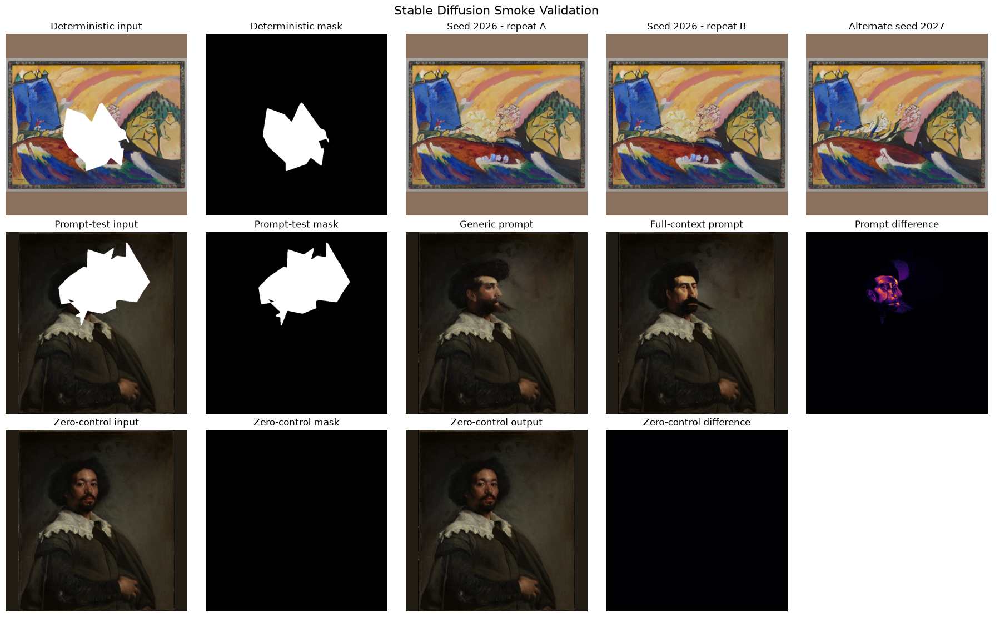

Rendered fixed-seed, alternate-seed, prompt, and zero-control smoke comparisons.


In [15]:
# ---------------------------------------------------------------------------
# Render smoke outputs and difference maps
# ---------------------------------------------------------------------------

deterministic_source_array = np.asarray(
    deterministic_prepared["source_image"],
    dtype=np.uint8,
)

contextual_source_array = np.asarray(
    contextual_prepared["source_image"],
    dtype=np.uint8,
)

zero_source_array = np.asarray(
    zero_prepared["source_image"],
    dtype=np.uint8,
)

context_difference_map = np.max(
    np.abs(
        context_generic_array.astype(np.int16)
        - context_full_array.astype(np.int16)
    ),
    axis=2,
)

zero_difference_map = np.max(
    np.abs(
        zero_source_array.astype(np.int16)
        - zero_output_array.astype(np.int16)
    ),
    axis=2,
)

figure, axes = plt.subplots(
    3,
    5,
    figsize=(18, 11),
    constrained_layout=True,
)

display_items = [
    (
        axes[0, 0],
        deterministic_source_array,
        "Deterministic input",
        None,
    ),
    (
        axes[0, 1],
        deterministic_prepared["binary_mask"],
        "Deterministic mask",
        "gray",
    ),
    (
        axes[0, 2],
        repeat_a_array,
        "Seed 2026 - repeat A",
        None,
    ),
    (
        axes[0, 3],
        repeat_b_array,
        "Seed 2026 - repeat B",
        None,
    ),
    (
        axes[0, 4],
        alternate_seed_array,
        f"Alternate seed {alternate_seed}",
        None,
    ),
    (
        axes[1, 0],
        contextual_source_array,
        "Prompt-test input",
        None,
    ),
    (
        axes[1, 1],
        contextual_prepared["binary_mask"],
        "Prompt-test mask",
        "gray",
    ),
    (
        axes[1, 2],
        context_generic_array,
        "Generic prompt",
        None,
    ),
    (
        axes[1, 3],
        context_full_array,
        "Full-context prompt",
        None,
    ),
    (
        axes[1, 4],
        context_difference_map,
        "Prompt difference",
        "inferno",
    ),
    (
        axes[2, 0],
        zero_source_array,
        "Zero-control input",
        None,
    ),
    (
        axes[2, 1],
        zero_prepared["binary_mask"],
        "Zero-control mask",
        "gray",
    ),
    (
        axes[2, 2],
        zero_output_array,
        "Zero-control output",
        None,
    ),
    (
        axes[2, 3],
        zero_difference_map,
        "Zero-control difference",
        "inferno",
    ),
]

for axis, image_array, title, colour_map in display_items:
    axis.imshow(
        image_array,
        cmap=colour_map,
    )
    axis.set_title(title)
    axis.axis("off")

axes[2, 4].axis("off")

figure.suptitle(
    "Stable Diffusion Smoke Validation",
    fontsize=16,
)

plt.show()

print(
    "Rendered fixed-seed, alternate-seed, prompt, "
    "and zero-control smoke comparisons."
)

In [16]:
# ---------------------------------------------------------------------------
# Batch 3 validation
# ---------------------------------------------------------------------------


def add_batch_3_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_3_smoke_inference",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_3_check(
    check_id="pipeline_model_identifier",
    description=(
        "The loaded pipeline reports the approved model."
    ),
    expected=configured_model["hf_model_id"],
    observed=pipeline_model_identifier,
    passed=(
        pipeline_model_identifier
        == configured_model["hf_model_id"]
    ),
)

add_batch_3_check(
    check_id="pipeline_revision_pin",
    description=(
        "The run uses the immutable approved model revision."
    ),
    expected=(
        "8a4288a76071f7280aedbdb3253bdb9e9d5d84bb"
    ),
    observed=configured_model["model_revision"],
    passed=(
        configured_model["model_revision"]
        == "8a4288a76071f7280aedbdb3253bdb9e9d5d84bb"
    ),
)

add_batch_3_check(
    check_id="pipeline_device",
    description=(
        "The pipeline uses CUDA without CPU fallback."
    ),
    expected="cuda",
    observed=EFFECTIVE_DEVICE,
    passed=EFFECTIVE_DEVICE == "cuda",
)

add_batch_3_check(
    check_id="pipeline_scheduler",
    description=(
        "The loaded pipeline uses DDIMScheduler."
    ),
    expected="DDIMScheduler",
    observed=pipeline_scheduler_name,
    passed=(
        pipeline_scheduler_name
        == "DDIMScheduler"
    ),
)

add_batch_3_check(
    check_id="safety_checker_policy",
    description=(
        "The safety checker is disabled according to the "
        "recorded fixed-dataset research policy."
    ),
    expected=True,
    observed=PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
    passed=PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)

add_batch_3_check(
    check_id="smoke_completion",
    description=(
        "All six smoke specifications completed."
    ),
    expected=6,
    observed=int(
        smoke_results_df["status"]
        .eq("completed")
        .sum()
    ),
    passed=(
        len(smoke_results_df) == 6
        and smoke_results_df["status"]
        .eq("completed")
        .all()
    ),
)

add_batch_3_check(
    check_id="smoke_execution_actions",
    description=(
        "Five smoke candidates use model inference and the "
        "zero control uses identity/no-op."
    ),
    expected={
        "stable_diffusion_inpaint": 5,
        "identity_noop": 1,
    },
    observed=(
        smoke_results_df[
            "execution_action"
        ]
        .value_counts()
        .to_dict()
    ),
    passed=(
        smoke_results_df[
            "execution_action"
        ]
        .value_counts()
        .to_dict()
        == {
            "stable_diffusion_inpaint": 5,
            "identity_noop": 1,
        }
    ),
)

add_batch_3_check(
    check_id="smoke_output_contract",
    description=(
        "Every smoke output reloads with the approved "
        "geometry, checksum, compositing, and zero policy."
    ),
    expected=6,
    observed=int(
        smoke_output_audit_df["passed"].sum()
    ),
    passed=(
        len(smoke_output_audit_df) == 6
        and smoke_output_audit_df[
            "passed"
        ].all()
    ),
    details=smoke_output_audit_df.to_dict(
        orient="records"
    ),
)

add_batch_3_check(
    check_id="fixed_seed_repeatability",
    description=(
        "Repeated inference with the same case, prompt, and "
        "seed satisfies the fixed numerical tolerance."
    ),
    expected=fixed_repeat_tolerance,
    observed=fixed_repeat_statistics,
    passed=fixed_repeat_passed,
)

add_batch_3_check(
    check_id="alternate_seed_sensitivity",
    description=(
        "Changing only the seed changes pixels inside the "
        "mask while preserving the outside exactly."
    ),
    expected={
        "inside_different_pixels": "> 0",
        "outside_different_pixels": 0,
    },
    observed=alternate_seed_statistics,
    passed=alternate_seed_passed,
)

add_batch_3_check(
    check_id="contextual_prompt_sensitivity",
    description=(
        "Changing only the prompt changes pixels inside the "
        "mask while preserving the outside exactly."
    ),
    expected={
        "inside_different_pixels": "> 0",
        "outside_different_pixels": 0,
    },
    observed=context_prompt_statistics,
    passed=context_prompt_passed,
)

add_batch_3_check(
    check_id="zero_control_identity",
    description=(
        "The zero-control output is pixel-identical to its "
        "input and performs no model inference."
    ),
    expected=True,
    observed=zero_pixel_exact,
    passed=(
        zero_pixel_exact
        and smoke_result(
            "zero_control"
        )["execution_action"]
        == "identity_noop"
    ),
)

smoke_seed_records = {
    row["smoke_label"]: int(row["seed"])
    for _, row in smoke_results_df.iterrows()
}

expected_smoke_seeds = {
    "deterministic_repeat_a": primary_seed,
    "deterministic_repeat_b": primary_seed,
    "alternate_seed": alternate_seed,
    "context_generic": primary_seed,
    "context_full": primary_seed,
    "zero_control": primary_seed,
}

add_batch_3_check(
    check_id="smoke_seed_records",
    description=(
        "Every smoke record retains its declared seed."
    ),
    expected=expected_smoke_seeds,
    observed=smoke_seed_records,
    passed=(
        smoke_seed_records
        == expected_smoke_seeds
    ),
)

retry_policy_valid = bool(
    smoke_results_df["attempt_count"]
    .ge(1)
    .all()
    and smoke_results_df["retry_count"]
    .ge(0)
    .all()
    and smoke_results_df["retry_count"]
    .le(
        configured_model["maximum_retries"]
    )
    .all()
)

add_batch_3_check(
    check_id="smoke_retry_records",
    description=(
        "Attempts and retries are explicit and remain "
        "within the approved limit."
    ),
    expected={
        "maximum_retries": configured_model[
            "maximum_retries"
        ],
        "seed_policy": "preserve_exact_seed",
    },
    observed={
        "maximum_observed_retry": int(
            smoke_results_df[
                "retry_count"
            ].max()
        ),
        "seed_policy": configured_model[
            "retry_seed_policy"
        ],
    },
    passed=retry_policy_valid,
)

smoke_paths_owned = bool(
    smoke_results_df["restored_path"]
    .astype(str)
    .str.startswith("work/smoke/")
    .all()
)

add_batch_3_check(
    check_id="smoke_output_ownership",
    description=(
        "All smoke outputs remain in the notebook-owned "
        "QA work directory."
    ),
    expected=True,
    observed=smoke_paths_owned,
    passed=smoke_paths_owned,
)

BATCH_3_VALIDATION_DF = VALIDATION.to_dataframe()

BATCH_3_ONLY_VALIDATION_DF = (
    BATCH_3_VALIDATION_DF.loc[
        BATCH_3_VALIDATION_DF[
            "validation_stage"
        ].eq("batch_3_smoke_inference")
    ]
    .reset_index(drop=True)
)

BATCH_3_VALIDATION_SUMMARY = VALIDATION.summary()

display(smoke_specifications_df)
display(
    smoke_results_df[
        [
            "smoke_label",
            "case_id",
            "prompt_variant_id",
            "seed",
            "execution_action",
            "runtime_seconds",
            "gpu_memory_before_bytes",
            "gpu_memory_after_bytes",
            "gpu_peak_memory_bytes",
            "retry_count",
            "attempt_count",
            "status",
            "issue",
        ]
    ]
)
display(smoke_output_audit_df)
display(smoke_comparison_df)
display(BATCH_3_ONLY_VALIDATION_DF)

print("Batch 3 validation summary:")
print(
    json.dumps(
        BATCH_3_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 3 passed. The pinned model, fixed-seed "
    "repeatability, seed sensitivity, prompt sensitivity, "
    "zero-control identity, and compositing policies are valid."
)

,smoke_label,methodological_role,case_id,painting_id,prompt_variant_id,seed,restored_path
0,deterministic_repeat_a,fixed_seed_repeat_reference,canonical__p039__loss_large,p039,p00_generic,2026,work/smoke/deterministic_repeat_a.png
1,deterministic_repeat_b,fixed_seed_repeat_replication,canonical__p039__loss_large,p039,p00_generic,2026,work/smoke/deterministic_repeat_b.png
2,alternate_seed,seed_sensitivity,canonical__p039__loss_large,p039,p00_generic,2027,work/smoke/alternate_seed.png
3,context_generic,prompt_ablation_generic,canonical__p001__loss_large,p001,p00_generic,2026,work/smoke/context_generic.png
4,context_full,prompt_ablation_contextual,canonical__p001__loss_large,p001,p04_full_context,2026,work/smoke/context_full.png
5,zero_control,identity_noop_control,canonical__p001__zero_control,p001,p00_generic,2026,work/smoke/zero_control.png


,smoke_label,case_id,prompt_variant_id,seed,execution_action,runtime_seconds,gpu_memory_before_bytes,gpu_memory_after_bytes,gpu_peak_memory_bytes,retry_count,attempt_count,status,issue
0,deterministic_repeat_a,canonical__p039__loss_large,p00_generic,2026,stable_diffusion_inpaint,13.940177,2160581632,2169101824,2809580032,0,1,completed,
1,deterministic_repeat_b,canonical__p039__loss_large,p00_generic,2026,stable_diffusion_inpaint,7.257062,2169101824,2169101824,2809580032,0,1,completed,
2,alternate_seed,canonical__p039__loss_large,p00_generic,2027,stable_diffusion_inpaint,7.539526,2169101824,2169101824,2809580032,0,1,completed,
3,context_generic,canonical__p001__loss_large,p00_generic,2026,stable_diffusion_inpaint,7.559344,2169101824,2169101824,2809580032,0,1,completed,
4,context_full,canonical__p001__loss_large,p04_full_context,2026,stable_diffusion_inpaint,7.700952,2169101824,2169101824,2809580032,0,1,completed,
5,zero_control,canonical__p001__zero_control,p00_generic,2026,identity_noop,0.583956,2169101824,2169101824,2169101824,0,1,completed,


,candidate_id,case_id,file_exists,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,zero_control_valid,passed,details,smoke_label,methodological_role
0,smoke__deterministic_repeat_a,canonical__p039__loss_large,True,True,True,0,49001,True,True,,deterministic_repeat_a,fixed_seed_repeat_reference
1,smoke__deterministic_repeat_b,canonical__p039__loss_large,True,True,True,0,49001,True,True,,deterministic_repeat_b,fixed_seed_repeat_replication
2,smoke__alternate_seed,canonical__p039__loss_large,True,True,True,0,49001,True,True,,alternate_seed,seed_sensitivity
3,smoke__context_generic,canonical__p001__loss_large,True,True,True,0,70792,True,True,,context_generic,prompt_ablation_generic
4,smoke__context_full,canonical__p001__loss_large,True,True,True,0,70792,True,True,,context_full,prompt_ablation_contextual
5,smoke__zero_control,canonical__p001__zero_control,True,True,True,0,0,True,True,,zero_control,identity_noop_control


,comparison_id,reference,comparison,maximum_absolute_difference,mean_absolute_difference,different_pixel_fraction,inside_different_pixels,outside_different_pixels,passed
0,fixed_seed_repeat,deterministic_repeat_a,deterministic_repeat_b,0,0.000000,0.000000,0,0,True
1,alternate_seed,deterministic_repeat_a,alternate_seed,206,3.152638,0.083077,49001,0,True
2,contextual_prompt,context_generic,context_full,156,1.138023,0.119407,70429,0,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_inference,pipeline_model_identifier,The loaded pipeline reports the approved model.,blocking,stable-diffusion-v1-5/stable-diffusion-inpainting,stable-diffusion-v1-5/stable-diffusion-inpainting,True,
1,batch_3_smoke_inference,pipeline_revision_pin,The run uses the immutable approved model revi...,blocking,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,True,
2,batch_3_smoke_inference,pipeline_device,The pipeline uses CUDA without CPU fallback.,blocking,cuda,cuda,True,
3,batch_3_smoke_inference,pipeline_scheduler,The loaded pipeline uses DDIMScheduler.,blocking,DDIMScheduler,DDIMScheduler,True,
4,batch_3_smoke_inference,safety_checker_policy,The safety checker is disabled according to th...,blocking,True,True,True,
5,batch_3_smoke_inference,smoke_completion,All six smoke specifications completed.,blocking,6,6,True,
6,batch_3_smoke_inference,smoke_execution_actions,Five smoke candidates use model inference and ...,blocking,"{""identity_noop"": 1, ""stable_diffusion_inpaint...","{""identity_noop"": 1, ""stable_diffusion_inpaint...",True,
7,batch_3_smoke_inference,smoke_output_contract,Every smoke output reloads with the approved g...,blocking,6,6,True,"[{""candidate_id"": ""smoke__deterministic_repeat..."
8,batch_3_smoke_inference,fixed_seed_repeatability,"Repeated inference with the same case, prompt,...",blocking,"{""maximum_absolute_difference"": 1, ""maximum_di...","{""different_pixel_fraction"": 0.0, ""inside_diff...",True,
9,batch_3_smoke_inference,alternate_seed_sensitivity,Changing only the seed changes pixels inside t...,blocking,"{""inside_different_pixels"": ""> 0"", ""outside_di...","{""different_pixel_fraction"": 0.083077324761284...",True,


Batch 3 validation summary:
{
  "check_count": 100,
  "passed_count": 100,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 3 passed. The pinned model, fixed-seed repeatability, seed sensitivity, prompt sensitivity, zero-control identity, and compositing policies are valid.


## Batch 4 - Full Stable Diffusion Candidate Execution

This batch:

- reuses the validated pinned pipeline or reloads it from the local cache;
- verifies available storage and estimates execution time;
- executes all 1,010 planned candidates;
- performs 960 Stable Diffusion inference operations;
- performs 50 identity/no-op zero-control operations;
- prints progress every 10 candidates;
- writes an atomic checkpoint every five candidates;
- strictly resumes only candidates whose IDs, input checksums, mask checksums, model revision, configuration fingerprint, output geometry, path, and restored checksum remain valid;
- records runtime, GPU memory, retries, attempts, timestamps, failures, and execution actions;
- verifies complete execution and filesystem accounting.

Canonical candidate CSVs and manifests are not persisted until the later persistence batch.

The expected first-run duration is approximately two hours on the recorded RTX 3060 Laptop GPU. If execution is interrupted, rerun the execution cell. At most four uncheckpointed candidates may be regenerated.

In [17]:
import shutil

from restoration_eval.restoration_stable_diffusion import (
    load_stable_diffusion_pipeline,
    run_stable_diffusion_candidates,
)


# ---------------------------------------------------------------------------
# Restore the pipeline after a kernel restart if necessary
# ---------------------------------------------------------------------------

pipeline_reloaded_for_batch_4 = False

if (
    "stable_diffusion_pipeline"
    not in globals()
    or stable_diffusion_pipeline is None
):
    print(
        "Pipeline is not present in memory; loading it from "
        "the pinned local cache."
    )

    pipeline_reload_started = time.perf_counter()

    stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
        load_stable_diffusion_pipeline(
            sd_config
        )
    )

    pipeline_reload_seconds = (
        time.perf_counter()
        - pipeline_reload_started
    )

    pipeline_reloaded_for_batch_4 = True

    print(
        "Pipeline reload seconds:",
        round(
            pipeline_reload_seconds,
            3,
        ),
    )
else:
    print(
        "Reusing the smoke-validated pipeline already "
        "loaded in GPU memory."
    )


# ---------------------------------------------------------------------------
# Execution-time and storage estimates
# ---------------------------------------------------------------------------

completed_smoke_inference_runtimes = (
    smoke_results_df.loc[
        smoke_results_df[
            "execution_action"
        ].eq("stable_diffusion_inpaint"),
        "runtime_seconds",
    ]
    .astype(float)
)

steady_smoke_runtime_seconds = float(
    completed_smoke_inference_runtimes.iloc[1:]
    .median()
)

zero_control_smoke_runtime_seconds = float(
    smoke_results_df.loc[
        smoke_results_df[
            "execution_action"
        ].eq("identity_noop"),
        "runtime_seconds",
    ]
    .astype(float)
    .median()
)

estimated_full_execution_seconds = (
    steady_smoke_runtime_seconds
    * EXPECTED_COUNTS[
        "model_inference_candidate_count"
    ]
    + zero_control_smoke_runtime_seconds
    * EXPECTED_COUNTS[
        "zero_control_case_count"
    ]
)

estimated_full_execution_hours = (
    estimated_full_execution_seconds
    / 3600
)

smoke_file_sizes = pd.Series(
    [
        (
            OUTPUT_ROOT
            / restored_path
        ).stat().st_size
        for restored_path
        in smoke_results_df["restored_path"]
    ],
    dtype="int64",
)

estimated_restored_bytes = int(
    smoke_file_sizes.mean()
    * EXPECTED_COUNTS[
        "restored_file_count"
    ]
)

disk_usage = shutil.disk_usage(
    OUTPUT_ROOT
)

minimum_free_bytes = max(
    estimated_restored_bytes * 2,
    2 * 1024 ** 3,
)

storage_preflight_passed = bool(
    disk_usage.free
    >= minimum_free_bytes
)


# ---------------------------------------------------------------------------
# Existing checkpoint and candidate-output state
# ---------------------------------------------------------------------------

checkpoint_path = OUTPUTS["checkpoint"]

if checkpoint_path.is_file():
    existing_checkpoint_df = pd.read_csv(
        checkpoint_path,
        low_memory=False,
    )

    existing_checkpoint_rows = len(
        existing_checkpoint_df
    )
else:
    existing_checkpoint_df = pd.DataFrame()
    existing_checkpoint_rows = 0

existing_canonical_image_count = len(
    list(
        OUTPUTS["restored_images"]
        .rglob("*.png")
    )
)

configuration_fingerprints = set(
    candidate_plan_df[
        "configuration_fingerprint"
    ]
    .astype(str)
)

execution_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": "pipeline_device",
            "observed": EFFECTIVE_DEVICE,
            "required": "cuda",
            "passed": EFFECTIVE_DEVICE == "cuda",
        },
        {
            "preflight_item": "candidate_count",
            "observed": len(candidate_plan_df),
            "required": EXPECTED_COUNTS[
                "candidate_count"
            ],
            "passed": (
                len(candidate_plan_df)
                == EXPECTED_COUNTS[
                    "candidate_count"
                ]
            ),
        },
        {
            "preflight_item": (
                "configuration_fingerprint_count"
            ),
            "observed": len(
                configuration_fingerprints
            ),
            "required": 1,
            "passed": (
                len(configuration_fingerprints)
                == 1
            ),
        },
        {
            "preflight_item": "available_storage_bytes",
            "observed": disk_usage.free,
            "required": minimum_free_bytes,
            "passed": storage_preflight_passed,
        },
        {
            "preflight_item": "resume_enabled",
            "observed": configured_execution[
                "resume_enabled"
            ],
            "required": True,
            "passed": bool(
                configured_execution[
                    "resume_enabled"
                ]
            ),
        },
        {
            "preflight_item": (
                "progress_interval_candidates"
            ),
            "observed": configured_execution[
                "progress_interval_candidates"
            ],
            "required": 10,
            "passed": (
                configured_execution[
                    "progress_interval_candidates"
                ]
                == 10
            ),
        },
        {
            "preflight_item": (
                "checkpoint_interval_candidates"
            ),
            "observed": configured_execution[
                "checkpoint_interval_candidates"
            ],
            "required": 5,
            "passed": (
                configured_execution[
                    "checkpoint_interval_candidates"
                ]
                == 5
            ),
        },
    ]
)

display(execution_preflight_df)

if not execution_preflight_df["passed"].all():
    raise RuntimeError(
        "Batch 4 execution preflight failed."
    )

print(
    "Estimated inference hours:",
    round(
        estimated_full_execution_hours,
        2,
    ),
)
print(
    "Estimated restored-image storage (MiB):",
    round(
        estimated_restored_bytes
        / (1024 ** 2),
        1,
    ),
)
print(
    "Available storage (GiB):",
    round(
        disk_usage.free
        / (1024 ** 3),
        2,
    ),
)
print(
    "Existing checkpoint rows:",
    existing_checkpoint_rows,
)
print(
    "Existing canonical candidate images:",
    existing_canonical_image_count,
)
print(
    "Pipeline reloaded in this batch:",
    pipeline_reloaded_for_batch_4,
)

Reusing the smoke-validated pipeline already loaded in GPU memory.


,preflight_item,observed,required,passed
0,pipeline_device,cuda,cuda,True
1,candidate_count,1010,1010,True
2,configuration_fingerprint_count,1,1,True
3,available_storage_bytes,954626592768,2147483648,True
4,resume_enabled,True,True,True
5,progress_interval_candidates,10,10,True
6,checkpoint_interval_candidates,5,5,True


Estimated inference hours: 2.02
Estimated restored-image storage (MiB): 688.1
Available storage (GiB): 889.07
Existing checkpoint rows: 0
Existing canonical candidate images: 0
Pipeline reloaded in this batch: False


In [18]:
# ---------------------------------------------------------------------------
# Full normalized, resumable candidate execution
# ---------------------------------------------------------------------------

FULL_EXECUTION_STARTED_AT_UTC = utc_now_iso()
full_execution_clock = time.perf_counter()

print(
    "Starting full Stable Diffusion execution:",
    FULL_EXECUTION_STARTED_AT_UTC,
)
print(
    "Planned candidates:",
    len(candidate_plan_df),
)
print(
    "Progress will be printed every",
    configured_execution[
        "progress_interval_candidates"
    ],
    "candidates.",
)
print(
    "Checkpoint will be updated every",
    configured_execution[
        "checkpoint_interval_candidates"
    ],
    "candidates.",
)

try:
    candidates_df = run_stable_diffusion_candidates(
        candidate_plan_df,
        pipeline=stable_diffusion_pipeline,
        device=EFFECTIVE_DEVICE,
        project_root=PROJECT_ROOT,
        notebook_output_root=OUTPUT_ROOT,
        config=sd_config,
        checkpoint_path=checkpoint_path,
        progress_callback=print,
    )
except KeyboardInterrupt:
    elapsed_before_interrupt = (
        time.perf_counter()
        - full_execution_clock
    )

    checkpoint_rows_after_interrupt = (
        len(
            pd.read_csv(
                checkpoint_path,
                low_memory=False,
            )
        )
        if checkpoint_path.is_file()
        else 0
    )

    print(
        "Execution interrupted after seconds:",
        round(
            elapsed_before_interrupt,
            3,
        ),
    )
    print(
        "Safely checkpointed candidate rows:",
        checkpoint_rows_after_interrupt,
    )
    print(
        "Rerun this cell to strictly validate and resume."
    )

    raise

FULL_EXECUTION_COMPLETED_AT_UTC = utc_now_iso()

full_execution_wall_seconds = (
    time.perf_counter()
    - full_execution_clock
)

print(
    "Full execution completed:",
    FULL_EXECUTION_COMPLETED_AT_UTC,
)
print(
    "Full execution wall seconds:",
    round(
        full_execution_wall_seconds,
        3,
    ),
)
print(
    "Full execution wall hours:",
    round(
        full_execution_wall_seconds
        / 3600,
        3,
    ),
)
print(
    "Returned candidate rows:",
    len(candidates_df),
)

Starting full Stable Diffusion execution: 2026-08-24T11:30:42.890386Z
Planned candidates: 1010
Progress will be printed every 10 candidates.
Checkpoint will be updated every 5 candidates.


100%|██████████| 30/30 [00:07<00:00,  4.24it/s]


Stable Diffusion candidates: 10/1010 | completed=10 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.28it/s]


Stable Diffusion candidates: 20/1010 | completed=20 | failed=0


100%|██████████| 30/30 [00:10<00:00,  3.00it/s]


Stable Diffusion candidates: 30/1010 | completed=30 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.07it/s]


Stable Diffusion candidates: 40/1010 | completed=40 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.98it/s]


Stable Diffusion candidates: 50/1010 | completed=50 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.80it/s]


Stable Diffusion candidates: 60/1010 | completed=60 | failed=0


100%|██████████| 30/30 [00:12<00:00,  2.44it/s]


Stable Diffusion candidates: 70/1010 | completed=70 | failed=0


100%|██████████| 30/30 [00:12<00:00,  2.35it/s]


Stable Diffusion candidates: 80/1010 | completed=80 | failed=0


100%|██████████| 30/30 [00:12<00:00,  2.45it/s]


Stable Diffusion candidates: 90/1010 | completed=90 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.12it/s]


Stable Diffusion candidates: 100/1010 | completed=100 | failed=0


100%|██████████| 30/30 [00:12<00:00,  2.40it/s]


Stable Diffusion candidates: 110/1010 | completed=110 | failed=0


100%|██████████| 30/30 [00:13<00:00,  2.25it/s]


Stable Diffusion candidates: 120/1010 | completed=120 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.07it/s]


Stable Diffusion candidates: 130/1010 | completed=130 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.04it/s]


Stable Diffusion candidates: 140/1010 | completed=140 | failed=0


100%|██████████| 30/30 [00:15<00:00,  1.98it/s]


Stable Diffusion candidates: 150/1010 | completed=150 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.08it/s]


Stable Diffusion candidates: 160/1010 | completed=160 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.08it/s]


Stable Diffusion candidates: 170/1010 | completed=170 | failed=0


100%|██████████| 30/30 [00:13<00:00,  2.30it/s]


Stable Diffusion candidates: 180/1010 | completed=180 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.09it/s]


Stable Diffusion candidates: 190/1010 | completed=190 | failed=0


100%|██████████| 30/30 [00:15<00:00,  1.97it/s]


Stable Diffusion candidates: 200/1010 | completed=200 | failed=0


100%|██████████| 30/30 [00:13<00:00,  2.18it/s]


Stable Diffusion candidates: 210/1010 | completed=210 | failed=0


100%|██████████| 30/30 [00:13<00:00,  2.20it/s]


Stable Diffusion candidates: 220/1010 | completed=220 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.10it/s]


Stable Diffusion candidates: 230/1010 | completed=230 | failed=0


100%|██████████| 30/30 [00:16<00:00,  1.80it/s]


Stable Diffusion candidates: 240/1010 | completed=240 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.50it/s]


Stable Diffusion candidates: 250/1010 | completed=250 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.79it/s]


Stable Diffusion candidates: 260/1010 | completed=260 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.88it/s]


Stable Diffusion candidates: 270/1010 | completed=270 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Stable Diffusion candidates: 280/1010 | completed=280 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.86it/s]


Stable Diffusion candidates: 290/1010 | completed=290 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.99it/s]


Stable Diffusion candidates: 300/1010 | completed=300 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.02it/s]


Stable Diffusion candidates: 310/1010 | completed=310 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.98it/s]


Stable Diffusion candidates: 320/1010 | completed=320 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Stable Diffusion candidates: 330/1010 | completed=330 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.98it/s]


Stable Diffusion candidates: 340/1010 | completed=340 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.84it/s]


Stable Diffusion candidates: 350/1010 | completed=350 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.85it/s]


Stable Diffusion candidates: 360/1010 | completed=360 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.87it/s]


Stable Diffusion candidates: 370/1010 | completed=370 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.90it/s]


Stable Diffusion candidates: 380/1010 | completed=380 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.94it/s]


Stable Diffusion candidates: 390/1010 | completed=390 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.87it/s]


Stable Diffusion candidates: 400/1010 | completed=400 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.96it/s]


Stable Diffusion candidates: 410/1010 | completed=410 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.86it/s]


Stable Diffusion candidates: 420/1010 | completed=420 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Stable Diffusion candidates: 430/1010 | completed=430 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.89it/s]


Stable Diffusion candidates: 440/1010 | completed=440 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.00it/s]


Stable Diffusion candidates: 450/1010 | completed=450 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.89it/s]


Stable Diffusion candidates: 460/1010 | completed=460 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.67it/s]


Stable Diffusion candidates: 470/1010 | completed=470 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.92it/s]


Stable Diffusion candidates: 480/1010 | completed=480 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.02it/s]


Stable Diffusion candidates: 490/1010 | completed=490 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Stable Diffusion candidates: 500/1010 | completed=500 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.88it/s]


Stable Diffusion candidates: 510/1010 | completed=510 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.83it/s]


Stable Diffusion candidates: 520/1010 | completed=520 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.97it/s]


Stable Diffusion candidates: 530/1010 | completed=530 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.96it/s]


Stable Diffusion candidates: 540/1010 | completed=540 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.92it/s]


Stable Diffusion candidates: 550/1010 | completed=550 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.80it/s]


Stable Diffusion candidates: 560/1010 | completed=560 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.56it/s]


Stable Diffusion candidates: 570/1010 | completed=570 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.95it/s]


Stable Diffusion candidates: 580/1010 | completed=580 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Stable Diffusion candidates: 590/1010 | completed=590 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.05it/s]


Stable Diffusion candidates: 600/1010 | completed=600 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.09it/s]


Stable Diffusion candidates: 610/1010 | completed=610 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.05it/s]


Stable Diffusion candidates: 620/1010 | completed=620 | failed=0


100%|██████████| 30/30 [00:10<00:00,  3.00it/s]


Stable Diffusion candidates: 630/1010 | completed=630 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.97it/s]


Stable Diffusion candidates: 640/1010 | completed=640 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.15it/s]


Stable Diffusion candidates: 650/1010 | completed=650 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Stable Diffusion candidates: 660/1010 | completed=660 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.86it/s]


Stable Diffusion candidates: 670/1010 | completed=670 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Stable Diffusion candidates: 680/1010 | completed=680 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.02it/s]


Stable Diffusion candidates: 690/1010 | completed=690 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.17it/s]


Stable Diffusion candidates: 700/1010 | completed=700 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.05it/s]


Stable Diffusion candidates: 710/1010 | completed=710 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.17it/s]


Stable Diffusion candidates: 720/1010 | completed=720 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Stable Diffusion candidates: 730/1010 | completed=730 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.06it/s]


Stable Diffusion candidates: 740/1010 | completed=740 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.46it/s]


Stable Diffusion candidates: 750/1010 | completed=750 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Stable Diffusion candidates: 760/1010 | completed=760 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.14it/s]


Stable Diffusion candidates: 770/1010 | completed=770 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.22it/s]


Stable Diffusion candidates: 780/1010 | completed=780 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.23it/s]


Stable Diffusion candidates: 790/1010 | completed=790 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Stable Diffusion candidates: 800/1010 | completed=800 | failed=0


100%|██████████| 30/30 [00:14<00:00,  2.14it/s]


Stable Diffusion candidates: 810/1010 | completed=810 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.73it/s]


Stable Diffusion candidates: 820/1010 | completed=820 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.51it/s]


Stable Diffusion candidates: 830/1010 | completed=830 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.52it/s]


Stable Diffusion candidates: 840/1010 | completed=840 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.75it/s]


Stable Diffusion candidates: 850/1010 | completed=850 | failed=0


100%|██████████| 30/30 [00:12<00:00,  2.45it/s]


Stable Diffusion candidates: 860/1010 | completed=860 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.74it/s]


Stable Diffusion candidates: 870/1010 | completed=870 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.06it/s]


Stable Diffusion candidates: 880/1010 | completed=880 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Stable Diffusion candidates: 890/1010 | completed=890 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Stable Diffusion candidates: 900/1010 | completed=900 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.16it/s]


Stable Diffusion candidates: 910/1010 | completed=910 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.09it/s]


Stable Diffusion candidates: 920/1010 | completed=920 | failed=0


100%|██████████| 30/30 [00:10<00:00,  2.89it/s]


Stable Diffusion candidates: 930/1010 | completed=930 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.10it/s]


Stable Diffusion candidates: 940/1010 | completed=940 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.33it/s]


Stable Diffusion candidates: 950/1010 | completed=950 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Stable Diffusion candidates: 960/1010 | completed=960 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.20it/s]


Stable Diffusion candidates: 970/1010 | completed=970 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Stable Diffusion candidates: 980/1010 | completed=980 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.16it/s]


Stable Diffusion candidates: 990/1010 | completed=990 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.20it/s]


Stable Diffusion candidates: 1000/1010 | completed=1000 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Stable Diffusion candidates: 1010/1010 | completed=1010 | failed=0
Full execution completed: 2026-08-24T14:38:56.945530Z
Full execution wall seconds: 11294.062
Full execution wall hours: 3.137
Returned candidate rows: 1010


In [19]:
# ---------------------------------------------------------------------------
# Full-execution accounting
# ---------------------------------------------------------------------------

completed_candidates_df = (
    candidates_df.loc[
        candidates_df["status"].eq(
            "completed"
        )
    ]
    .copy()
)

failed_candidates_df = (
    candidates_df.loc[
        candidates_df["status"].eq(
            "failed"
        )
    ]
    .copy()
)

zero_control_execution_df = (
    candidates_df.loc[
        candidates_df["case_id"]
        .astype(str)
        .isin(zero_control_case_ids)
    ]
    .copy()
)

nonzero_execution_df = (
    candidates_df.loc[
        ~candidates_df["case_id"]
        .astype(str)
        .isin(zero_control_case_ids)
    ]
    .copy()
)

candidate_execution_role_summary_df = (
    candidates_df
    .groupby(
        "execution_role",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        completed_count=(
            "status",
            lambda values: int(
                values.eq("completed").sum()
            ),
        ),
        failed_count=(
            "status",
            lambda values: int(
                values.eq("failed").sum()
            ),
        ),
        total_runtime_seconds=(
            "runtime_seconds",
            "sum",
        ),
        mean_runtime_seconds=(
            "runtime_seconds",
            "mean",
        ),
        median_runtime_seconds=(
            "runtime_seconds",
            "median",
        ),
        maximum_runtime_seconds=(
            "runtime_seconds",
            "max",
        ),
        maximum_retry_count=(
            "retry_count",
            "max",
        ),
        maximum_gpu_peak_bytes=(
            "gpu_peak_memory_bytes",
            "max",
        ),
    )
    .reset_index()
)

candidate_execution_action_summary_df = (
    candidates_df
    .groupby(
        [
            "execution_role",
            "execution_action",
            "status",
        ],
        sort=True,
        dropna=False,
    )
    .size()
    .reset_index(
        name="candidate_count"
    )
)

candidate_retry_summary_df = (
    candidates_df
    .groupby(
        [
            "retry_count",
            "attempt_count",
            "status",
        ],
        sort=True,
        dropna=False,
    )
    .size()
    .reset_index(
        name="candidate_count"
    )
)


# ---------------------------------------------------------------------------
# Checkpoint and planned-file reconciliation
# ---------------------------------------------------------------------------

if not checkpoint_path.is_file():
    raise FileNotFoundError(
        "The full-execution checkpoint is missing."
    )

final_checkpoint_df = pd.read_csv(
    checkpoint_path,
    low_memory=False,
)

planned_output_audit_df = (
    candidates_df[
        [
            "candidate_id",
            "case_id",
            "execution_role",
            "restored_path",
            "status",
        ]
    ]
    .copy()
)

planned_output_audit_df[
    "absolute_path"
] = (
    planned_output_audit_df[
        "restored_path"
    ]
    .map(
        lambda relative_path: (
            OUTPUT_ROOT
            / relative_path
        )
    )
)

planned_output_audit_df[
    "file_exists"
] = (
    planned_output_audit_df[
        "absolute_path"
    ]
    .map(
        lambda path: path.is_file()
    )
)

planned_output_audit_df[
    "size_bytes"
] = (
    planned_output_audit_df[
        "absolute_path"
    ]
    .map(
        lambda path: (
            path.stat().st_size
            if path.is_file()
            else 0
        )
    )
)

planned_output_audit_df[
    "nonempty"
] = (
    planned_output_audit_df[
        "size_bytes"
    ]
    .gt(0)
)

observed_candidate_ids = set(
    candidates_df["candidate_id"]
    .astype(str)
)

planned_candidate_ids = set(
    candidate_plan_df["candidate_id"]
    .astype(str)
)

checkpoint_candidate_ids = set(
    final_checkpoint_df["candidate_id"]
    .astype(str)
)


# ---------------------------------------------------------------------------
# Batch 4 validation
# ---------------------------------------------------------------------------


def add_batch_4_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_4_full_execution",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_4_check(
    check_id="returned_candidate_count",
    description=(
        "Full execution returned exactly 1,010 "
        "candidate records."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=len(candidates_df),
    passed=(
        len(candidates_df)
        == EXPECTED_COUNTS["candidate_count"]
    ),
)

add_batch_4_check(
    check_id="candidate_identity_reconciliation",
    description=(
        "Returned candidate IDs exactly match the "
        "predeclared plan."
    ),
    expected=len(planned_candidate_ids),
    observed=len(observed_candidate_ids),
    passed=(
        observed_candidate_ids
        == planned_candidate_ids
    ),
)

add_batch_4_check(
    check_id="candidate_completion",
    description=(
        "Every planned candidate completed and no "
        "candidate failed."
    ),
    expected={
        "completed": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "failed": 0,
    },
    observed={
        "completed": len(
            completed_candidates_df
        ),
        "failed": len(
            failed_candidates_df
        ),
    },
    passed=(
        len(completed_candidates_df)
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
        and failed_candidates_df.empty
    ),
)

zero_control_actions_valid = bool(
    zero_control_execution_df[
        "execution_action"
    ]
    .isin(
        {
            "identity_noop",
            "reused_validated",
        }
    )
    .all()
)

nonzero_actions_valid = bool(
    nonzero_execution_df[
        "execution_action"
    ]
    .isin(
        {
            "stable_diffusion_inpaint",
            "reused_validated",
        }
    )
    .all()
)

add_batch_4_check(
    check_id="execution_action_policy",
    description=(
        "Zero controls use identity/no-op and nonzero "
        "cases use Stable Diffusion inference or strict reuse."
    ),
    expected=True,
    observed={
        "zero_control_actions_valid": (
            zero_control_actions_valid
        ),
        "nonzero_actions_valid": (
            nonzero_actions_valid
        ),
    },
    passed=(
        zero_control_actions_valid
        and nonzero_actions_valid
    ),
)

add_batch_4_check(
    check_id="restored_file_count",
    description=(
        "Every candidate has one nonempty restored PNG."
    ),
    expected=EXPECTED_COUNTS[
        "restored_file_count"
    ],
    observed={
        "existing": int(
            planned_output_audit_df[
                "file_exists"
            ].sum()
        ),
        "nonempty": int(
            planned_output_audit_df[
                "nonempty"
            ].sum()
        ),
    },
    passed=(
        planned_output_audit_df[
            "file_exists"
        ].all()
        and planned_output_audit_df[
            "nonempty"
        ].all()
    ),
)

add_batch_4_check(
    check_id="checkpoint_reconciliation",
    description=(
        "The final atomic checkpoint contains exactly "
        "the complete candidate plan."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=len(final_checkpoint_df),
    passed=(
        len(final_checkpoint_df)
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
        and final_checkpoint_df[
            "candidate_id"
        ].is_unique
        and checkpoint_candidate_ids
        == planned_candidate_ids
    ),
)

seed_reconciliation_df = (
    candidate_plan_df[
        [
            "candidate_id",
            "seed",
        ]
    ]
    .merge(
        candidates_df[
            [
                "candidate_id",
                "seed",
            ]
        ],
        on="candidate_id",
        how="outer",
        validate="one_to_one",
        suffixes=(
            "_planned",
            "_observed",
        ),
    )
)

seed_records_valid = bool(
    seed_reconciliation_df[
        "seed_planned"
    ]
    .eq(
        seed_reconciliation_df[
            "seed_observed"
        ]
    )
    .all()
)

add_batch_4_check(
    check_id="seed_reconciliation",
    description=(
        "Every executed candidate retains its "
        "predeclared seed."
    ),
    expected=True,
    observed=seed_records_valid,
    passed=seed_records_valid,
)

fingerprint_records_valid = bool(
    candidates_df[
        "configuration_fingerprint"
    ]
    .astype(str)
    .eq(
        candidate_plan_df.set_index(
            "candidate_id"
        )
        .loc[
            candidates_df["candidate_id"],
            "configuration_fingerprint",
        ]
        .astype(str)
        .to_numpy()
    )
    .all()
)

add_batch_4_check(
    check_id="configuration_fingerprint",
    description=(
        "Every executed candidate retains the exact "
        "approved configuration fingerprint."
    ),
    expected=True,
    observed=fingerprint_records_valid,
    passed=fingerprint_records_valid,
)

retry_records_valid = bool(
    candidates_df["retry_count"]
    .ge(0)
    .all()
    and candidates_df["retry_count"]
    .le(
        configured_model[
            "maximum_retries"
        ]
    )
    .all()
    and candidates_df[
        "attempt_count"
    ]
    .ge(1)
    .all()
)

add_batch_4_check(
    check_id="retry_accounting",
    description=(
        "Every attempt and retry is explicit and "
        "within the configured limit."
    ),
    expected={
        "maximum_retries": configured_model[
            "maximum_retries"
        ],
    },
    observed={
        "maximum_retry_count": int(
            candidates_df[
                "retry_count"
            ].max()
        ),
        "maximum_attempt_count": int(
            candidates_df[
                "attempt_count"
            ].max()
        ),
    },
    passed=retry_records_valid,
)

BATCH_4_VALIDATION_DF = VALIDATION.to_dataframe()

BATCH_4_ONLY_VALIDATION_DF = (
    BATCH_4_VALIDATION_DF.loc[
        BATCH_4_VALIDATION_DF[
            "validation_stage"
        ].eq("batch_4_full_execution")
    ]
    .reset_index(drop=True)
)

BATCH_4_VALIDATION_SUMMARY = VALIDATION.summary()

display(candidate_execution_role_summary_df)
display(candidate_execution_action_summary_df)
display(candidate_retry_summary_df)

if not failed_candidates_df.empty:
    display(
        failed_candidates_df[
            [
                "candidate_id",
                "case_id",
                "execution_role",
                "seed",
                "retry_count",
                "attempt_count",
                "issue",
            ]
        ]
    )

display(BATCH_4_ONLY_VALIDATION_DF)

print("Batch 4 validation summary:")
print(
    json.dumps(
        BATCH_4_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 4 passed. All 1,010 candidates completed, "
    "all restored files exist, and the atomic checkpoint "
    "reconciles exactly with the predeclared plan."
)

,execution_role,candidate_count,completed_count,failed_count,total_runtime_seconds,mean_runtime_seconds,median_runtime_seconds,maximum_runtime_seconds,maximum_retry_count,maximum_gpu_peak_bytes
0,primary,410,410,0,4295.998665,10.478046,10.909823,19.297526,0,2809580032
1,prompt_context,480,480,0,5487.122616,11.431505,10.861430,18.630974,0,2809580032
2,uncertainty_extension,120,120,0,1498.000737,12.483339,11.474741,17.285340,0,2809580032


,execution_role,execution_action,status,candidate_count
0,primary,identity_noop,completed,50
1,primary,stable_diffusion_inpaint,completed,360
2,prompt_context,stable_diffusion_inpaint,completed,480
3,uncertainty_extension,stable_diffusion_inpaint,completed,120


,retry_count,attempt_count,status,candidate_count
0,0,1,completed,1010


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_full_execution,returned_candidate_count,"Full execution returned exactly 1,010 candidat...",blocking,1010,1010,True,
1,batch_4_full_execution,candidate_identity_reconciliation,Returned candidate IDs exactly match the prede...,blocking,1010,1010,True,
2,batch_4_full_execution,candidate_completion,Every planned candidate completed and no candi...,blocking,"{""completed"": 1010, ""failed"": 0}","{""completed"": 1010, ""failed"": 0}",True,
3,batch_4_full_execution,execution_action_policy,Zero controls use identity/no-op and nonzero c...,blocking,True,"{""nonzero_actions_valid"": true, ""zero_control_...",True,
4,batch_4_full_execution,restored_file_count,Every candidate has one nonempty restored PNG.,blocking,1010,"{""existing"": 1010, ""nonempty"": 1010}",True,
5,batch_4_full_execution,checkpoint_reconciliation,The final atomic checkpoint contains exactly t...,blocking,1010,1010,True,
6,batch_4_full_execution,seed_reconciliation,Every executed candidate retains its predeclar...,blocking,True,True,True,
7,batch_4_full_execution,configuration_fingerprint,Every executed candidate retains the exact app...,blocking,True,True,True,
8,batch_4_full_execution,retry_accounting,Every attempt and retry is explicit and within...,blocking,"{""maximum_retries"": 1}","{""maximum_attempt_count"": 1, ""maximum_retry_co...",True,


Batch 4 validation summary:
{
  "check_count": 109,
  "passed_count": 109,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 4 passed. All 1,010 candidates completed, all restored files exist, and the atomic checkpoint reconciles exactly with the predeclared plan.


## Batch 5 - Scientific and Filesystem Validation

This batch independently reloads and validates every persisted Stable Diffusion candidate.

Validation covers:

- normalized checkpoint schema and candidate identity;
- exact record and file cardinalities;
- image readability, dimensions, mode, and recorded checksums;
- exact zero-control identity;
- positive inside-mask change for every non-zero candidate;
- exact outside-mask invariance;
- stale, missing, orphaned, and empty-file detection;
- candidate-path ownership and agreement with the predeclared plan;
- consolidated evidence by experiment and execution role.

These checks establish execution and spatial integrity. They do not imply that generated content is historically accurate, semantically correct, or visually acceptable.

In [20]:
from time import perf_counter

from restoration_eval.restoration_stable_diffusion import (
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Reload the completed atomic checkpoint
# ---------------------------------------------------------------------------

validation_candidates_df = pd.read_csv(
    OUTPUTS["checkpoint"],
    keep_default_na=False,
    low_memory=False,
)

candidate_schema_validation = validate_dataframe(
    validation_candidates_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    allow_extra_columns=False,
)

candidate_schema_exact = bool(
    candidate_schema_validation.passed
    and not candidate_schema_validation.unexpected_columns
)

planned_candidate_ids = set(
    candidate_plan_df["candidate_id"].astype(str)
)

validation_candidate_ids = set(
    validation_candidates_df["candidate_id"].astype(str)
)

if not candidate_schema_exact:
    raise ValueError(
        "Completed candidate checkpoint violates the normalized schema: "
        f"{candidate_schema_validation.to_dict()}"
    )

if validation_candidate_ids != planned_candidate_ids:
    raise ValueError(
        "Completed checkpoint candidate IDs do not match "
        "the predeclared candidate plan."
    )

if validation_candidates_df["candidate_id"].duplicated().any():
    raise ValueError(
        "Completed checkpoint contains duplicate candidate IDs."
    )


# ---------------------------------------------------------------------------
# Reload and validate outputs in progress-reporting chunks
# ---------------------------------------------------------------------------

VALIDATION_CHUNK_SIZE = int(
    configured_execution[
        "progress_interval_candidates"
    ]
)

ordered_validation_candidates_df = (
    validation_candidates_df
    .sort_values(
        [
            "experiment_id",
            "case_id",
            "execution_role",
            "prompt_variant_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

candidate_audit_chunks = []

validation_timer = perf_counter()

total_validation_candidates = len(
    ordered_validation_candidates_df
)

print(
    "Starting persisted Stable Diffusion output validation."
)
print(
    "Candidates:",
    total_validation_candidates,
)
print(
    "Progress interval:",
    VALIDATION_CHUNK_SIZE,
)

for chunk_start in range(
    0,
    total_validation_candidates,
    VALIDATION_CHUNK_SIZE,
):
    chunk_end = min(
        chunk_start + VALIDATION_CHUNK_SIZE,
        total_validation_candidates,
    )

    candidate_chunk_df = (
        ordered_validation_candidates_df
        .iloc[chunk_start:chunk_end]
        .copy()
    )

    audit_chunk_df = validate_candidate_outputs(
        candidate_chunk_df,
        project_root=PROJECT_ROOT,
        notebook_output_root=OUTPUT_ROOT,
    )

    if len(audit_chunk_df) != len(candidate_chunk_df):
        raise ValueError(
            "A validation chunk did not return exactly "
            "one audit per candidate."
        )

    candidate_audit_chunks.append(
        audit_chunk_df
    )

    completed_validation_candidates = chunk_end

    elapsed_validation_seconds = max(
        perf_counter() - validation_timer,
        1e-12,
    )

    latest_candidate_id = str(
        candidate_chunk_df.iloc[-1][
            "candidate_id"
        ]
    )

    print(
        (
            f"Validated "
            f"{completed_validation_candidates}/"
            f"{total_validation_candidates} "
            f"({completed_validation_candidates / total_validation_candidates:.1%})"
            f" | elapsed={elapsed_validation_seconds:.1f}s"
            f" | throughput="
            f"{completed_validation_candidates / elapsed_validation_seconds:.2f} "
            f"candidates/s"
            f" | latest={latest_candidate_id}"
        )
    )

candidate_output_audit_df = pd.concat(
    candidate_audit_chunks,
    ignore_index=True,
)

validation_order = {
    str(candidate_id): position
    for position, candidate_id in enumerate(
        ordered_validation_candidates_df[
            "candidate_id"
        ].astype(str)
    )
}

candidate_output_audit_df[
    "validation_order"
] = (
    candidate_output_audit_df[
        "candidate_id"
    ]
    .astype(str)
    .map(validation_order)
)

candidate_output_audit_df = (
    candidate_output_audit_df
    .sort_values(
        "validation_order",
        kind="stable",
    )
    .drop(
        columns=["validation_order"]
    )
    .reset_index(drop=True)
)

full_validation_elapsed_seconds = (
    perf_counter() - validation_timer
)

print(
    "Persisted-output validation completed."
)
print(
    "Audit rows:",
    len(candidate_output_audit_df),
)
print(
    "Passed audit rows:",
    int(
        candidate_output_audit_df[
            "passed"
        ].astype(bool).sum()
    ),
)
print(
    "Elapsed seconds:",
    round(
        full_validation_elapsed_seconds,
        3,
    ),
)

Starting persisted Stable Diffusion output validation.
Candidates: 1010
Progress interval: 10
Validated 10/1010 (1.0%) | elapsed=1.0s | throughput=10.23 candidates/s | latest=sd15__p00__s2026__29ff258ff921
Validated 20/1010 (2.0%) | elapsed=3.7s | throughput=5.35 candidates/s | latest=sd15__p00__s2028__d03b5ed92d02
Validated 30/1010 (3.0%) | elapsed=4.8s | throughput=6.24 candidates/s | latest=sd15__p00__s2026__21fd36afbc33
Validated 40/1010 (4.0%) | elapsed=6.1s | throughput=6.60 candidates/s | latest=sd15__p00__s2026__05cecb5ebf32
Validated 50/1010 (5.0%) | elapsed=7.1s | throughput=7.01 candidates/s | latest=sd15__p00__s2026__0cbff8b1223d
Validated 60/1010 (5.9%) | elapsed=8.3s | throughput=7.24 candidates/s | latest=sd15__p01__s2026__93370bcad808
Validated 70/1010 (6.9%) | elapsed=9.4s | throughput=7.45 candidates/s | latest=sd15__p00__s2029__d0368109a1d8
Validated 80/1010 (7.9%) | elapsed=10.5s | throughput=7.62 candidates/s | latest=sd15__p02__s2026__d479035d788a
Validated 90/101

In [21]:
# ---------------------------------------------------------------------------
# Attach candidate provenance to the output audit
# ---------------------------------------------------------------------------

full_candidate_audit_df = (
    candidate_output_audit_df
    .merge(
        validation_candidates_df[
            [
                "candidate_id",
                "candidate_index",
                "case_id",
                "painting_id",
                "experiment_id",
                "execution_role",
                "prompt_variant_id",
                "seed",
                "execution_action",
                "restored_path",
                "status",
                "configuration_fingerprint",
            ]
        ],
        on=[
            "candidate_id",
            "case_id",
        ],
        how="left",
        validate="one_to_one",
    )
)

full_candidate_audit_df[
    "is_zero_control"
] = (
    full_candidate_audit_df[
        "case_id"
    ]
    .astype(str)
    .isin(zero_control_case_ids)
)

zero_control_candidate_audit_df = (
    full_candidate_audit_df.loc[
        full_candidate_audit_df[
            "is_zero_control"
        ]
    ]
    .copy()
)

nonzero_candidate_audit_df = (
    full_candidate_audit_df.loc[
        ~full_candidate_audit_df[
            "is_zero_control"
        ]
    ]
    .copy()
)


# ---------------------------------------------------------------------------
# Rebuild expected, recorded, and observed restored-file sets
# ---------------------------------------------------------------------------

expected_candidate_file_paths = {
    (
        OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in candidate_plan_df[
        "restored_path"
    ].astype(str)
}

recorded_candidate_file_paths = {
    (
        OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in validation_candidates_df[
        "restored_path"
    ].astype(str)
}

observed_candidate_file_paths = {
    path.resolve()
    for path in OUTPUTS[
        "restored_images"
    ].rglob("*")
    if path.is_file()
}

missing_candidate_files = (
    expected_candidate_file_paths
    - observed_candidate_file_paths
)

orphaned_candidate_files = (
    observed_candidate_file_paths
    - expected_candidate_file_paths
)

empty_candidate_files = {
    path
    for path in observed_candidate_file_paths
    if path.stat().st_size <= 0
}


# ---------------------------------------------------------------------------
# Path-plan and output-root ownership
# ---------------------------------------------------------------------------

planned_path_lookup = (
    candidate_plan_df
    .set_index("candidate_id")[
        "restored_path"
    ]
    .astype(str)
)

recorded_path_lookup = (
    validation_candidates_df
    .set_index("candidate_id")[
        "restored_path"
    ]
    .astype(str)
)

candidate_paths_match_plan = bool(
    recorded_path_lookup
    .sort_index()
    .equals(
        planned_path_lookup.sort_index()
    )
)

restored_root_resolved = (
    OUTPUTS["restored_images"].resolve()
)

candidate_paths_owned = bool(
    validation_candidates_df[
        "restored_path"
    ]
    .astype(str)
    .map(
        lambda relative_path: (
            relative_path
            .replace("\\", "/")
            .startswith("images/restored/")
            and (
                OUTPUT_ROOT
                / relative_path
            )
            .resolve()
            .is_relative_to(
                restored_root_resolved
            )
        )
    )
    .all()
)


# ---------------------------------------------------------------------------
# Derive complete scientific-validation conditions
# ---------------------------------------------------------------------------

file_geometry_valid = bool(
    candidate_output_audit_df[
        "file_exists"
    ]
    .astype(bool)
    .all()
    and candidate_output_audit_df[
        "geometry_valid"
    ]
    .astype(bool)
    .all()
)

checksum_integrity_valid = bool(
    candidate_output_audit_df[
        "checksum_matches"
    ]
    .astype(bool)
    .all()
)

zero_control_identity_valid = bool(
    len(zero_control_candidate_audit_df)
    == EXPECTED_COUNTS[
        "zero_control_case_count"
    ]
    and zero_control_candidate_audit_df[
        "execution_action"
    ]
    .astype(str)
    .isin(
        {
            "identity_noop",
            "reused_validated",
        }
    )
    .all()
    and pd.to_numeric(
        zero_control_candidate_audit_df[
            "inside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
    and pd.to_numeric(
        zero_control_candidate_audit_df[
            "outside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
    and zero_control_candidate_audit_df[
        "zero_control_valid"
    ]
    .astype(bool)
    .all()
)

nonzero_inside_change_valid = bool(
    len(nonzero_candidate_audit_df)
    == EXPECTED_COUNTS[
        "model_inference_candidate_count"
    ]
    and pd.to_numeric(
        nonzero_candidate_audit_df[
            "inside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .gt(0)
    .all()
)

outside_mask_invariance_valid = bool(
    pd.to_numeric(
        full_candidate_audit_df[
            "outside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
)

complete_candidate_audit_valid = bool(
    full_candidate_audit_df[
        "passed"
    ]
    .astype(bool)
    .all()
    and full_candidate_audit_df[
        "details"
    ]
    .fillna("")
    .astype(str)
    .str.len()
    .eq(0)
    .all()
)

failed_candidate_audit_df = (
    full_candidate_audit_df.loc[
        ~full_candidate_audit_df[
            "passed"
        ].astype(bool)
    ]
    .copy()
)

print(
    "Scientific audit rows:",
    len(full_candidate_audit_df),
)
print(
    "Zero-control audits:",
    len(zero_control_candidate_audit_df),
)
print(
    "Non-zero candidate audits:",
    len(nonzero_candidate_audit_df),
)
print(
    "Missing files:",
    len(missing_candidate_files),
)
print(
    "Orphaned files:",
    len(orphaned_candidate_files),
)
print(
    "Empty files:",
    len(empty_candidate_files),
)
print(
    "Outside-mask changed pixels:",
    int(
        pd.to_numeric(
            full_candidate_audit_df[
                "outside_mask_changed_pixels"
            ],
            errors="coerce",
        ).sum()
    ),
)

Scientific audit rows: 1010
Zero-control audits: 50
Non-zero candidate audits: 960
Missing files: 0
Orphaned files: 0
Empty files: 0
Outside-mask changed pixels: 0


In [22]:
# ---------------------------------------------------------------------------
# Register Batch 5 validation evidence
# ---------------------------------------------------------------------------


def add_batch_5_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    VALIDATION.add(
        validation_stage=(
            "batch_5_scientific_validation"
        ),
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_5_check(
    check_id="candidate_checkpoint_schema",
    description=(
        "The completed checkpoint exactly satisfies "
        "the normalized Stable Diffusion candidate schema."
    ),
    expected={
        "rows": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "schema": (
            STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
        ),
        "unexpected_columns": [],
    },
    observed=(
        candidate_schema_validation.to_dict()
    ),
    passed=(
        candidate_schema_exact
        and len(validation_candidates_df)
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
    ),
)

add_batch_5_check(
    check_id="persisted_audit_cardinality",
    description=(
        "Every planned candidate has one unique "
        "persisted-output audit."
    ),
    expected={
        "audit_rows": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "unique_candidate_ids": EXPECTED_COUNTS[
            "candidate_count"
        ],
    },
    observed={
        "audit_rows": len(
            full_candidate_audit_df
        ),
        "unique_candidate_ids": int(
            full_candidate_audit_df[
                "candidate_id"
            ].nunique()
        ),
    },
    passed=(
        len(full_candidate_audit_df)
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
        and full_candidate_audit_df[
            "candidate_id"
        ].nunique()
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
    ),
)

add_batch_5_check(
    check_id="persisted_image_contract",
    description=(
        "All restored candidates reload as readable "
        "768x768 RGB PNG files."
    ),
    expected={
        "valid_images": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "width": configured_model[
            "output_width"
        ],
        "height": configured_model[
            "output_height"
        ],
        "mode": configured_execution[
            "output_mode"
        ],
        "format": configured_execution[
            "output_format"
        ],
    },
    observed={
        "existing_files": int(
            candidate_output_audit_df[
                "file_exists"
            ].astype(bool).sum()
        ),
        "geometry_valid_files": int(
            candidate_output_audit_df[
                "geometry_valid"
            ].astype(bool).sum()
        ),
    },
    passed=file_geometry_valid,
)

add_batch_5_check(
    check_id="persisted_checksum_integrity",
    description=(
        "Every restored candidate matches its "
        "recorded SHA-256 checksum."
    ),
    expected={
        "matching_checksums": EXPECTED_COUNTS[
            "candidate_count"
        ],
    },
    observed={
        "matching_checksums": int(
            candidate_output_audit_df[
                "checksum_matches"
            ].astype(bool).sum()
        ),
    },
    passed=checksum_integrity_valid,
)

add_batch_5_check(
    check_id="zero_control_identity",
    description=(
        "All zero controls remain exact identity/no-op outputs."
    ),
    expected={
        "zero_controls": EXPECTED_COUNTS[
            "zero_control_case_count"
        ],
        "changed_inside_pixels": 0,
        "changed_outside_pixels": 0,
    },
    observed={
        "zero_controls": len(
            zero_control_candidate_audit_df
        ),
        "changed_inside_pixels": int(
            pd.to_numeric(
                zero_control_candidate_audit_df[
                    "inside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
        "changed_outside_pixels": int(
            pd.to_numeric(
                zero_control_candidate_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
    },
    passed=zero_control_identity_valid,
)

add_batch_5_check(
    check_id="nonzero_inside_mask_change",
    description=(
        "Every non-zero candidate changes at least "
        "one pixel inside its approved mask."
    ),
    expected={
        "nonzero_candidates": EXPECTED_COUNTS[
            "model_inference_candidate_count"
        ],
        "positive_inside_change_candidates": (
            EXPECTED_COUNTS[
                "model_inference_candidate_count"
            ]
        ),
    },
    observed={
        "nonzero_candidates": len(
            nonzero_candidate_audit_df
        ),
        "positive_inside_change_candidates": int(
            pd.to_numeric(
                nonzero_candidate_audit_df[
                    "inside_mask_changed_pixels"
                ],
                errors="coerce",
            )
            .gt(0)
            .sum()
        ),
    },
    passed=nonzero_inside_change_valid,
)

add_batch_5_check(
    check_id="outside_mask_invariance",
    description=(
        "No persisted candidate changes any pixel "
        "outside its approved mask."
    ),
    expected={
        "valid_candidates": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "changed_outside_pixels": 0,
    },
    observed={
        "valid_candidates": int(
            pd.to_numeric(
                full_candidate_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            )
            .eq(0)
            .sum()
        ),
        "changed_outside_pixels": int(
            pd.to_numeric(
                full_candidate_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
    },
    passed=outside_mask_invariance_valid,
)

add_batch_5_check(
    check_id="canonical_filesystem_exactness",
    description=(
        "Canonical restored-image storage contains no "
        "missing, orphaned, or empty files."
    ),
    expected={
        "expected_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "recorded_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "observed_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "missing_files": 0,
        "orphaned_files": 0,
        "empty_files": 0,
    },
    observed={
        "expected_files": len(
            expected_candidate_file_paths
        ),
        "recorded_files": len(
            recorded_candidate_file_paths
        ),
        "observed_files": len(
            observed_candidate_file_paths
        ),
        "missing_files": len(
            missing_candidate_files
        ),
        "orphaned_files": len(
            orphaned_candidate_files
        ),
        "empty_files": len(
            empty_candidate_files
        ),
    },
    passed=(
        expected_candidate_file_paths
        == recorded_candidate_file_paths
        == observed_candidate_file_paths
        and not missing_candidate_files
        and not orphaned_candidate_files
        and not empty_candidate_files
    ),
)

add_batch_5_check(
    check_id="candidate_output_ownership",
    description=(
        "Every candidate path belongs to Notebook 11 "
        "and exactly matches the predeclared plan."
    ),
    expected={
        "all_paths_owned": True,
        "all_paths_match_plan": True,
    },
    observed={
        "all_paths_owned": candidate_paths_owned,
        "all_paths_match_plan": (
            candidate_paths_match_plan
        ),
    },
    passed=(
        candidate_paths_owned
        and candidate_paths_match_plan
    ),
)

add_batch_5_check(
    check_id="complete_scientific_audit",
    description=(
        "All helper-level scientific and filesystem "
        "validations pass without recorded issues."
    ),
    expected={
        "passed_rows": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "failed_rows": 0,
    },
    observed={
        "passed_rows": int(
            full_candidate_audit_df[
                "passed"
            ].astype(bool).sum()
        ),
        "failed_rows": len(
            failed_candidate_audit_df
        ),
    },
    passed=complete_candidate_audit_valid,
    details=(
        failed_candidate_audit_df
        .head(20)
        .to_dict(orient="records")
    ),
)

all_validation_checks_df = (
    VALIDATION.to_dataframe()
)

batch_5_checks_df = (
    all_validation_checks_df.loc[
        all_validation_checks_df[
            "validation_stage"
        ].eq(
            "batch_5_scientific_validation"
        )
    ]
    .drop_duplicates(
        subset=["check_id"],
        keep="last",
    )
    .reset_index(drop=True)
)

VALIDATION.raise_for_blocking()

print(
    "Batch 5 validation checks completed."
)
print(
    "Checks passed:",
    int(
        batch_5_checks_df[
            "passed"
        ].astype(bool).sum()
    ),
    "/",
    len(batch_5_checks_df),
)
print(
    "Validated candidates:",
    len(full_candidate_audit_df),
)
print(
    "Failed candidate audits:",
    len(failed_candidate_audit_df),
)

Batch 5 validation checks completed.
Checks passed: 10 / 10
Validated candidates: 1010
Failed candidate audits: 0


In [23]:
# ---------------------------------------------------------------------------
# Summarize validation by experiment and execution role
# ---------------------------------------------------------------------------

validation_by_experiment_role_df = (
    full_candidate_audit_df
    .groupby(
        [
            "experiment_id",
            "execution_role",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        candidate_count=(
            "candidate_id",
            "size",
        ),
        validation_passed_count=(
            "passed",
            "sum",
        ),
        zero_control_count=(
            "is_zero_control",
            "sum",
        ),
        inside_mask_changed_pixels=(
            "inside_mask_changed_pixels",
            "sum",
        ),
        outside_mask_changed_pixels=(
            "outside_mask_changed_pixels",
            "sum",
        ),
    )
)

file_contract_summary_df = pd.DataFrame(
    [
        {
            "contract": "file_exists",
            "passed_count": int(
                candidate_output_audit_df[
                    "file_exists"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "geometry_valid",
            "passed_count": int(
                candidate_output_audit_df[
                    "geometry_valid"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "checksum_matches",
            "passed_count": int(
                candidate_output_audit_df[
                    "checksum_matches"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "outside_mask_invariance",
            "passed_count": int(
                pd.to_numeric(
                    candidate_output_audit_df[
                        "outside_mask_changed_pixels"
                    ],
                    errors="coerce",
                )
                .eq(0)
                .sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "complete_output_audit",
            "passed_count": int(
                candidate_output_audit_df[
                    "passed"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
    ]
)

print(
    "Batch 5 validation checks:"
)

display(
    batch_5_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "\nValidation by experiment and execution role:"
)

display(
    validation_by_experiment_role_df
)

print(
    "\nPersisted-image contract summary:"
)

display(
    file_contract_summary_df
)

if not failed_candidate_audit_df.empty:
    print(
        "\nFailed candidate audits:"
    )

    display(
        failed_candidate_audit_df[
            [
                "candidate_id",
                "case_id",
                "experiment_id",
                "execution_role",
                "details",
            ]
        ]
    )

print(
    "\nBatch 5 completed successfully."
)
print(
    "Scientific/filesystem checks:",
    len(batch_5_checks_df),
)
print(
    "Passed:",
    int(
        batch_5_checks_df[
            "passed"
        ].astype(bool).sum()
    ),
)
print(
    "Zero controls validated:",
    len(zero_control_candidate_audit_df),
)
print(
    "Non-zero candidates validated:",
    len(nonzero_candidate_audit_df),
)
print(
    "Outside-mask changed pixels:",
    int(
        pd.to_numeric(
            full_candidate_audit_df[
                "outside_mask_changed_pixels"
            ],
            errors="coerce",
        ).sum()
    ),
)
print(
    "Next approved stage: Batch 6 - runtime analysis, "
    "candidate previews, and prompt comparison."
)

Batch 5 validation checks:


,check_id,expected,observed,passed
0,candidate_checkpoint_schema,"{""rows"": 1010, ""schema"": ""stable_diffusion_can...","{""column_count"": 57, ""duplicate_primary_key_ro...",True
1,persisted_audit_cardinality,"{""audit_rows"": 1010, ""unique_candidate_ids"": 1...","{""audit_rows"": 1010, ""unique_candidate_ids"": 1...",True
2,persisted_image_contract,"{""format"": ""PNG"", ""height"": 768, ""mode"": ""RGB""...","{""existing_files"": 1010, ""geometry_valid_files...",True
3,persisted_checksum_integrity,"{""matching_checksums"": 1010}","{""matching_checksums"": 1010}",True
4,zero_control_identity,"{""changed_inside_pixels"": 0, ""changed_outside_...","{""changed_inside_pixels"": 0, ""changed_outside_...",True
5,nonzero_inside_mask_change,"{""nonzero_candidates"": 960, ""positive_inside_c...","{""nonzero_candidates"": 960, ""positive_inside_c...",True
6,outside_mask_invariance,"{""changed_outside_pixels"": 0, ""valid_candidate...","{""changed_outside_pixels"": 0, ""valid_candidate...",True
7,canonical_filesystem_exactness,"{""empty_files"": 0, ""expected_files"": 1010, ""mi...","{""empty_files"": 0, ""expected_files"": 1010, ""mi...",True
8,candidate_output_ownership,"{""all_paths_match_plan"": true, ""all_paths_owne...","{""all_paths_match_plan"": true, ""all_paths_owne...",True
9,complete_scientific_audit,"{""failed_rows"": 0, ""passed_rows"": 1010}","{""failed_rows"": 0, ""passed_rows"": 1010}",True



Validation by experiment and execution role:


,experiment_id,execution_role,candidate_count,validation_passed_count,zero_control_count,inside_mask_changed_pixels,outside_mask_changed_pixels
0,canonical_missing_region,primary,250,250,50,6545859,0
1,canonical_missing_region,prompt_context,100,100,0,3509907,0
2,canonical_missing_region,uncertainty_extension,120,120,0,3855209,0
3,damage_size_sensitivity,primary,35,35,0,1434701,0
4,damage_size_sensitivity,prompt_context,100,100,0,4300616,0
5,mask_robustness,primary,75,75,0,2096870,0
6,mask_robustness,prompt_context,80,80,0,2332324,0
7,synthetic_degradation,primary,50,50,0,5222997,0
8,synthetic_degradation,prompt_context,200,200,0,20891990,0



Persisted-image contract summary:


,contract,passed_count,expected_count
0,file_exists,1010,1010
1,geometry_valid,1010,1010
2,checksum_matches,1010,1010
3,outside_mask_invariance,1010,1010
4,complete_output_audit,1010,1010



Batch 5 completed successfully.
Scientific/filesystem checks: 10
Passed: 10
Zero controls validated: 50
Non-zero candidates validated: 960
Outside-mask changed pixels: 0
Next approved stage: Batch 6 - runtime analysis, candidate previews, and prompt comparison.


## Batch 6 - Runtime Analysis and Controlled Visual Evidence

This batch produces the analysis outputs owned by Notebook 11:

- `metrics/runtime_summary.csv`;
- `metrics/prompt_ablation_design.csv`;
- `figures/candidate_examples.png`;
- `figures/prompt_comparison_examples.png`.

Visual cases are selected using fixed hash-based, experiment-stratified rules without evaluation metrics.

The candidate figure includes:

- one primary non-zero candidate from every experiment branch;
- two deterministically selected uncertainty cases shown across all four seeds.

The prompt-comparison figure includes one deterministic prompt-ablation case from every experiment branch and displays the generic prompt beside all four contextual variants.

These figures document model behaviour, stochastic variation, prompt sensitivity, and failure modes. They do not identify a preferred candidate or claim historically correct reconstruction.

In [24]:
from restoration_eval.restoration_stable_diffusion import (
    summarize_runtime,
)


# ---------------------------------------------------------------------------
# Normalized runtime summary
# ---------------------------------------------------------------------------

runtime_summary_df = summarize_runtime(
    validation_candidates_df
)

runtime_summary_schema_result = validate_dataframe(
    runtime_summary_df,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    allow_extra_columns=False,
)

runtime_summary_schema_exact = bool(
    runtime_summary_schema_result.passed
    and not runtime_summary_schema_result.unexpected_columns
)

if not runtime_summary_schema_exact:
    raise ValueError(
        "The in-memory Stable Diffusion runtime summary "
        "does not match its exact normalized schema."
    )

runtime_summary_df.to_csv(
    OUTPUTS["runtime_summary"],
    index=False,
    lineterminator="\n",
)

reloaded_runtime_summary_df = pd.read_csv(
    OUTPUTS["runtime_summary"],
    keep_default_na=False,
)

reloaded_runtime_schema_result = validate_dataframe(
    reloaded_runtime_summary_df,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    allow_extra_columns=False,
)

reloaded_runtime_schema_exact = bool(
    reloaded_runtime_schema_result.passed
    and not reloaded_runtime_schema_result.unexpected_columns
)

if not reloaded_runtime_schema_exact:
    raise ValueError(
        "The persisted Stable Diffusion runtime summary "
        "does not match its exact normalized schema."
    )


# ---------------------------------------------------------------------------
# Persist the approved prompt-ablation/uncertainty design
# ---------------------------------------------------------------------------

prompt_design_schema_result = validate_dataframe(
    prompt_ablation_design_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    allow_extra_columns=False,
)

prompt_design_schema_exact = bool(
    prompt_design_schema_result.passed
    and not prompt_design_schema_result.unexpected_columns
)

if not prompt_design_schema_exact:
    raise ValueError(
        "The in-memory prompt-ablation design "
        "does not match its exact normalized schema."
    )

prompt_ablation_design_df.to_csv(
    OUTPUTS["prompt_ablation_design"],
    index=False,
    lineterminator="\n",
)

reloaded_prompt_ablation_design_df = pd.read_csv(
    OUTPUTS["prompt_ablation_design"],
    keep_default_na=False,
)

reloaded_prompt_design_schema_result = validate_dataframe(
    reloaded_prompt_ablation_design_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    allow_extra_columns=False,
)

reloaded_prompt_design_schema_exact = bool(
    reloaded_prompt_design_schema_result.passed
    and not reloaded_prompt_design_schema_result.unexpected_columns
)

if not reloaded_prompt_design_schema_exact:
    raise ValueError(
        "The persisted prompt-ablation design "
        "does not match its exact normalized schema."
    )

print(
    "Analysis tables generated and persisted."
)
print(
    "Runtime-summary rows:",
    len(reloaded_runtime_summary_df),
)
print(
    "Prompt-ablation design rows:",
    len(reloaded_prompt_ablation_design_df),
)
print(
    "Runtime path:",
    to_repo_relative(
        OUTPUTS["runtime_summary"],
        PROJECT_ROOT,
    ),
)
print(
    "Design path:",
    to_repo_relative(
        OUTPUTS["prompt_ablation_design"],
        PROJECT_ROOT,
    ),
)

display(
    reloaded_runtime_summary_df
)

display(
    reloaded_prompt_ablation_design_df
    .groupby(
        "design_component",
        as_index=False,
        sort=True,
    )
    .agg(
        design_row_count=(
            "design_row_id",
            "size",
        ),
        case_count=(
            "case_id",
            "nunique",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
    )
)

Analysis tables generated and persisted.
Runtime-summary rows: 13
Prompt-ablation design rows: 160
Runtime path: outputs/11_stable_diffusion_restoration/metrics/runtime_summary.csv
Design path: outputs/11_stable_diffusion_restoration/metrics/prompt_ablation_design.csv


,summary_scope,experiment_id,case_count,completed_count,failed_count,total_runtime_seconds,mean_runtime_seconds,median_runtime_seconds,p95_runtime_seconds,max_runtime_seconds,throughput_cases_per_second,status
0,overall,all,1010,1010,0,11281.122018,11.169428,10.957882,15.805503,19.297526,0.089530,completed
1,experiment,canonical_missing_region,470,470,0,5338.808558,11.359167,11.346115,16.548024,19.297526,0.088035,completed
2,experiment,damage_size_sensitivity,135,135,0,1496.583970,11.085807,11.025335,11.936307,13.002855,0.090205,completed
3,experiment,mask_robustness,155,155,0,1634.595875,10.545780,10.509754,11.083230,11.554804,0.094825,completed
4,experiment,synthetic_degradation,250,250,0,2811.133615,11.244534,10.717581,13.929993,17.132650,0.088932,completed
5,execution_role,primary,410,410,0,4295.998665,10.478046,10.909823,16.107496,19.297526,0.095438,completed
6,execution_role,prompt_context,480,480,0,5487.122616,11.431505,10.861430,15.147942,18.630974,0.087478,completed
7,execution_role,uncertainty_extension,120,120,0,1498.000737,12.483339,11.474741,16.434563,17.285340,0.080107,completed
8,prompt_variant,p00_generic,530,530,0,5793.999402,10.932074,11.052364,16.223874,19.297526,0.091474,completed
9,prompt_variant,p01_category,120,120,0,1376.061082,11.467176,10.869228,15.500621,18.630974,0.087205,completed


,design_component,design_row_count,case_count,painting_count
0,prompt_ablation,120,120,22
1,uncertainty,40,40,10


In [25]:
from hashlib import sha256


# ---------------------------------------------------------------------------
# Selection policy: fixed, metric-independent, and stratified
# ---------------------------------------------------------------------------

candidate_visual_selection_policy = {
    "policy_id": (
        "sd15_visual_selection_hash_stratified.v1"
    ),
    "primary_rule": (
        "one non-zero primary candidate per experiment, "
        "minimum SHA-256 rank"
    ),
    "uncertainty_rule": (
        "two distinct-category uncertainty cases, "
        "minimum SHA-256 rank"
    ),
    "prompt_rule": (
        "one prompt-ablation case per experiment, "
        "minimum SHA-256 rank"
    ),
    "metric_columns_used": [],
}

expected_visual_experiments = sorted(
    execution_worklist_df[
        "experiment_id"
    ]
    .astype(str)
    .unique()
    .tolist()
)


# ---------------------------------------------------------------------------
# One primary non-zero example per experiment
# ---------------------------------------------------------------------------

primary_visual_pool_df = (
    validation_candidates_df.loc[
        validation_candidates_df[
            "execution_role"
        ].eq("primary")
        & ~validation_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(zero_control_case_ids)
    ]
    .copy()
)

primary_visual_pool_df[
    "visual_selection_rank"
] = (
    primary_visual_pool_df[
        "case_id"
    ]
    .astype(str)
    .map(
        lambda case_id: sha256(
            (
                "candidate_examples_primary.v1|"
                + case_id
            ).encode("utf-8")
        ).hexdigest()
    )
)

primary_representative_candidates_df = (
    primary_visual_pool_df
    .sort_values(
        [
            "experiment_id",
            "visual_selection_rank",
            "case_id",
        ],
        kind="stable",
    )
    .groupby(
        "experiment_id",
        sort=True,
        as_index=False,
    )
    .head(1)
    .sort_values(
        "experiment_id",
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Two uncertainty cases from distinct categories
# ---------------------------------------------------------------------------

uncertainty_visual_case_pool_df = (
    uncertainty_cases_df.copy()
)

uncertainty_visual_case_pool_df[
    "visual_selection_rank"
] = (
    uncertainty_visual_case_pool_df[
        "case_id"
    ]
    .astype(str)
    .map(
        lambda case_id: sha256(
            (
                "candidate_examples_uncertainty.v1|"
                + case_id
            ).encode("utf-8")
        ).hexdigest()
    )
)

uncertainty_visual_cases_df = (
    uncertainty_visual_case_pool_df
    .sort_values(
        [
            "visual_selection_rank",
            "category",
            "painting_id",
            "case_id",
        ],
        kind="stable",
    )
    .drop_duplicates(
        subset=["category"],
        keep="first",
    )
    .head(2)
    .reset_index(drop=True)
)

uncertainty_visual_case_ids = (
    uncertainty_visual_cases_df[
        "case_id"
    ]
    .astype(str)
    .tolist()
)

configured_uncertainty_seeds = [
    int(seed)
    for seed in configured_design[
        "uncertainty_seeds"
    ]
]

seed_variation_candidates_df = (
    validation_candidates_df.loc[
        validation_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(uncertainty_visual_case_ids)
        & validation_candidates_df[
            "prompt_variant_id"
        ]
        .eq(
            sd_config[
                "prompt_policy"
            ][
                "primary_variant_id"
            ]
        )
        & pd.to_numeric(
            validation_candidates_df[
                "seed"
            ],
            errors="coerce",
        )
        .isin(configured_uncertainty_seeds)
    ]
    .copy()
)

seed_variation_candidates_df[
    "seed"
] = pd.to_numeric(
    seed_variation_candidates_df[
        "seed"
    ],
    errors="raise",
).astype(int)

seed_variation_candidates_df = (
    seed_variation_candidates_df
    .sort_values(
        [
            "case_id",
            "seed",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# One prompt-comparison case per experiment
# ---------------------------------------------------------------------------

prompt_visual_case_pool_df = (
    prompt_ablation_cases_df.copy()
)

prompt_visual_case_pool_df[
    "visual_selection_rank"
] = (
    prompt_visual_case_pool_df[
        "case_id"
    ]
    .astype(str)
    .map(
        lambda case_id: sha256(
            (
                "prompt_comparison_examples.v1|"
                + case_id
            ).encode("utf-8")
        ).hexdigest()
    )
)

prompt_visual_cases_df = (
    prompt_visual_case_pool_df
    .sort_values(
        [
            "experiment_id",
            "visual_selection_rank",
            "case_id",
        ],
        kind="stable",
    )
    .groupby(
        "experiment_id",
        sort=True,
        as_index=False,
    )
    .head(1)
    .sort_values(
        "experiment_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

prompt_visual_case_ids = (
    prompt_visual_cases_df[
        "case_id"
    ]
    .astype(str)
    .tolist()
)

ordered_prompt_variant_ids = (
    prompt_policy_df
    .sort_values(
        "variant_order",
        kind="stable",
    )[
        "prompt_variant_id"
    ]
    .astype(str)
    .tolist()
)

prompt_comparison_candidates_df = (
    validation_candidates_df.loc[
        validation_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(prompt_visual_case_ids)
        & validation_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .isin(ordered_prompt_variant_ids)
        & pd.to_numeric(
            validation_candidates_df[
                "seed"
            ],
            errors="coerce",
        )
        .eq(
            int(
                configured_design[
                    "primary_seed"
                ]
            )
        )
    ]
    .copy()
    .sort_values(
        [
            "experiment_id",
            "case_id",
            "prompt_variant_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Selection cardinality checks before loading images
# ---------------------------------------------------------------------------

if len(primary_representative_candidates_df) != 4:
    raise ValueError(
        "Primary visual selection must contain "
        "one case per experiment."
    )

if len(uncertainty_visual_cases_df) != 2:
    raise ValueError(
        "Uncertainty visual selection must contain two cases."
    )

if len(seed_variation_candidates_df) != 8:
    raise ValueError(
        "Seed-variation evidence must contain "
        "two cases across four seeds."
    )

if len(prompt_visual_cases_df) != 4:
    raise ValueError(
        "Prompt visual selection must contain "
        "one case per experiment."
    )

if len(prompt_comparison_candidates_df) != 20:
    raise ValueError(
        "Prompt-comparison evidence must contain "
        "four cases across five prompt variants."
    )

print(
    "Metric-independent visual selection completed."
)
print(
    "Primary representative candidates:",
    len(primary_representative_candidates_df),
)
print(
    "Uncertainty cases:",
    len(uncertainty_visual_cases_df),
)
print(
    "Seed-variation candidates:",
    len(seed_variation_candidates_df),
)
print(
    "Prompt-comparison cases:",
    len(prompt_visual_cases_df),
)
print(
    "Prompt-comparison candidates:",
    len(prompt_comparison_candidates_df),
)

display(
    primary_representative_candidates_df[
        [
            "case_id",
            "experiment_id",
            "painting_id",
            "candidate_id",
            "visual_selection_rank",
        ]
    ]
)

display(
    uncertainty_visual_cases_df[
        [
            "case_id",
            "painting_id",
            "category",
            "visual_selection_rank",
        ]
    ]
)

display(
    prompt_visual_cases_df[
        [
            "case_id",
            "experiment_id",
            "painting_id",
            "category",
            "visual_selection_rank",
        ]
    ]
)

Metric-independent visual selection completed.
Primary representative candidates: 4
Uncertainty cases: 2
Seed-variation candidates: 8
Prompt-comparison cases: 4
Prompt-comparison candidates: 20


,case_id,experiment_id,painting_id,candidate_id,visual_selection_rank
0,canonical__p042__scratch_thin,canonical_missing_region,p042,sd15__p00__s2026__cb9a5982a1c9,0052e410714c0bdffd60b2ee8bf22406570d280968e23c...
1,damage_size__p043__loss_large__size_20pct,damage_size_sensitivity,p043,sd15__p00__s2026__5e865ef889fb,058f0b07dc74c5c065e918ffe70aac83081d1ae78669ac...
2,mask_robustness__p001__loss_small__target_04p5...,mask_robustness,p001,sd15__p00__s2026__d82ffa904860,00fa6c5d77c7c3ec3abdf1163389f54012ebd02127e3f7...
3,synthetic_degradation__p043__partial_transpare...,synthetic_degradation,p043,sd15__p00__s2026__89b703503de0,02fb83906927b42c6ec5021adb90d61dd5f9dd3e235e66...


,case_id,painting_id,category,visual_selection_rank
0,canonical__p042__loss_large,p042,high_texture_brushwork,01dbfdba50e453a66b363a0640f9980163aba8fb87908c...
1,canonical__p011__mixed_damage,p011,landscape_natural,07169e15a88c5a8e9c00b4534221d7eee5b379a68fb0ec...


,case_id,experiment_id,painting_id,category,visual_selection_rank
0,canonical__p001__mixed_damage,canonical_missing_region,p001,portrait_figure,02fd47f5629048772c8e9939c6961a769f4d4b9cd256e5...
1,damage_size__p043__loss_large__size_10pct,damage_size_sensitivity,p043,high_texture_brushwork,0fe002d4073c69d44cd034caa81a623e30e3c90652203d...
2,mask_robustness__p043__scratch_thin__target_02...,mask_robustness,p043,high_texture_brushwork,26131d9c62dbe17047a2b5eadc40c9d2d8f5113358dd9e...
3,synthetic_degradation__p026__partial_transpare...,synthetic_degradation,p026,architecture_structured,00d241b7cfe26f0ae80d9df691b80dc0771b1a0a64322d...


In [26]:
# ---------------------------------------------------------------------------
# Primary representative evidence
# ---------------------------------------------------------------------------

primary_visual_rows = []

for record in (
    primary_representative_candidates_df
    .to_dict(orient="records")
):
    clean_path = (
        PROJECT_ROOT
        / str(record["clean_image_path"])
    ).resolve()

    input_path = (
        PROJECT_ROOT
        / str(record["input_image_path"])
    ).resolve()

    mask_path = (
        PROJECT_ROOT
        / str(record["mask_or_effect_path"])
    ).resolve()

    restored_path = (
        OUTPUT_ROOT
        / str(record["restored_path"])
    ).resolve()

    required_paths = {
        "clean": clean_path,
        "input": input_path,
        "mask": mask_path,
        "restored": restored_path,
    }

    missing_paths = {
        key: str(path)
        for key, path in required_paths.items()
        if not path.is_file()
    }

    if missing_paths:
        raise FileNotFoundError(
            "Primary visual evidence is missing: "
            f"{missing_paths}"
        )

    with Image.open(clean_path) as image:
        clean_array = np.asarray(
            image.convert("RGB")
        ).copy()

    with Image.open(input_path) as image:
        input_array = np.asarray(
            image.convert("RGB")
        ).copy()

    with Image.open(mask_path) as image:
        mask_array = np.asarray(
            image.convert("L")
        ).copy()

    with Image.open(restored_path) as image:
        restored_array = np.asarray(
            image.convert("RGB")
        ).copy()

    input_change_array = np.abs(
        restored_array.astype(np.int16)
        - input_array.astype(np.int16)
    ).mean(axis=2)

    primary_visual_rows.append(
        {
            **record,
            "clean": clean_array,
            "input": input_array,
            "mask_or_effect": mask_array,
            "restored": restored_array,
            "input_change": input_change_array,
        }
    )


# ---------------------------------------------------------------------------
# Repeated-seed uncertainty evidence
# ---------------------------------------------------------------------------

seed_variation_visual_rows = []

for case_id in uncertainty_visual_case_ids:
    case_candidates_df = (
        seed_variation_candidates_df.loc[
            seed_variation_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(case_id)
        ]
        .sort_values(
            "seed",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    if (
        case_candidates_df["seed"]
        .astype(int)
        .tolist()
        != configured_uncertainty_seeds
    ):
        raise ValueError(
            f"Unexpected seed set for {case_id}."
        )

    base_record = (
        case_candidates_df.iloc[0]
        .to_dict()
    )

    input_path = (
        PROJECT_ROOT
        / str(
            base_record[
                "input_image_path"
            ]
        )
    ).resolve()

    with Image.open(input_path) as image:
        input_array = np.asarray(
            image.convert("RGB")
        ).copy()

    seed_outputs = {}

    for candidate_record in (
        case_candidates_df
        .to_dict(orient="records")
    ):
        restored_path = (
            OUTPUT_ROOT
            / str(
                candidate_record[
                    "restored_path"
                ]
            )
        ).resolve()

        if not restored_path.is_file():
            raise FileNotFoundError(
                restored_path
            )

        with Image.open(restored_path) as image:
            seed_outputs[
                int(
                    candidate_record[
                        "seed"
                    ]
                )
            ] = np.asarray(
                image.convert("RGB")
            ).copy()

    seed_variation_visual_rows.append(
        {
            **base_record,
            "input": input_array,
            "seed_outputs": seed_outputs,
        }
    )


# ---------------------------------------------------------------------------
# Prompt-comparison evidence
# ---------------------------------------------------------------------------

prompt_comparison_visual_rows = []

for case_id in prompt_visual_case_ids:
    case_candidates_df = (
        prompt_comparison_candidates_df.loc[
            prompt_comparison_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(case_id)
        ]
        .copy()
    )

    observed_variant_ids = set(
        case_candidates_df[
            "prompt_variant_id"
        ].astype(str)
    )

    if observed_variant_ids != set(
        ordered_prompt_variant_ids
    ):
        raise ValueError(
            f"Prompt variants are incomplete for {case_id}."
        )

    base_record = (
        case_candidates_df
        .sort_values(
            "prompt_variant_id",
            kind="stable",
        )
        .iloc[0]
        .to_dict()
    )

    input_path = (
        PROJECT_ROOT
        / str(
            base_record[
                "input_image_path"
            ]
        )
    ).resolve()

    with Image.open(input_path) as image:
        input_array = np.asarray(
            image.convert("RGB")
        ).copy()

    prompt_outputs = {}

    for candidate_record in (
        case_candidates_df
        .to_dict(orient="records")
    ):
        restored_path = (
            OUTPUT_ROOT
            / str(
                candidate_record[
                    "restored_path"
                ]
            )
        ).resolve()

        if not restored_path.is_file():
            raise FileNotFoundError(
                restored_path
            )

        with Image.open(restored_path) as image:
            prompt_outputs[
                str(
                    candidate_record[
                        "prompt_variant_id"
                    ]
                )
            ] = np.asarray(
                image.convert("RGB")
            ).copy()

    prompt_comparison_visual_rows.append(
        {
            **base_record,
            "input": input_array,
            "prompt_outputs": prompt_outputs,
        }
    )

print(
    "Visual arrays prepared."
)
print(
    "Primary visual rows:",
    len(primary_visual_rows),
)
print(
    "Seed-variation rows:",
    len(seed_variation_visual_rows),
)
print(
    "Prompt-comparison rows:",
    len(prompt_comparison_visual_rows),
)

Visual arrays prepared.
Primary visual rows: 4
Seed-variation rows: 2
Prompt-comparison rows: 4


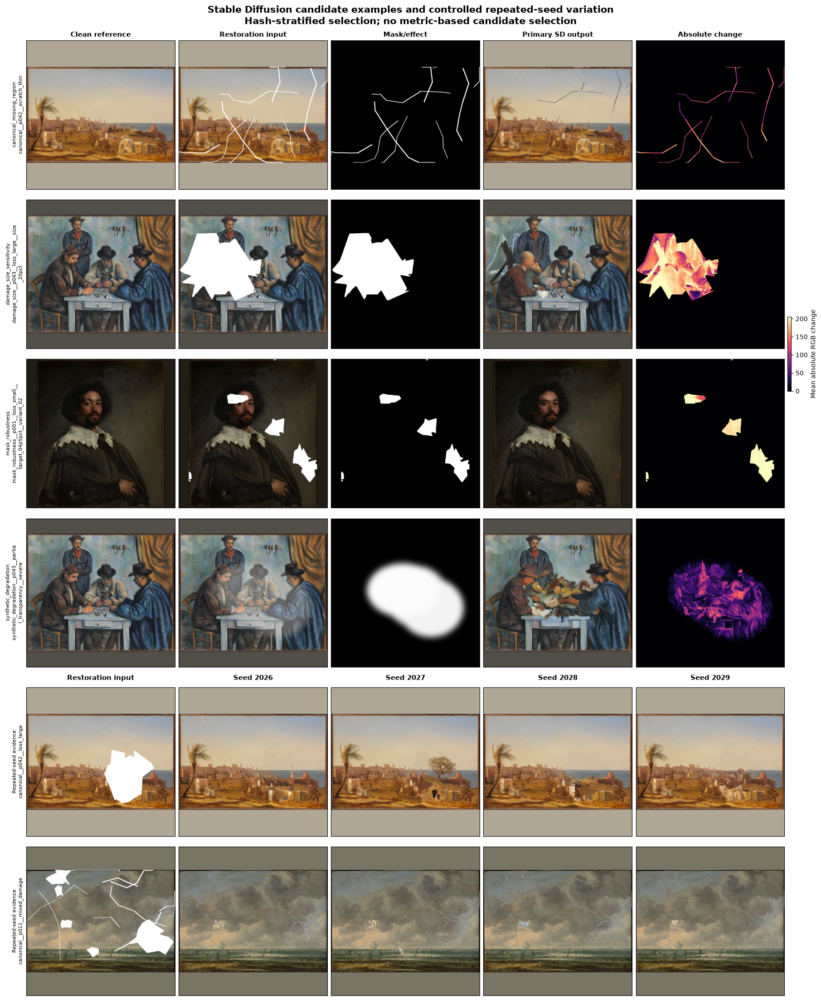

Candidate example figure persisted.
Path: outputs/11_stable_diffusion_restoration/figures/candidate_examples.png
Dimensions: (2717, 3307)
Format: PNG
Primary change-map maximum: 205.667


In [27]:
import os
import textwrap


# ---------------------------------------------------------------------------
# Shared normalization for primary absolute-change panels
# ---------------------------------------------------------------------------

primary_change_values = np.concatenate(
    [
        row["input_change"].reshape(-1)
        for row in primary_visual_rows
    ]
)

primary_change_vmax = max(
    float(
        np.percentile(
            primary_change_values,
            99.0,
        )
    ),
    1.0,
)


# ---------------------------------------------------------------------------
# Combined primary and uncertainty figure
# ---------------------------------------------------------------------------

primary_row_count = len(
    primary_visual_rows
)

uncertainty_row_count = len(
    seed_variation_visual_rows
)

total_candidate_figure_rows = (
    primary_row_count
    + uncertainty_row_count
)

figure, axes = plt.subplots(
    nrows=total_candidate_figure_rows,
    ncols=5,
    figsize=(18, 22),
    constrained_layout=True,
)

primary_column_titles = [
    "Clean reference",
    "Restoration input",
    "Mask/effect",
    "Primary SD output",
    "Absolute change",
]

for column_index, title in enumerate(
    primary_column_titles
):
    axes[
        0,
        column_index,
    ].set_title(
        title,
        fontsize=11,
        fontweight="bold",
    )

difference_artist = None

for row_index, visual_row in enumerate(
    primary_visual_rows
):
    axes[row_index, 0].imshow(
        visual_row["clean"]
    )

    axes[row_index, 1].imshow(
        visual_row["input"]
    )

    axes[row_index, 2].imshow(
        visual_row["mask_or_effect"],
        cmap="gray",
        vmin=0,
        vmax=255,
    )

    axes[row_index, 3].imshow(
        visual_row["restored"]
    )

    difference_artist = axes[
        row_index,
        4,
    ].imshow(
        visual_row["input_change"],
        cmap="magma",
        vmin=0,
        vmax=primary_change_vmax,
    )

    axes[row_index, 0].set_ylabel(
        (
            str(
                visual_row[
                    "experiment_id"
                ]
            )
            + "\n"
            + textwrap.fill(
                str(
                    visual_row[
                        "case_id"
                    ]
                ),
                width=35,
            )
        ),
        fontsize=8,
    )

    for axis in axes[row_index, :]:
        axis.set_xticks([])
        axis.set_yticks([])

if difference_artist is None:
    raise RuntimeError(
        "No primary difference artist was created."
    )

figure.colorbar(
    difference_artist,
    ax=axes[
        :primary_row_count,
        4,
    ],
    orientation="vertical",
    fraction=0.025,
    pad=0.02,
    label="Mean absolute RGB change",
)

seed_column_titles = [
    "Restoration input",
    *[
        f"Seed {seed}"
        for seed in configured_uncertainty_seeds
    ],
]

first_uncertainty_row = (
    primary_row_count
)

for column_index, title in enumerate(
    seed_column_titles
):
    axes[
        first_uncertainty_row,
        column_index,
    ].set_title(
        title,
        fontsize=11,
        fontweight="bold",
        pad=12,
    )

for offset, visual_row in enumerate(
    seed_variation_visual_rows
):
    row_index = (
        first_uncertainty_row
        + offset
    )

    axes[row_index, 0].imshow(
        visual_row["input"]
    )

    for seed_offset, seed in enumerate(
        configured_uncertainty_seeds,
        start=1,
    ):
        axes[
            row_index,
            seed_offset,
        ].imshow(
            visual_row[
                "seed_outputs"
            ][seed]
        )

    axes[row_index, 0].set_ylabel(
        (
            "Repeated-seed evidence\n"
            + textwrap.fill(
                str(
                    visual_row[
                        "case_id"
                    ]
                ),
                width=35,
            )
        ),
        fontsize=8,
    )

    for axis in axes[row_index, :]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    (
        "Stable Diffusion candidate examples and "
        "controlled repeated-seed variation\n"
        "Hash-stratified selection; no metric-based "
        "candidate selection"
    ),
    fontsize=15,
    fontweight="bold",
)

OUTPUTS["candidate_examples"].parent.mkdir(
    parents=True,
    exist_ok=True,
)

temporary_candidate_figure_path = (
    OUTPUTS["candidate_examples"]
    .with_suffix(".tmp.png")
)

try:
    figure.savefig(
        temporary_candidate_figure_path,
        format="png",
        dpi=150,
        facecolor="white",
        bbox_inches="tight",
    )

    os.replace(
        temporary_candidate_figure_path,
        OUTPUTS["candidate_examples"],
    )
finally:
    temporary_candidate_figure_path.unlink(
        missing_ok=True
    )

plt.show()
plt.close(figure)

with Image.open(
    OUTPUTS["candidate_examples"]
) as saved_figure:
    saved_figure.load()

    candidate_figure_width = (
        saved_figure.width
    )

    candidate_figure_height = (
        saved_figure.height
    )

    candidate_figure_mode = (
        saved_figure.mode
    )

    candidate_figure_format = (
        saved_figure.format
    )

print(
    "Candidate example figure persisted."
)
print(
    "Path:",
    to_repo_relative(
        OUTPUTS["candidate_examples"],
        PROJECT_ROOT,
    ),
)
print(
    "Dimensions:",
    (
        candidate_figure_width,
        candidate_figure_height,
    ),
)
print(
    "Format:",
    candidate_figure_format,
)
print(
    "Primary change-map maximum:",
    round(
        primary_change_vmax,
        3,
    ),
)

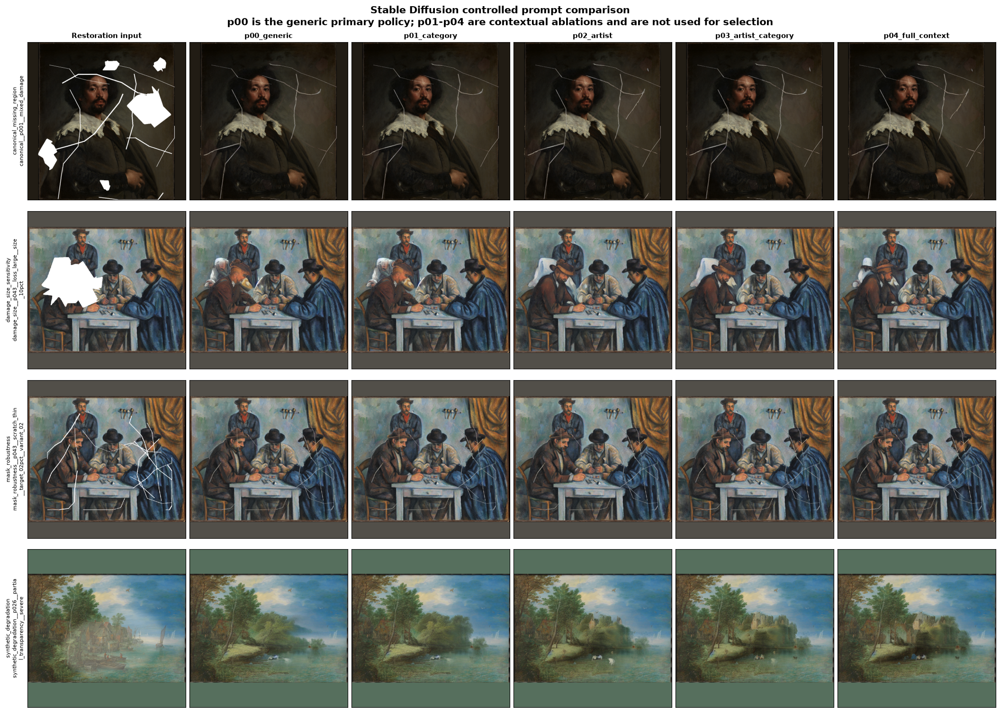

Prompt-comparison figure persisted.
Path: outputs/11_stable_diffusion_restoration/figures/prompt_comparison_examples.png
Dimensions: (3167, 2256)
Format: PNG
Prompt variants: ['p00_generic', 'p01_category', 'p02_artist', 'p03_artist_category', 'p04_full_context']


In [28]:
# ---------------------------------------------------------------------------
# Controlled generic/contextual prompt comparison
# ---------------------------------------------------------------------------

prompt_figure, prompt_axes = plt.subplots(
    nrows=len(
        prompt_comparison_visual_rows
    ),
    ncols=(
        1
        + len(
            ordered_prompt_variant_ids
        )
    ),
    figsize=(21, 15),
    constrained_layout=True,
)

prompt_column_titles = [
    "Restoration input",
    *ordered_prompt_variant_ids,
]

for column_index, title in enumerate(
    prompt_column_titles
):
    prompt_axes[
        0,
        column_index,
    ].set_title(
        title,
        fontsize=11,
        fontweight="bold",
    )

for row_index, visual_row in enumerate(
    prompt_comparison_visual_rows
):
    prompt_axes[
        row_index,
        0,
    ].imshow(
        visual_row["input"]
    )

    for variant_offset, variant_id in enumerate(
        ordered_prompt_variant_ids,
        start=1,
    ):
        prompt_axes[
            row_index,
            variant_offset,
        ].imshow(
            visual_row[
                "prompt_outputs"
            ][variant_id]
        )

    prompt_axes[
        row_index,
        0,
    ].set_ylabel(
        (
            str(
                visual_row[
                    "experiment_id"
                ]
            )
            + "\n"
            + textwrap.fill(
                str(
                    visual_row[
                        "case_id"
                    ]
                ),
                width=35,
            )
        ),
        fontsize=8,
    )

    for axis in prompt_axes[
        row_index,
        :
    ]:
        axis.set_xticks([])
        axis.set_yticks([])

prompt_figure.suptitle(
    (
        "Stable Diffusion controlled prompt comparison\n"
        "p00 is the generic primary policy; p01-p04 are "
        "contextual ablations and are not used for selection"
    ),
    fontsize=15,
    fontweight="bold",
)

OUTPUTS[
    "prompt_comparison_examples"
].parent.mkdir(
    parents=True,
    exist_ok=True,
)

temporary_prompt_figure_path = (
    OUTPUTS[
        "prompt_comparison_examples"
    ]
    .with_suffix(".tmp.png")
)

try:
    prompt_figure.savefig(
        temporary_prompt_figure_path,
        format="png",
        dpi=150,
        facecolor="white",
        bbox_inches="tight",
    )

    os.replace(
        temporary_prompt_figure_path,
        OUTPUTS[
            "prompt_comparison_examples"
        ],
    )
finally:
    temporary_prompt_figure_path.unlink(
        missing_ok=True
    )

plt.show()
plt.close(prompt_figure)

with Image.open(
    OUTPUTS[
        "prompt_comparison_examples"
    ]
) as saved_prompt_figure:
    saved_prompt_figure.load()

    prompt_figure_width = (
        saved_prompt_figure.width
    )

    prompt_figure_height = (
        saved_prompt_figure.height
    )

    prompt_figure_mode = (
        saved_prompt_figure.mode
    )

    prompt_figure_format = (
        saved_prompt_figure.format
    )

print(
    "Prompt-comparison figure persisted."
)
print(
    "Path:",
    to_repo_relative(
        OUTPUTS[
            "prompt_comparison_examples"
        ],
        PROJECT_ROOT,
    ),
)
print(
    "Dimensions:",
    (
        prompt_figure_width,
        prompt_figure_height,
    ),
)
print(
    "Format:",
    prompt_figure_format,
)
print(
    "Prompt variants:",
    ordered_prompt_variant_ids,
)

In [29]:
# ---------------------------------------------------------------------------
# Runtime and design contracts
# ---------------------------------------------------------------------------

runtime_scope_counts = (
    reloaded_runtime_summary_df[
        "summary_scope"
    ]
    .astype(str)
    .value_counts()
    .sort_index()
    .to_dict()
)

expected_runtime_scope_counts = {
    "overall": 1,
    "experiment": 4,
    "execution_role": 3,
    "prompt_variant": 5,
}

overall_runtime_df = (
    reloaded_runtime_summary_df.loc[
        reloaded_runtime_summary_df[
            "summary_scope"
        ].eq("overall")
    ]
)

runtime_numeric_columns = [
    "total_runtime_seconds",
    "mean_runtime_seconds",
    "median_runtime_seconds",
    "p95_runtime_seconds",
    "max_runtime_seconds",
    "throughput_cases_per_second",
]

runtime_numeric_values = (
    reloaded_runtime_summary_df[
        runtime_numeric_columns
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

runtime_values_valid = bool(
    np.isfinite(
        runtime_numeric_values.to_numpy(
            dtype=float
        )
    ).all()
    and runtime_numeric_values
    .ge(0)
    .all()
    .all()
)

overall_runtime_valid = bool(
    len(overall_runtime_df) == 1
    and int(
        overall_runtime_df.iloc[0][
            "case_count"
        ]
    )
    == EXPECTED_COUNTS[
        "candidate_count"
    ]
    and int(
        overall_runtime_df.iloc[0][
            "completed_count"
        ]
    )
    == EXPECTED_COUNTS[
        "candidate_count"
    ]
    and int(
        overall_runtime_df.iloc[0][
            "failed_count"
        ]
    )
    == 0
    and str(
        overall_runtime_df.iloc[0][
            "status"
        ]
    )
    == "completed"
)

prompt_design_component_counts = (
    reloaded_prompt_ablation_design_df
    .groupby(
        "design_component",
        sort=True,
    )
    .size()
    .to_dict()
)

expected_prompt_design_component_counts = {
    "prompt_ablation": EXPECTED_COUNTS[
        "prompt_ablation_case_count"
    ],
    "uncertainty": EXPECTED_COUNTS[
        "uncertainty_case_count"
    ],
}


# ---------------------------------------------------------------------------
# Selected-candidate validation
# ---------------------------------------------------------------------------

selected_visual_candidate_ids = (
    set(
        primary_representative_candidates_df[
            "candidate_id"
        ].astype(str)
    )
    | set(
        seed_variation_candidates_df[
            "candidate_id"
        ].astype(str)
    )
    | set(
        prompt_comparison_candidates_df[
            "candidate_id"
        ].astype(str)
    )
)

selected_visual_audit_df = (
    full_candidate_audit_df.loc[
        full_candidate_audit_df[
            "candidate_id"
        ]
        .astype(str)
        .isin(
            selected_visual_candidate_ids
        )
    ]
    .copy()
)

selected_visual_candidates_valid = bool(
    len(selected_visual_audit_df)
    == len(selected_visual_candidate_ids)
    and selected_visual_audit_df[
        "passed"
    ]
    .astype(bool)
    .all()
    and pd.to_numeric(
        selected_visual_audit_df[
            "outside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
)

primary_visual_experiments = sorted(
    primary_representative_candidates_df[
        "experiment_id"
    ]
    .astype(str)
    .tolist()
)

prompt_visual_experiments = sorted(
    prompt_visual_cases_df[
        "experiment_id"
    ]
    .astype(str)
    .tolist()
)

uncertainty_seed_sets = {
    str(case_id): sorted(
        group["seed"]
        .astype(int)
        .unique()
        .tolist()
    )
    for case_id, group in (
        seed_variation_candidates_df
        .groupby(
            "case_id",
            sort=True,
        )
    )
}

visual_selection_valid = bool(
    primary_visual_experiments
    == expected_visual_experiments
    and prompt_visual_experiments
    == expected_visual_experiments
    and len(
        uncertainty_visual_cases_df[
            "category"
        ].unique()
    )
    == 2
    and all(
        seed_set
        == configured_uncertainty_seeds
        for seed_set in (
            uncertainty_seed_sets.values()
        )
    )
    and not candidate_visual_selection_policy[
        "metric_columns_used"
    ]
)


# ---------------------------------------------------------------------------
# Figure and filesystem contracts
# ---------------------------------------------------------------------------

candidate_figure_valid = bool(
    OUTPUTS["candidate_examples"].is_file()
    and OUTPUTS[
        "candidate_examples"
    ].stat().st_size > 0
    and candidate_figure_format == "PNG"
    and candidate_figure_width >= 1000
    and candidate_figure_height >= 1000
)

prompt_figure_valid = bool(
    OUTPUTS[
        "prompt_comparison_examples"
    ].is_file()
    and OUTPUTS[
        "prompt_comparison_examples"
    ].stat().st_size > 0
    and prompt_figure_format == "PNG"
    and prompt_figure_width >= 1000
    and prompt_figure_height >= 1000
)

observed_metrics_files = {
    path.resolve()
    for path in OUTPUTS[
        "runtime_summary"
    ].parent.rglob("*")
    if path.is_file()
}

expected_metrics_files = {
    OUTPUTS[
        "runtime_summary"
    ].resolve(),
    OUTPUTS[
        "prompt_ablation_design"
    ].resolve(),
}

observed_figure_files = {
    path.resolve()
    for path in OUTPUTS[
        "candidate_examples"
    ].parent.rglob("*")
    if path.is_file()
}

expected_figure_files = {
    OUTPUTS[
        "candidate_examples"
    ].resolve(),
    OUTPUTS[
        "prompt_comparison_examples"
    ].resolve(),
}


# ---------------------------------------------------------------------------
# Register Batch 6 checks
# ---------------------------------------------------------------------------


def add_batch_6_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    VALIDATION.add(
        validation_stage=(
            "batch_6_analysis_visualization"
        ),
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_6_check(
    check_id="runtime_summary_schema",
    description=(
        "The persisted runtime summary satisfies "
        "its exact normalized schema."
    ),
    expected={
        "schema_valid": True,
        "row_count": 13,
    },
    observed={
        "schema_valid": (
            reloaded_runtime_schema_exact
        ),
        "row_count": len(
            reloaded_runtime_summary_df
        ),
    },
    passed=(
        reloaded_runtime_schema_exact
        and len(
            reloaded_runtime_summary_df
        )
        == 13
    ),
)

add_batch_6_check(
    check_id="runtime_summary_scopes",
    description=(
        "Runtime evidence covers overall, experiment, "
        "execution-role, and prompt-variant scopes."
    ),
    expected=expected_runtime_scope_counts,
    observed=runtime_scope_counts,
    passed=(
        runtime_scope_counts
        == expected_runtime_scope_counts
    ),
)

add_batch_6_check(
    check_id="runtime_completion_evidence",
    description=(
        "Runtime evidence records every candidate as "
        "completed with finite non-negative values."
    ),
    expected={
        "candidate_count": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "failed_count": 0,
        "runtime_values_valid": True,
    },
    observed={
        "overall_runtime_valid": (
            overall_runtime_valid
        ),
        "runtime_values_valid": (
            runtime_values_valid
        ),
    },
    passed=(
        overall_runtime_valid
        and runtime_values_valid
    ),
)

add_batch_6_check(
    check_id="prompt_ablation_design",
    description=(
        "The persisted design records every approved "
        "prompt-ablation and uncertainty case."
    ),
    expected={
        "schema_valid": True,
        "row_count": EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ],
        "component_counts": (
            expected_prompt_design_component_counts
        ),
    },
    observed={
        "schema_valid": (
            reloaded_prompt_design_schema_exact
        ),
        "row_count": len(
            reloaded_prompt_ablation_design_df
        ),
        "component_counts": (
            prompt_design_component_counts
        ),
    },
    passed=(
        reloaded_prompt_design_schema_exact
        and len(
            reloaded_prompt_ablation_design_df
        )
        == EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ]
        and prompt_design_component_counts
        == expected_prompt_design_component_counts
    ),
)

add_batch_6_check(
    check_id="metric_independent_visual_selection",
    description=(
        "Visual cases follow fixed hash-stratified rules "
        "without metric-based candidate selection."
    ),
    expected={
        "primary_experiments": (
            expected_visual_experiments
        ),
        "prompt_experiments": (
            expected_visual_experiments
        ),
        "uncertainty_cases": 2,
        "uncertainty_seeds": (
            configured_uncertainty_seeds
        ),
        "metric_columns_used": [],
    },
    observed={
        "primary_experiments": (
            primary_visual_experiments
        ),
        "prompt_experiments": (
            prompt_visual_experiments
        ),
        "uncertainty_cases": len(
            uncertainty_visual_cases_df
        ),
        "uncertainty_seed_sets": (
            uncertainty_seed_sets
        ),
        "metric_columns_used": (
            candidate_visual_selection_policy[
                "metric_columns_used"
            ]
        ),
    },
    passed=visual_selection_valid,
)

add_batch_6_check(
    check_id="selected_candidate_validation",
    description=(
        "Every candidate rendered in the figures passed "
        "scientific validation and outside-mask invariance."
    ),
    expected={
        "selected_candidates": len(
            selected_visual_candidate_ids
        ),
        "failed_candidates": 0,
        "changed_outside_pixels": 0,
    },
    observed={
        "selected_candidates": len(
            selected_visual_audit_df
        ),
        "failed_candidates": int(
            (
                ~selected_visual_audit_df[
                    "passed"
                ].astype(bool)
            ).sum()
        ),
        "changed_outside_pixels": int(
            pd.to_numeric(
                selected_visual_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
    },
    passed=selected_visual_candidates_valid,
)

add_batch_6_check(
    check_id="candidate_figure_contract",
    description=(
        "The candidate and repeated-seed figure is "
        "a readable, non-empty, detailed PNG."
    ),
    expected={
        "file_exists": True,
        "format": "PNG",
        "minimum_width": 1000,
        "minimum_height": 1000,
    },
    observed={
        "file_exists": OUTPUTS[
            "candidate_examples"
        ].is_file(),
        "file_size_bytes": (
            OUTPUTS[
                "candidate_examples"
            ].stat().st_size
            if OUTPUTS[
                "candidate_examples"
            ].is_file()
            else 0
        ),
        "format": candidate_figure_format,
        "width": candidate_figure_width,
        "height": candidate_figure_height,
        "mode": candidate_figure_mode,
    },
    passed=candidate_figure_valid,
)

add_batch_6_check(
    check_id="prompt_comparison_figure_contract",
    description=(
        "The controlled prompt-comparison figure is "
        "a readable, non-empty, detailed PNG."
    ),
    expected={
        "file_exists": True,
        "format": "PNG",
        "minimum_width": 1000,
        "minimum_height": 1000,
    },
    observed={
        "file_exists": OUTPUTS[
            "prompt_comparison_examples"
        ].is_file(),
        "file_size_bytes": (
            OUTPUTS[
                "prompt_comparison_examples"
            ].stat().st_size
            if OUTPUTS[
                "prompt_comparison_examples"
            ].is_file()
            else 0
        ),
        "format": prompt_figure_format,
        "width": prompt_figure_width,
        "height": prompt_figure_height,
        "mode": prompt_figure_mode,
    },
    passed=prompt_figure_valid,
)

add_batch_6_check(
    check_id="analysis_output_filesystem_scope",
    description=(
        "Metrics and figures directories contain "
        "exactly the approved analysis outputs."
    ),
    expected={
        "metrics_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in expected_metrics_files
        ),
        "figure_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in expected_figure_files
        ),
    },
    observed={
        "metrics_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in observed_metrics_files
        ),
        "figure_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in observed_figure_files
        ),
    },
    passed=(
        observed_metrics_files
        == expected_metrics_files
        and observed_figure_files
        == expected_figure_files
    ),
)

all_validation_checks_df = (
    VALIDATION.to_dataframe()
)

batch_6_checks_df = (
    all_validation_checks_df.loc[
        all_validation_checks_df[
            "validation_stage"
        ].eq(
            "batch_6_analysis_visualization"
        )
    ]
    .drop_duplicates(
        subset=["check_id"],
        keep="last",
    )
    .reset_index(drop=True)
)

VALIDATION.raise_for_blocking()

print(
    "Batch 6 validation checks:"
)

display(
    batch_6_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "\nVisual selection policy:"
)
print(
    json.dumps(
        candidate_visual_selection_policy,
        indent=2,
    )
)

print(
    "\nBatch 6 completed successfully."
)
print(
    "Checks:",
    len(batch_6_checks_df),
)
print(
    "Passed:",
    int(
        batch_6_checks_df[
            "passed"
        ]
        .astype(bool)
        .sum()
    ),
)
print(
    "Runtime-summary rows:",
    len(reloaded_runtime_summary_df),
)
print(
    "Prompt-design rows:",
    len(
        reloaded_prompt_ablation_design_df
    ),
)
print(
    "Selected visual candidates:",
    len(selected_visual_candidate_ids),
)
print(
    "Next approved stage: Batch 7 - canonical "
    "candidate/prompt persistence, prompt-policy report, "
    "manifests, and validation handoff."
)

Batch 6 validation checks:


,check_id,expected,observed,passed
0,runtime_summary_schema,"{""row_count"": 13, ""schema_valid"": true}","{""row_count"": 13, ""schema_valid"": true}",True
1,runtime_summary_scopes,"{""execution_role"": 3, ""experiment"": 4, ""overal...","{""execution_role"": 3, ""experiment"": 4, ""overal...",True
2,runtime_completion_evidence,"{""candidate_count"": 1010, ""failed_count"": 0, ""...","{""overall_runtime_valid"": true, ""runtime_value...",True
3,prompt_ablation_design,"{""component_counts"": {""prompt_ablation"": 120, ...","{""component_counts"": {""prompt_ablation"": 120, ...",True
4,metric_independent_visual_selection,"{""metric_columns_used"": [], ""primary_experimen...","{""metric_columns_used"": [], ""primary_experimen...",True
5,selected_candidate_validation,"{""changed_outside_pixels"": 0, ""failed_candidat...","{""changed_outside_pixels"": 0, ""failed_candidat...",True
6,candidate_figure_contract,"{""file_exists"": true, ""format"": ""PNG"", ""minimu...","{""file_exists"": true, ""file_size_bytes"": 68969...",True
7,prompt_comparison_figure_contract,"{""file_exists"": true, ""format"": ""PNG"", ""minimu...","{""file_exists"": true, ""file_size_bytes"": 84520...",True
8,analysis_output_filesystem_scope,"{""figure_files"": [""outputs/11_stable_diffusion...","{""figure_files"": [""outputs/11_stable_diffusion...",True



Visual selection policy:
{
  "policy_id": "sd15_visual_selection_hash_stratified.v1",
  "primary_rule": "one non-zero primary candidate per experiment, minimum SHA-256 rank",
  "uncertainty_rule": "two distinct-category uncertainty cases, minimum SHA-256 rank",
  "prompt_rule": "one prompt-ablation case per experiment, minimum SHA-256 rank",
  "metric_columns_used": []
}

Batch 6 completed successfully.
Checks: 9
Passed: 9
Runtime-summary rows: 13
Prompt-design rows: 160
Selected visual candidates: 32
Next approved stage: Batch 7 - canonical candidate/prompt persistence, prompt-policy report, manifests, and validation handoff.


## Batch 7 - Canonical Persistence and Provisional Handoff

This batch persists and validates the complete downstream-facing Notebook 11 handoff:

- `data/candidates.csv`;
- `data/prompt_policy.csv`;
- `images/restored/<experiment_id>/<case_id>/<candidate_id>.png`;
- `metrics/runtime_summary.csv`;
- `metrics/prompt_ablation_design.csv`;
- `figures/candidate_examples.png`;
- `figures/prompt_comparison_examples.png`;
- `reports/prompt_policy.md`;
- `validation/checks.csv`;
- `manifests/artifacts.csv`;
- `manifests/run_manifest.json`.

The artifact manifest contains nine records. The run manifest remains provisionally `running` until Batch 8 completes the roadmap audit, final completion gate, project-path registry update, and work-directory cleanup.

The checkpoint and smoke-test files remain isolated under `work/` and are not canonical outputs.

In [31]:
from restoration_eval.manifests import (
    RUN_MANIFEST_SCHEMA_VERSION,
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    configuration_checksums,
    sha256_path,
    write_artifact_manifest,
    write_run_manifest,
)

from restoration_eval.schemas import (
    RUN_MANIFEST_REQUIRED_KEYS,
)


# ---------------------------------------------------------------------------
# Approved validation and output cardinalities
# ---------------------------------------------------------------------------

EXPECTED_VALIDATION_STAGE_COUNTS = {
    "batch_1_preflight": 59,
    "batch_2_input_design": 26,
    "batch_3_smoke_inference": 15,
    "batch_4_full_execution": 9,
    "batch_5_scientific_validation": 10,
    "batch_6_analysis_visualization": 9,
}

EXPECTED_CONSOLIDATED_VALIDATION_ROWS = sum(
    EXPECTED_VALIDATION_STAGE_COUNTS.values()
)

EXPECTED_ARTIFACT_RECORD_COUNT = int(
    EXPECTED_COUNTS[
        "artifact_record_count"
    ]
)

EXPECTED_CANONICAL_OUTPUT_FILE_COUNT = int(
    EXPECTED_COUNTS[
        "total_output_file_count_without_failure_logs"
    ]
)

EXPECTED_WORK_FILE_COUNT = 7
EXPECTED_SMOKE_WORK_FILE_COUNT = 6


# ---------------------------------------------------------------------------
# Consolidate Batch 1-6 validation evidence
# ---------------------------------------------------------------------------

if not VALIDATION.overall_passed:
    raise RuntimeError(
        "The cumulative Notebook 11 blocking "
        "validation gate has not passed."
    )

validation_checks_df = (
    VALIDATION.to_dataframe()
    .drop_duplicates(
        subset=[
            "validation_stage",
            "check_id",
        ],
        keep="last",
    )
    .reset_index(drop=True)
)

observed_validation_stage_counts = {
    str(validation_stage): int(count)
    for validation_stage, count in (
        validation_checks_df[
            "validation_stage"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

if (
    observed_validation_stage_counts
    != EXPECTED_VALIDATION_STAGE_COUNTS
):
    raise RuntimeError(
        "Consolidated validation-stage counts "
        "do not match the approved Batch 1-6 contract. "
        f"Observed: {observed_validation_stage_counts}"
    )

validation_schema_result = validate_dataframe(
    validation_checks_df,
    VALIDATION_CHECKS_SCHEMA,
    allow_extra_columns=False,
)

validation_schema_exact = bool(
    validation_schema_result.passed
    and not validation_schema_result.unexpected_columns
)

if not validation_schema_exact:
    raise RuntimeError(
        "Consolidated validation evidence does "
        "not match validation_checks.v1."
    )

if (
    len(validation_checks_df)
    != EXPECTED_CONSOLIDATED_VALIDATION_ROWS
):
    raise RuntimeError(
        "Unexpected consolidated validation count: "
        f"{len(validation_checks_df)}."
    )

blocking_failure_mask = (
    validation_checks_df[
        "severity"
    ]
    .astype(str)
    .eq("blocking")
    & ~validation_checks_df[
        "passed"
    ].astype(bool)
)

warning_mask = (
    validation_checks_df[
        "severity"
    ]
    .astype(str)
    .eq("warning")
)

warning_failure_mask = (
    warning_mask
    & ~validation_checks_df[
        "passed"
    ].astype(bool)
)

blocking_validation_passed = bool(
    not blocking_failure_mask.any()
)

warning_check_count = int(
    warning_mask.sum()
)

warning_failure_count = int(
    warning_failure_mask.sum()
)


# ---------------------------------------------------------------------------
# Validate ownership of every declared path
# ---------------------------------------------------------------------------

output_ownership_failures = []

for output_key, output_path in OUTPUTS.items():
    try:
        validated_path = require_notebook_output_path(
            output_path,
            NOTEBOOK_STEM,
            PROJECT_ROOT,
        )

        if validated_path != output_path.resolve():
            output_ownership_failures.append(
                {
                    "output_key": output_key,
                    "path": str(output_path),
                    "issue": (
                        "resolved_path_mismatch"
                    ),
                }
            )

    except Exception as exc:
        output_ownership_failures.append(
            {
                "output_key": output_key,
                "path": str(output_path),
                "issue": (
                    f"{type(exc).__name__}: {exc}"
                ),
            }
        )

if output_ownership_failures:
    raise RuntimeError(
        "One or more Notebook 11 paths violate "
        f"output ownership: {output_ownership_failures}"
    )


# ---------------------------------------------------------------------------
# Canonical candidate and prompt-policy tables
# ---------------------------------------------------------------------------

canonical_candidates_df = (
    validation_candidates_df
    .copy()
    .reset_index(drop=True)
)

canonical_prompt_policy_df = (
    prompt_policy_df
    .copy()
    .reset_index(drop=True)
)

canonical_candidate_schema_result = validate_dataframe(
    canonical_candidates_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    allow_extra_columns=False,
)

canonical_prompt_schema_result = validate_dataframe(
    canonical_prompt_policy_df,
    PROMPT_POLICY_SCHEMA,
    allow_extra_columns=False,
)

if not (
    canonical_candidate_schema_result.passed
    and not canonical_candidate_schema_result.unexpected_columns
):
    raise RuntimeError(
        "Canonical candidates violate their exact schema."
    )

if not (
    canonical_prompt_schema_result.passed
    and not canonical_prompt_schema_result.unexpected_columns
):
    raise RuntimeError(
        "Canonical prompt policy violates its exact schema."
    )


# ---------------------------------------------------------------------------
# Build the documented prompt-policy report
# ---------------------------------------------------------------------------

prompt_report_lines = [
    "# Stable Diffusion Prompt Policy",
    "",
    "## Scope",
    "",
    (
        "This report documents the fixed Stable Diffusion prompt policy, "
        "controlled contextual ablation, repeated-seed design, and known "
        "methodological limitations used by Notebook 11."
    ),
    "",
    f"- Configuration: `{sd_config['config_schema_version']}` / "
    f"`{sd_config['config_version']}`",
    f"- Model: `{configured_model['hf_model_id']}`",
    f"- Pinned revision: `{configured_model['model_revision']}`",
    f"- Configuration ID: `{configured_model['configuration_id']}`",
    f"- Prompt policy ID: `{sd_config['prompt_policy']['policy_id']}`",
    f"- Scheduler: `{configured_model['scheduler']}`",
    f"- Inference steps: `{configured_model['num_inference_steps']}`",
    f"- Guidance scale: `{configured_model['guidance_scale']}`",
    f"- Strength: `{configured_model['strength']}`",
    f"- Precision/device: `{configured_model['precision']}` / "
    f"`{EFFECTIVE_DEVICE}`",
    f"- Primary seed: `{configured_design['primary_seed']}`",
    (
        "- Uncertainty seeds: `"
        + ", ".join(
            str(seed)
            for seed in configured_design[
                "uncertainty_seeds"
            ]
        )
        + "`"
    ),
    "",
    "## Primary Prompt",
    "",
    sd_config[
        "prompt_policy"
    ][
        "generic_prompt"
    ],
    "",
    "## Negative Prompt",
    "",
    sd_config[
        "prompt_policy"
    ][
        "negative_prompt"
    ],
    "",
    "## Controlled Prompt Variants",
    "",
    (
        "| Variant | Family | Primary | Requires metadata | "
        "Metadata fields | Template |"
    ),
    "|---|---|---:|---:|---|---|",
]

for prompt_row in (
    canonical_prompt_policy_df
    .sort_values(
        "variant_order",
        kind="stable",
    )
    .to_dict(orient="records")
):
    prompt_report_lines.append(
        "| "
        + str(
            prompt_row[
                "prompt_variant_id"
            ]
        ).replace("|", "\\|")
        + " | "
        + str(
            prompt_row[
                "variant_family"
            ]
        ).replace("|", "\\|")
        + " | "
        + str(
            prompt_row[
                "is_primary"
            ]
        )
        + " | "
        + str(
            prompt_row[
                "requires_metadata"
            ]
        )
        + " | "
        + str(
            prompt_row[
                "metadata_fields"
            ]
        ).replace("|", "\\|")
        + " | "
        + str(
            prompt_row[
                "prompt_template"
            ]
        ).replace("|", "\\|")
        + " |"
    )

prompt_report_lines.extend(
    [
        "",
        "## Candidate Design",
        "",
        f"- Eligible primary cases: "
        f"`{EXPECTED_COUNTS['primary_candidate_count']}`",
        f"- Contextual prompt candidates: "
        f"`{EXPECTED_COUNTS['prompt_context_candidate_count']}`",
        f"- Repeated-seed extensions: "
        f"`{EXPECTED_COUNTS['uncertainty_extension_candidate_count']}`",
        f"- Total candidates: "
        f"`{EXPECTED_COUNTS['candidate_count']}`",
        (
            "- Candidate-selection policy: `"
            + str(
                configured_design[
                    "selection_policy"
                ]
            )
            + "`"
        ),
        (
            "- Visual-selection policy: `"
            + str(
                candidate_visual_selection_policy[
                    "policy_id"
                ]
            )
            + "`"
        ),
        "- Metric columns used for selection: none.",
        (
            "- Contextual prompts are controlled ablations and are not "
            "used to replace or select the generic primary candidate."
        ),
        (
            "- Repeated seeds characterize stochastic sensitivity and "
            "are not ranked or selected using restoration metrics."
        ),
        "",
        "## Execution and Compositing",
        "",
        f"- Compositing policy: "
        f"`{configured_model['compositing_policy']}`",
        f"- Zero-control policy: "
        f"`{configured_model['zero_control_policy']}`",
        f"- Safety-checker policy: "
        f"`{configured_model['safety_checker_policy']}`",
        f"- Retry policy: at most "
        f"`{configured_model['maximum_retries']}` retry with the exact seed.",
        "",
        "## Known Limitations",
        "",
    ]
)

for limitation in sd_config[
    "known_limitations"
]:
    prompt_report_lines.append(
        "- " + str(limitation)
    )

prompt_report_lines.extend(
    [
        "",
        "## Interpretation",
        "",
        (
            "Stable Diffusion candidates are plausible, prompt-conditioned "
            "inpaintings. They are not historically verified reconstructions "
            "and must not be treated as autonomous conservation decisions."
        ),
        "",
    ]
)

prompt_policy_report_text = (
    "\n".join(prompt_report_lines)
)

temporary_report_path = (
    OUTPUTS["prompt_policy_report"]
    .with_suffix(".md.tmp")
)

try:
    temporary_report_path.write_text(
        prompt_policy_report_text,
        encoding="utf-8",
        newline="\n",
    )

    os.replace(
        temporary_report_path,
        OUTPUTS["prompt_policy_report"],
    )
finally:
    temporary_report_path.unlink(
        missing_ok=True
    )


# ---------------------------------------------------------------------------
# Atomically persist canonical tables
# ---------------------------------------------------------------------------

canonical_table_specs = [
    (
        canonical_candidates_df,
        OUTPUTS["candidates"],
    ),
    (
        canonical_prompt_policy_df,
        OUTPUTS["prompt_policy"],
    ),
    (
        validation_checks_df,
        OUTPUTS["validation_checks"],
    ),
]

for dataframe, output_path in canonical_table_specs:
    temporary_path = output_path.with_suffix(
        output_path.suffix + ".tmp"
    )

    try:
        dataframe.to_csv(
            temporary_path,
            index=False,
            lineterminator="\n",
        )

        os.replace(
            temporary_path,
            output_path,
        )
    finally:
        temporary_path.unlink(
            missing_ok=True
        )

print(
    "Canonical tables and prompt-policy report persisted."
)
print(
    "Candidate rows:",
    len(canonical_candidates_df),
)
print(
    "Prompt-policy rows:",
    len(canonical_prompt_policy_df),
)
print(
    "Consolidated validation rows:",
    len(validation_checks_df),
)
print(
    "Blocking failures:",
    int(blocking_failure_mask.sum()),
)
print(
    "Warning checks:",
    warning_check_count,
)
print(
    "Warning failures:",
    warning_failure_count,
)
print(
    "Validation-stage counts:",
    observed_validation_stage_counts,
)
print(
    "Prompt-policy report bytes:",
    OUTPUTS[
        "prompt_policy_report"
    ].stat().st_size,
)

Canonical tables and prompt-policy report persisted.
Candidate rows: 1010
Prompt-policy rows: 5
Consolidated validation rows: 128
Blocking failures: 0
Warning checks: 0
Warning failures: 0
Validation-stage counts: {'batch_1_preflight': 59, 'batch_2_input_design': 26, 'batch_3_smoke_inference': 15, 'batch_4_full_execution': 9, 'batch_5_scientific_validation': 10, 'batch_6_analysis_visualization': 9}
Prompt-policy report bytes: 4407


In [32]:
# ---------------------------------------------------------------------------
# Independently reload every canonical table
# ---------------------------------------------------------------------------

candidates_reloaded_df = pd.read_csv(
    OUTPUTS["candidates"],
    keep_default_na=False,
    low_memory=False,
)

prompt_policy_reloaded_df = pd.read_csv(
    OUTPUTS["prompt_policy"],
    keep_default_na=False,
)

runtime_summary_reloaded_df = pd.read_csv(
    OUTPUTS["runtime_summary"],
    keep_default_na=False,
)

prompt_design_reloaded_df = pd.read_csv(
    OUTPUTS["prompt_ablation_design"],
    keep_default_na=False,
)

validation_checks_reloaded_df = pd.read_csv(
    OUTPUTS["validation_checks"],
    keep_default_na=False,
)

candidate_reload_result = validate_dataframe(
    candidates_reloaded_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    allow_extra_columns=False,
)

prompt_policy_reload_result = validate_dataframe(
    prompt_policy_reloaded_df,
    PROMPT_POLICY_SCHEMA,
    allow_extra_columns=False,
)

runtime_summary_reload_result = validate_dataframe(
    runtime_summary_reloaded_df,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    allow_extra_columns=False,
)

prompt_design_reload_result = validate_dataframe(
    prompt_design_reloaded_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    allow_extra_columns=False,
)

validation_checks_reload_result = validate_dataframe(
    validation_checks_reloaded_df,
    VALIDATION_CHECKS_SCHEMA,
    allow_extra_columns=False,
)


# ---------------------------------------------------------------------------
# Stable identity and reload signatures
# ---------------------------------------------------------------------------

expected_candidate_signatures = {
    str(row["candidate_id"]): (
        str(row["restored_path"]),
        str(row["restored_sha256"]),
        str(row["status"]),
        str(row["configuration_fingerprint"]),
    )
    for _, row in (
        canonical_candidates_df.iterrows()
    )
}

reloaded_candidate_signatures = {
    str(row["candidate_id"]): (
        str(row["restored_path"]),
        str(row["restored_sha256"]),
        str(row["status"]),
        str(row["configuration_fingerprint"]),
    )
    for _, row in (
        candidates_reloaded_df.iterrows()
    )
}

expected_prompt_signatures = {
    (
        str(row["prompt_policy_id"]),
        str(row["prompt_variant_id"]),
    ): (
        str(row["prompt_template"]),
        str(row["negative_prompt"]),
        str(row["status"]),
    )
    for _, row in (
        canonical_prompt_policy_df.iterrows()
    )
}

reloaded_prompt_signatures = {
    (
        str(row["prompt_policy_id"]),
        str(row["prompt_variant_id"]),
    ): (
        str(row["prompt_template"]),
        str(row["negative_prompt"]),
        str(row["status"]),
    )
    for _, row in (
        prompt_policy_reloaded_df.iterrows()
    )
}

expected_validation_keys = {
    (
        str(row["validation_stage"]),
        str(row["check_id"]),
    )
    for _, row in (
        validation_checks_df.iterrows()
    )
}

reloaded_validation_keys = {
    (
        str(row["validation_stage"]),
        str(row["check_id"]),
    )
    for _, row in (
        validation_checks_reloaded_df.iterrows()
    )
}

reloaded_blocking_failure_mask = (
    validation_checks_reloaded_df[
        "severity"
    ]
    .astype(str)
    .eq("blocking")
    & ~validation_checks_reloaded_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

reloaded_blocking_checks_passed = bool(
    not reloaded_blocking_failure_mask.any()
)


# ---------------------------------------------------------------------------
# Restored-image, report, figure, and work evidence
# ---------------------------------------------------------------------------

persisted_restored_files = {
    path.resolve()
    for path in OUTPUTS[
        "restored_images"
    ].rglob("*")
    if path.is_file()
}

expected_persisted_restored_files = {
    (
        OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in (
        candidates_reloaded_df[
            "restored_path"
        ].astype(str)
    )
}

persisted_figure_evidence = {}

for figure_key in (
    "candidate_examples",
    "prompt_comparison_examples",
):
    figure_path = OUTPUTS[figure_key]

    with Image.open(
        figure_path
    ) as persisted_figure:
        persisted_figure.load()

        persisted_figure_evidence[
            figure_key
        ] = {
            "format": str(
                persisted_figure.format
            ),
            "mode": str(
                persisted_figure.mode
            ),
            "width": int(
                persisted_figure.width
            ),
            "height": int(
                persisted_figure.height
            ),
            "size_bytes": int(
                figure_path.stat().st_size
            ),
            "sha256": sha256_file(
                figure_path
            ),
        }

persisted_prompt_report_text = (
    OUTPUTS["prompt_policy_report"]
    .read_text(
        encoding="utf-8",
    )
)

WORK_ROOT = (
    OUTPUT_ROOT
    / "work"
).resolve()

observed_work_files = {
    path.resolve()
    for path in WORK_ROOT.rglob("*")
    if path.is_file()
}

observed_smoke_work_files = {
    path.resolve()
    for path in OUTPUTS[
        "smoke_directory"
    ].rglob("*")
    if path.is_file()
}

required_work_control_files = {
    OUTPUTS["checkpoint"].resolve(),
}

temporary_work_files = {
    path
    for path in observed_work_files
    if (
        ".tmp" in path.name.lower()
        or ".staging" in path.name.lower()
        or path.suffix.lower()
        in {
            ".temp",
            ".part",
        }
    )
}

print(
    "Canonical outputs reloaded."
)
print(
    "Candidate rows:",
    len(candidates_reloaded_df),
)
print(
    "Prompt-policy rows:",
    len(prompt_policy_reloaded_df),
)
print(
    "Runtime-summary rows:",
    len(runtime_summary_reloaded_df),
)
print(
    "Prompt-design rows:",
    len(prompt_design_reloaded_df),
)
print(
    "Validation rows:",
    len(validation_checks_reloaded_df),
)
print(
    "Restored files:",
    len(persisted_restored_files),
)
print(
    "Work files:",
    len(observed_work_files),
)
print(
    "Figure evidence:",
    persisted_figure_evidence,
)

Canonical outputs reloaded.
Candidate rows: 1010
Prompt-policy rows: 5
Runtime-summary rows: 13
Prompt-design rows: 160
Validation rows: 128
Restored files: 1010
Work files: 7
Figure evidence: {'candidate_examples': {'format': 'PNG', 'mode': 'RGBA', 'width': 2717, 'height': 3307, 'size_bytes': 6896932, 'sha256': '9dff32e58c093e3d58c4650350a59eaca0842ae2891df7631bffa8bcd6f3cc2f'}, 'prompt_comparison_examples': {'format': 'PNG', 'mode': 'RGBA', 'width': 3167, 'height': 2256, 'size_bytes': 8452080, 'sha256': '65890c73a3913f5e210c7a7ca80e8a132ca3fda3e28ae89333675ab17e445fc6'}}


In [33]:
# ---------------------------------------------------------------------------
# Precompute persistence conditions
# ---------------------------------------------------------------------------

candidate_reload_valid = bool(
    candidate_reload_result.passed
    and not candidate_reload_result.unexpected_columns
    and len(candidates_reloaded_df)
    == EXPECTED_COUNTS[
        "candidate_count"
    ]
    and candidates_reloaded_df[
        "candidate_id"
    ].is_unique
    and reloaded_candidate_signatures
    == expected_candidate_signatures
    and candidates_reloaded_df[
        "status"
    ]
    .astype(str)
    .eq("completed")
    .all()
)

prompt_policy_reload_valid = bool(
    prompt_policy_reload_result.passed
    and not prompt_policy_reload_result.unexpected_columns
    and len(prompt_policy_reloaded_df)
    == EXPECTED_COUNTS[
        "prompt_policy_row_count"
    ]
    and reloaded_prompt_signatures
    == expected_prompt_signatures
)

analysis_tables_reload_valid = bool(
    runtime_summary_reload_result.passed
    and not runtime_summary_reload_result.unexpected_columns
    and prompt_design_reload_result.passed
    and not prompt_design_reload_result.unexpected_columns
    and len(runtime_summary_reloaded_df) == 13
    and len(prompt_design_reloaded_df)
    == EXPECTED_COUNTS[
        "prompt_ablation_design_row_count"
    ]
)

validation_reload_valid = bool(
    validation_checks_reload_result.passed
    and not validation_checks_reload_result.unexpected_columns
    and len(validation_checks_reloaded_df)
    == EXPECTED_CONSOLIDATED_VALIDATION_ROWS
    and reloaded_validation_keys
    == expected_validation_keys
    and reloaded_blocking_checks_passed
)

restored_directory_valid = bool(
    len(persisted_restored_files)
    == EXPECTED_COUNTS[
        "restored_file_count"
    ]
    and persisted_restored_files
    == expected_persisted_restored_files
)

figures_reload_valid = bool(
    len(persisted_figure_evidence) == 2
    and all(
        evidence["format"] == "PNG"
        and evidence["width"] >= 1000
        and evidence["height"] >= 1000
        and evidence["size_bytes"] > 0
        for evidence in (
            persisted_figure_evidence.values()
        )
    )
)

prompt_report_valid = bool(
    OUTPUTS[
        "prompt_policy_report"
    ].is_file()
    and OUTPUTS[
        "prompt_policy_report"
    ].stat().st_size > 0
    and "# Stable Diffusion Prompt Policy"
    in persisted_prompt_report_text
    and sd_config[
        "prompt_policy"
    ][
        "policy_id"
    ]
    in persisted_prompt_report_text
    and configured_model[
        "model_revision"
    ]
    in persisted_prompt_report_text
    and "Metric columns used for selection: none."
    in persisted_prompt_report_text
)

work_isolation_valid = bool(
    len(observed_work_files)
    == EXPECTED_WORK_FILE_COUNT
    and len(observed_smoke_work_files)
    == EXPECTED_SMOKE_WORK_FILE_COUNT
    and required_work_control_files.issubset(
        observed_work_files
    )
    and observed_work_files
    == (
        observed_smoke_work_files
        | required_work_control_files
    )
    and not temporary_work_files
)


# ---------------------------------------------------------------------------
# Separate persistence validation layer
# ---------------------------------------------------------------------------

PERSISTENCE_VALIDATION = ValidationCollector()


def add_persistence_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    PERSISTENCE_VALIDATION.add(
        validation_stage=(
            "canonical_persistence"
        ),
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_persistence_check(
    check_id="output_path_ownership",
    description=(
        "Every declared Notebook 11 path resolves "
        "inside its owned output root."
    ),
    expected={
        "ownership_failures": 0,
    },
    observed={
        "ownership_failures": len(
            output_ownership_failures
        ),
    },
    passed=(
        not output_ownership_failures
    ),
    details=output_ownership_failures,
)

add_persistence_check(
    check_id="candidates_csv_reload",
    description=(
        "candidates.csv reloads with all 1,010 "
        "normalized completed candidates."
    ),
    expected={
        "rows": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "unique_candidate_ids": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "signatures_match": True,
    },
    observed={
        "rows": len(
            candidates_reloaded_df
        ),
        "unique_candidate_ids": int(
            candidates_reloaded_df[
                "candidate_id"
            ].nunique()
        ),
        "signatures_match": (
            reloaded_candidate_signatures
            == expected_candidate_signatures
        ),
    },
    passed=candidate_reload_valid,
)

add_persistence_check(
    check_id="prompt_policy_csv_reload",
    description=(
        "prompt_policy.csv reloads with all five "
        "approved prompt variants."
    ),
    expected={
        "rows": EXPECTED_COUNTS[
            "prompt_policy_row_count"
        ],
        "signatures_match": True,
    },
    observed={
        "rows": len(
            prompt_policy_reloaded_df
        ),
        "signatures_match": (
            reloaded_prompt_signatures
            == expected_prompt_signatures
        ),
    },
    passed=prompt_policy_reload_valid,
)

add_persistence_check(
    check_id="analysis_tables_reload",
    description=(
        "Runtime and prompt-design tables reload "
        "under their exact normalized schemas."
    ),
    expected={
        "runtime_rows": 13,
        "prompt_design_rows": EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ],
    },
    observed={
        "runtime_rows": len(
            runtime_summary_reloaded_df
        ),
        "prompt_design_rows": len(
            prompt_design_reloaded_df
        ),
    },
    passed=analysis_tables_reload_valid,
)

add_persistence_check(
    check_id="validation_csv_reload",
    description=(
        "checks.csv reloads with every unique "
        "Batch 1-6 check and no blocking failure."
    ),
    expected={
        "rows": (
            EXPECTED_CONSOLIDATED_VALIDATION_ROWS
        ),
        "keys_match": True,
        "blocking_failures": 0,
    },
    observed={
        "rows": len(
            validation_checks_reloaded_df
        ),
        "keys_match": (
            reloaded_validation_keys
            == expected_validation_keys
        ),
        "blocking_failures": int(
            reloaded_blocking_failure_mask.sum()
        ),
    },
    passed=validation_reload_valid,
)

add_persistence_check(
    check_id="restored_image_directory",
    description=(
        "The restored-image directory contains "
        "exactly the 1,010 candidates declared by "
        "candidates.csv."
    ),
    expected={
        "recorded_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "observed_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "exact_set": True,
    },
    observed={
        "recorded_files": len(
            expected_persisted_restored_files
        ),
        "observed_files": len(
            persisted_restored_files
        ),
        "exact_set": (
            persisted_restored_files
            == expected_persisted_restored_files
        ),
    },
    passed=restored_directory_valid,
)

add_persistence_check(
    check_id="analysis_figures_reload",
    description=(
        "Both analysis figures reload as readable, "
        "non-empty, full-resolution PNG files."
    ),
    expected={
        "figure_count": 2,
        "minimum_width": 1000,
        "minimum_height": 1000,
    },
    observed=persisted_figure_evidence,
    passed=figures_reload_valid,
)

add_persistence_check(
    check_id="prompt_policy_report",
    description=(
        "The prompt-policy report documents the "
        "model revision, prompt policy, selection rule, "
        "and limitations."
    ),
    expected={
        "file_exists": True,
        "policy_documented": True,
        "model_revision_documented": True,
        "metric_selection": "none",
    },
    observed={
        "file_exists": OUTPUTS[
            "prompt_policy_report"
        ].is_file(),
        "size_bytes": (
            OUTPUTS[
                "prompt_policy_report"
            ].stat().st_size
            if OUTPUTS[
                "prompt_policy_report"
            ].is_file()
            else 0
        ),
    },
    passed=prompt_report_valid,
)

add_persistence_check(
    check_id="temporary_work_isolation",
    description=(
        "Checkpoint and smoke files remain isolated "
        "under work/ without partial temporary files."
    ),
    expected={
        "work_files": EXPECTED_WORK_FILE_COUNT,
        "smoke_files": (
            EXPECTED_SMOKE_WORK_FILE_COUNT
        ),
        "control_files": 1,
        "temporary_files": 0,
    },
    observed={
        "work_files": len(
            observed_work_files
        ),
        "smoke_files": len(
            observed_smoke_work_files
        ),
        "control_files": len(
            required_work_control_files
            & observed_work_files
        ),
        "temporary_files": len(
            temporary_work_files
        ),
    },
    passed=work_isolation_valid,
)

persistence_checks_df = (
    PERSISTENCE_VALIDATION
    .to_dataframe()
)

PERSISTENCE_VALIDATION.raise_for_blocking()

print(
    "Canonical persistence validation passed."
)

display(
    persistence_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "Persistence checks:",
    len(persistence_checks_df),
)
print(
    "Passed:",
    int(
        persistence_checks_df[
            "passed"
        ]
        .astype(bool)
        .sum()
    ),
)

Canonical persistence validation passed.


,check_id,expected,observed,passed
0,output_path_ownership,"{""ownership_failures"": 0}","{""ownership_failures"": 0}",True
1,candidates_csv_reload,"{""rows"": 1010, ""signatures_match"": true, ""uniq...","{""rows"": 1010, ""signatures_match"": true, ""uniq...",True
2,prompt_policy_csv_reload,"{""rows"": 5, ""signatures_match"": true}","{""rows"": 5, ""signatures_match"": true}",True
3,analysis_tables_reload,"{""prompt_design_rows"": 160, ""runtime_rows"": 13}","{""prompt_design_rows"": 160, ""runtime_rows"": 13}",True
4,validation_csv_reload,"{""blocking_failures"": 0, ""keys_match"": true, ""...","{""blocking_failures"": 0, ""keys_match"": true, ""...",True
5,restored_image_directory,"{""exact_set"": true, ""observed_files"": 1010, ""r...","{""exact_set"": true, ""observed_files"": 1010, ""r...",True
6,analysis_figures_reload,"{""figure_count"": 2, ""minimum_height"": 1000, ""m...","{""candidate_examples"": {""format"": ""PNG"", ""heig...",True
7,prompt_policy_report,"{""file_exists"": true, ""metric_selection"": ""non...","{""file_exists"": true, ""size_bytes"": 4407}",True
8,temporary_work_isolation,"{""control_files"": 1, ""smoke_files"": 6, ""tempor...","{""control_files"": 1, ""smoke_files"": 6, ""tempor...",True


Persistence checks: 9
Passed: 9


In [34]:
# ---------------------------------------------------------------------------
# Notebook 11 artifact identity
# ---------------------------------------------------------------------------

DATASET_SCOPE = sd_config[
    "dataset"
][
    "dataset_scope"
]

RUN_EXPERIMENT_ID = sd_config[
    "dataset"
][
    "experiment_id"
]


# ---------------------------------------------------------------------------
# Build the nine normalized artifact records
# ---------------------------------------------------------------------------

artifact_specifications = [
    {
        "artifact_key": (
            "stable_diffusion.candidates"
        ),
        "path": OUTPUTS["candidates"],
        "artifact_type": "table",
        "artifact_role": (
            "primary_candidate_records"
        ),
        "schema_version": (
            STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
        ),
        "row_count": EXPECTED_COUNTS[
            "candidate_count"
        ],
    },
    {
        "artifact_key": (
            "stable_diffusion.prompt_policy"
        ),
        "path": OUTPUTS["prompt_policy"],
        "artifact_type": "table",
        "artifact_role": (
            "prompt_policy"
        ),
        "schema_version": (
            PROMPT_POLICY_SCHEMA.version
        ),
        "row_count": EXPECTED_COUNTS[
            "prompt_policy_row_count"
        ],
    },
    {
        "artifact_key": (
            "stable_diffusion.restored_images"
        ),
        "path": OUTPUTS["restored_images"],
        "artifact_type": "image_directory",
        "artifact_role": (
            "candidate_images"
        ),
        "schema_version": sd_config[
            "schema_versions"
        ][
            "restored_images"
        ],
        "row_count": EXPECTED_COUNTS[
            "restored_file_count"
        ],
    },
    {
        "artifact_key": (
            "stable_diffusion.runtime_summary"
        ),
        "path": OUTPUTS["runtime_summary"],
        "artifact_type": "table",
        "artifact_role": "runtime_evidence",
        "schema_version": (
            RESTORATION_RUNTIME_SUMMARY_SCHEMA.version
        ),
        "row_count": 13,
    },
    {
        "artifact_key": (
            "stable_diffusion.prompt_ablation_design"
        ),
        "path": OUTPUTS[
            "prompt_ablation_design"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "controlled_experimental_design"
        ),
        "schema_version": (
            PROMPT_ABLATION_DESIGN_SCHEMA.version
        ),
        "row_count": EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ],
    },
    {
        "artifact_key": (
            "stable_diffusion.candidate_examples"
        ),
        "path": OUTPUTS["candidate_examples"],
        "artifact_type": "figure",
        "artifact_role": (
            "candidate_and_seed_visual_evidence"
        ),
        "schema_version": sd_config[
            "schema_versions"
        ][
            "candidate_examples_figure"
        ],
        "row_count": 6,
    },
    {
        "artifact_key": (
            "stable_diffusion.prompt_comparison_examples"
        ),
        "path": OUTPUTS[
            "prompt_comparison_examples"
        ],
        "artifact_type": "figure",
        "artifact_role": (
            "prompt_ablation_visual_evidence"
        ),
        "schema_version": sd_config[
            "schema_versions"
        ][
            "prompt_comparison_figure"
        ],
        "row_count": 4,
    },
    {
        "artifact_key": (
            "stable_diffusion.prompt_policy_report"
        ),
        "path": OUTPUTS[
            "prompt_policy_report"
        ],
        "artifact_type": "report",
        "artifact_role": (
            "prompt_method_documentation"
        ),
        "schema_version": sd_config[
            "schema_versions"
        ][
            "prompt_policy_report"
        ],
        "row_count": 1,
    },
    {
        "artifact_key": (
            "validation."
            "11_stable_diffusion_restoration"
        ),
        "path": OUTPUTS[
            "validation_checks"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "validation_evidence"
        ),
        "schema_version": (
            VALIDATION_CHECKS_SCHEMA.version
        ),
        "row_count": (
            EXPECTED_CONSOLIDATED_VALIDATION_ROWS
        ),
    },
]

print(
    "Building artifact records and checksums."
)

artifact_records = []

for artifact_index, specification in enumerate(
    artifact_specifications,
    start=1,
):
    print(
        (
            f"Artifact {artifact_index}/"
            f"{len(artifact_specifications)}: "
            f"{specification['artifact_key']}"
        )
    )

    artifact_records.append(
        build_artifact_record(
            artifact_key=specification[
                "artifact_key"
            ],
            producer_notebook=NOTEBOOK_STEM,
            path=specification["path"],
            artifact_type=specification[
                "artifact_type"
            ],
            artifact_role=specification[
                "artifact_role"
            ],
            schema_version=specification[
                "schema_version"
            ],
            dataset_scope=DATASET_SCOPE,
            experiment_id=RUN_EXPERIMENT_ID,
            validation_status="passed",
            row_count=specification[
                "row_count"
            ],
            project_root=PROJECT_ROOT,
        )
    )

artifact_manifest_df = artifact_records_dataframe(
    artifact_records
)

if (
    len(artifact_manifest_df)
    != EXPECTED_ARTIFACT_RECORD_COUNT
):
    raise RuntimeError(
        "Artifact manifest must contain "
        "exactly nine records."
    )

write_artifact_manifest(
    OUTPUTS["artifact_manifest"],
    artifact_records,
)


# ---------------------------------------------------------------------------
# JSON normalization helper
# ---------------------------------------------------------------------------


def to_json_safe(value):
    def convert_value(item):
        if isinstance(item, np.generic):
            return item.item()

        if isinstance(item, Path):
            return str(item)

        return str(item)

    return json.loads(
        json.dumps(
            value,
            ensure_ascii=False,
            default=convert_value,
        )
    )


# ---------------------------------------------------------------------------
# Configuration and upstream provenance
# ---------------------------------------------------------------------------

configuration_path_objects = [
    CONFIG_PATH,
    INPUTS[
        "evaluation_contract_config"
    ],
    INPUTS[
        "synthetic_degradation_config"
    ],
]

configuration_paths = [
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in configuration_path_objects
]

configuration_checksums_by_path = (
    configuration_checksums(
        configuration_path_objects,
        PROJECT_ROOT,
    )
)

run_inputs = to_json_safe(
    INPUT_CONTRACT.to_dict(
        orient="records"
    )
)

run_outputs = to_json_safe(
    OUTPUT_CONTRACT.to_dict(
        orient="records"
    )
)

upstream_run_id = str(
    upstream_run_manifest[
        "run_id"
    ]
)

upstream_manifest_checksum = sha256_file(
    INPUTS[
        "upstream_run_manifest"
    ]
)

inventory_checksum = str(
    inventory_run.get(
        "inventory_sha256",
        "",
    )
)

if len(inventory_checksum) != 64:
    raise RuntimeError(
        "inventory_run.json does not contain "
        "a valid inventory SHA-256 value."
    )


# ---------------------------------------------------------------------------
# Expected and observed run counts
# ---------------------------------------------------------------------------

expected_run_counts = to_json_safe(
    {
        **EXPECTED_COUNTS,
        "runtime_summary_row_count": 13,
        "consolidated_validation_rows": (
            EXPECTED_CONSOLIDATED_VALIDATION_ROWS
        ),
        "blocking_validation_failures": 0,
        "warning_validation_failures": 0,
        "canonical_output_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "temporary_work_files_before_completion": (
            EXPECTED_WORK_FILE_COUNT
        ),
        "selected_visual_candidate_count": (
            len(selected_visual_candidate_ids)
        ),
    }
)

observed_run_counts = {
    "artwork_count": int(
        len(artworks_df)
    ),
    "case_registry_rows": int(
        len(case_registry_df)
    ),
    "model_eligibility_rows": int(
        len(model_eligibility_df)
    ),
    "eligible_case_count": int(
        len(execution_worklist_df)
    ),
    "primary_candidate_count": int(
        candidates_reloaded_df[
            "execution_role"
        ]
        .astype(str)
        .eq("primary")
        .sum()
    ),
    "prompt_context_candidate_count": int(
        candidates_reloaded_df[
            "execution_role"
        ]
        .astype(str)
        .eq("prompt_context")
        .sum()
    ),
    "uncertainty_extension_candidate_count": int(
        candidates_reloaded_df[
            "execution_role"
        ]
        .astype(str)
        .eq(
            "uncertainty_extension"
        )
        .sum()
    ),
    "candidate_count": int(
        len(candidates_reloaded_df)
    ),
    "model_inference_candidate_count": int(
        candidates_reloaded_df[
            "execution_action"
        ]
        .astype(str)
        .eq(
            "stable_diffusion_inpaint"
        )
        .sum()
    ),
    "zero_control_case_count": int(
        candidates_reloaded_df[
            "execution_action"
        ]
        .astype(str)
        .eq("identity_noop")
        .sum()
    ),
    "restored_file_count": int(
        len(persisted_restored_files)
    ),
    "prompt_policy_row_count": int(
        len(prompt_policy_reloaded_df)
    ),
    "runtime_summary_row_count": int(
        len(runtime_summary_reloaded_df)
    ),
    "prompt_ablation_design_row_count": int(
        len(prompt_design_reloaded_df)
    ),
    "artifact_record_count": int(
        len(artifact_manifest_df)
    ),
    "consolidated_validation_rows": int(
        len(validation_checks_reloaded_df)
    ),
    "blocking_validation_failures": int(
        reloaded_blocking_failure_mask.sum()
    ),
    "warning_validation_failures": (
        warning_failure_count
    ),
    "canonical_output_files": (
        EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
    ),
    "temporary_work_files_before_completion": int(
        len(observed_work_files)
    ),
    "selected_visual_candidate_count": int(
        len(selected_visual_candidate_ids)
    ),
}

run_manifest = build_run_manifest(
    notebook_id=NOTEBOOK_ID,
    notebook_name=NOTEBOOK_NAME,
    origin=ORIGIN,
    run_status="running",
    started_at_utc=RUN_STARTED_AT_UTC,
    completed_at_utc="",
    inventory_run_id=str(
        inventory_run[
            "inventory_run_id"
        ]
    ),
    dataset_versions={
        "dataset_id": sd_config[
            "dataset"
        ][
            "dataset_id"
        ],
        "dataset_version": sd_config[
            "dataset"
        ][
            "dataset_version"
        ],
        "dataset_scope": DATASET_SCOPE,
        "experiment_id": RUN_EXPERIMENT_ID,
        "configuration_schema": sd_config[
            "config_schema_version"
        ],
        "configuration_version": sd_config[
            "config_version"
        ],
        "configuration_id": configured_model[
            "configuration_id"
        ],
        "methodological_role": configured_model[
            "methodological_role"
        ],
        "implementation": configured_model[
            "implementation"
        ],
        "implementation_source": configured_model[
            "implementation_source"
        ],
        "hf_model_id": configured_model[
            "hf_model_id"
        ],
        "lineage_model_id": configured_model[
            "lineage_model_id"
        ],
        "model_revision": configured_model[
            "model_revision"
        ],
        "requested_device": configured_model[
            "requested_device"
        ],
        "effective_device": EFFECTIVE_DEVICE,
        "precision": configured_model[
            "precision"
        ],
        "scheduler": configured_model[
            "scheduler"
        ],
        "num_inference_steps": configured_model[
            "num_inference_steps"
        ],
        "guidance_scale": configured_model[
            "guidance_scale"
        ],
        "strength": configured_model[
            "strength"
        ],
        "attention_slicing": configured_model[
            "attention_slicing"
        ],
        "safety_checker_policy": configured_model[
            "safety_checker_policy"
        ],
        "compositing_policy": configured_model[
            "compositing_policy"
        ],
        "mask_threshold_policy": configured_model[
            "mask_threshold_policy"
        ],
        "prompt_policy_id": sd_config[
            "prompt_policy"
        ][
            "policy_id"
        ],
        "candidate_selection_policy": configured_design[
            "selection_policy"
        ],
        "visual_selection_policy": (
            candidate_visual_selection_policy
        ),
        "primary_seed": configured_design[
            "primary_seed"
        ],
        "uncertainty_seeds": configured_design[
            "uncertainty_seeds"
        ],
        "candidates_schema": (
            STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
        ),
        "runtime_summary_schema": (
            RESTORATION_RUNTIME_SUMMARY_SCHEMA.version
        ),
        "prompt_policy_schema": (
            PROMPT_POLICY_SCHEMA.version
        ),
        "prompt_design_schema": (
            PROMPT_ABLATION_DESIGN_SCHEMA.version
        ),
        "upstream_notebook": (
            "08_experiment_contracts_"
            "and_region_policy"
        ),
        "upstream_run_id": upstream_run_id,
        "upstream_manifest_checksum": (
            upstream_manifest_checksum
        ),
        "inventory_checksum": (
            inventory_checksum
        ),
        "restoration_helper_sha256": (
            sha256_file(HELPER_PATH)
        ),
        "schemas_helper_sha256": (
            sha256_file(SCHEMAS_PATH)
        ),
    },
    configuration_paths=configuration_paths,
    configuration_checksums_by_path=(
        configuration_checksums_by_path
    ),
    helper_versions=HELPER_VERSIONS,
    inputs=run_inputs,
    outputs=run_outputs,
    expected_counts=expected_run_counts,
    observed_counts=observed_run_counts,
    validation_summary={
        "consolidated": (
            VALIDATION.summary()
        ),
        "canonical_persistence": (
            PERSISTENCE_VALIDATION.summary()
        ),
        "manifest_handoff": {
            "status": "pending",
            "passed": False,
        },
        "completion_gate": {
            "status": "pending",
            "passed": False,
        },
    },
    known_limitations=sd_config[
        "known_limitations"
    ],
    project_root=PROJECT_ROOT,
    package_names=(
        "numpy",
        "pandas",
        "Pillow",
        "PyYAML",
        "matplotlib",
        "torch",
        "diffusers",
        "transformers",
        "accelerate",
        "safetensors",
    ),
    hardware={
        "execution_device": EFFECTIVE_DEVICE,
        "gpu_required": True,
        "cuda_available": (
            sd_runtime_environment[
                "cuda_available"
            ]
        ),
        "cuda_device_name": (
            sd_runtime_environment[
                "gpu_name"
            ]
        ),
        "cuda_runtime_version": (
            sd_runtime_environment[
                "cuda_version"
            ]
        ),
        "torch_version": torch.__version__,
        "execution_backend": (
            "diffusers_stable_diffusion_inpaint"
        ),
        "maximum_gpu_peak_bytes": int(
            pd.to_numeric(
                candidates_reloaded_df[
                    "gpu_peak_memory_bytes"
                ],
                errors="coerce",
            ).max()
        ),
    },
)

run_manifest.update(
    {
        "refactor_status": (
            "refactored_pending_completion_gate"
        ),
        "validation_status": (
            "passed_pending_completion_gate"
        ),
        "depends_on": [
            (
                "experiment_contracts."
                "case_registry"
            ),
            (
                "experiment_contracts."
                "model_eligibility"
            ),
            (
                "experiment_contracts."
                "schema_registry"
            ),
            (
                "08_experiment_contracts_"
                "and_region_policy.run_manifest"
            ),
            "stable_diffusion_config",
            "current_inventory",
            "project_paths_registry",
        ],
        "applicable_dataset_scopes": [
            DATASET_SCOPE,
        ],
        "applicable_experiment_scopes": [
            "canonical_missing_region",
            "damage_size_sensitivity",
            "mask_robustness",
            "synthetic_degradation",
            RUN_EXPERIMENT_ID,
        ],
        "expensive_execution": True,
        "completion_gate_passed": False,
    }
)

RUN_ID = str(
    run_manifest["run_id"]
)

write_run_manifest(
    OUTPUTS["run_manifest"],
    run_manifest,
)

print(
    "Artifact and provisional run manifests written."
)
print(
    "Artifact records:",
    len(artifact_manifest_df),
)
print(
    "Inventory checksum:",
    inventory_checksum,
)
print(
    "Run ID:",
    RUN_ID,
)
print(
    "Run status:",
    run_manifest[
        "run_status"
    ],
)
print(
    "Completion gate passed:",
    run_manifest[
        "completion_gate_passed"
    ],
)

Building artifact records and checksums.
Artifact 1/9: stable_diffusion.candidates
Artifact 2/9: stable_diffusion.prompt_policy
Artifact 3/9: stable_diffusion.restored_images
Artifact 4/9: stable_diffusion.runtime_summary
Artifact 5/9: stable_diffusion.prompt_ablation_design
Artifact 6/9: stable_diffusion.candidate_examples
Artifact 7/9: stable_diffusion.prompt_comparison_examples
Artifact 8/9: stable_diffusion.prompt_policy_report
Artifact 9/9: validation.11_stable_diffusion_restoration
Artifact and provisional run manifests written.
Artifact records: 9
Inventory checksum: 763c3d923c45614677d9035437db16d60206eeab9bb70393cc45c16ac4a66b6d
Run ID: run_502fa690825f4badaff3c6477fd40026
Run status: running
Completion gate passed: False


In [35]:
# ---------------------------------------------------------------------------
# Reload both normalized manifests
# ---------------------------------------------------------------------------

artifact_manifest_reloaded_df = pd.read_csv(
    OUTPUTS["artifact_manifest"],
    keep_default_na=False,
)

with OUTPUTS[
    "run_manifest"
].open(
    "r",
    encoding="utf-8",
) as run_manifest_file:
    run_manifest_reloaded = json.load(
        run_manifest_file
    )

artifact_manifest_reload_result = validate_dataframe(
    artifact_manifest_reloaded_df,
    ARTIFACT_MANIFEST_SCHEMA,
    allow_extra_columns=False,
)

expected_artifact_keys = {
    "stable_diffusion.candidates",
    "stable_diffusion.prompt_policy",
    "stable_diffusion.restored_images",
    "stable_diffusion.runtime_summary",
    "stable_diffusion.prompt_ablation_design",
    "stable_diffusion.candidate_examples",
    "stable_diffusion.prompt_comparison_examples",
    "stable_diffusion.prompt_policy_report",
    "validation.11_stable_diffusion_restoration",
}

observed_artifact_keys = set(
    artifact_manifest_reloaded_df[
        "artifact_key"
    ].astype(str)
)


# ---------------------------------------------------------------------------
# Verify every artifact path and checksum
# ---------------------------------------------------------------------------

artifact_path_failures = []
artifact_checksum_failures = []

for artifact_index, artifact_row in enumerate(
    artifact_manifest_reloaded_df
    .itertuples(index=False),
    start=1,
):
    print(
        (
            f"Verifying artifact {artifact_index}/"
            f"{len(artifact_manifest_reloaded_df)}: "
            f"{artifact_row.artifact_key}"
        )
    )

    try:
        artifact_path = (
            PROJECT_ROOT
            / str(
                artifact_row.relative_path
            )
        ).resolve()

        if not artifact_path.exists():
            raise FileNotFoundError(
                artifact_path
            )

        require_notebook_output_path(
            artifact_path,
            NOTEBOOK_STEM,
            PROJECT_ROOT,
        )

        observed_artifact_checksum = sha256_path(
            artifact_path
        )

        if (
            observed_artifact_checksum
            != str(
                artifact_row.checksum
            )
        ):
            artifact_checksum_failures.append(
                {
                    "artifact_key": (
                        artifact_row.artifact_key
                    ),
                    "expected_checksum": (
                        artifact_row.checksum
                    ),
                    "observed_checksum": (
                        observed_artifact_checksum
                    ),
                }
            )

    except Exception as exc:
        artifact_path_failures.append(
            {
                "artifact_key": (
                    artifact_row.artifact_key
                ),
                "relative_path": (
                    artifact_row.relative_path
                ),
                "issue": (
                    f"{type(exc).__name__}: {exc}"
                ),
            }
        )


# ---------------------------------------------------------------------------
# Provisional run-manifest evidence
# ---------------------------------------------------------------------------

run_manifest_missing_keys = sorted(
    set(RUN_MANIFEST_REQUIRED_KEYS)
    - set(run_manifest_reloaded)
)

run_manifest_matches_memory = bool(
    run_manifest_reloaded
    == to_json_safe(run_manifest)
)

run_manifest_state_valid = bool(
    not run_manifest_missing_keys
    and run_manifest_matches_memory
    and run_manifest_reloaded[
        "manifest_schema_version"
    ]
    == RUN_MANIFEST_SCHEMA_VERSION
    and run_manifest_reloaded[
        "run_status"
    ]
    == "running"
    and run_manifest_reloaded[
        "completed_at_utc"
    ]
    == ""
    and run_manifest_reloaded[
        "run_id"
    ]
    == RUN_ID
    and run_manifest_reloaded[
        "inventory_run_id"
    ]
    == str(
        inventory_run[
            "inventory_run_id"
        ]
    )
    and run_manifest_reloaded[
        "completion_gate_passed"
    ]
    is False
)


# ---------------------------------------------------------------------------
# Exact canonical 1,020-file output contract
# ---------------------------------------------------------------------------

expected_canonical_output_paths = (
    expected_persisted_restored_files
    | {
        OUTPUTS["candidates"].resolve(),
        OUTPUTS["prompt_policy"].resolve(),
        OUTPUTS["runtime_summary"].resolve(),
        OUTPUTS[
            "prompt_ablation_design"
        ].resolve(),
        OUTPUTS["candidate_examples"].resolve(),
        OUTPUTS[
            "prompt_comparison_examples"
        ].resolve(),
        OUTPUTS[
            "prompt_policy_report"
        ].resolve(),
        OUTPUTS["run_manifest"].resolve(),
        OUTPUTS[
            "artifact_manifest"
        ].resolve(),
        OUTPUTS[
            "validation_checks"
        ].resolve(),
    }
)

observed_canonical_output_paths = set()

for observed_path in OUTPUT_ROOT.rglob("*"):
    if not observed_path.is_file():
        continue

    relative_output_path = (
        observed_path.resolve()
        .relative_to(
            OUTPUT_ROOT.resolve()
        )
    )

    if (
        relative_output_path.parts
        and relative_output_path.parts[0]
        == "work"
    ):
        continue

    observed_canonical_output_paths.add(
        observed_path.resolve()
    )

missing_canonical_output_paths = (
    expected_canonical_output_paths
    - observed_canonical_output_paths
)

undeclared_canonical_output_paths = (
    observed_canonical_output_paths
    - expected_canonical_output_paths
)

temporary_canonical_output_paths = {
    path
    for path in observed_canonical_output_paths
    if (
        ".tmp" in path.name.lower()
        or ".staging" in path.name.lower()
        or path.suffix.lower()
        in {
            ".temp",
            ".part",
        }
    )
}

exact_canonical_output_set_valid = bool(
    len(observed_canonical_output_paths)
    == EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
    and observed_canonical_output_paths
    == expected_canonical_output_paths
    and not missing_canonical_output_paths
    and not undeclared_canonical_output_paths
    and not temporary_canonical_output_paths
)

artifact_manifest_contract_valid = bool(
    artifact_manifest_reload_result.passed
    and not artifact_manifest_reload_result.unexpected_columns
    and len(
        artifact_manifest_reloaded_df
    )
    == EXPECTED_ARTIFACT_RECORD_COUNT
    and observed_artifact_keys
    == expected_artifact_keys
    and artifact_manifest_reloaded_df[
        "validation_status"
    ]
    .astype(str)
    .eq("passed")
    .all()
)

artifact_integrity_valid = bool(
    not artifact_path_failures
    and not artifact_checksum_failures
)

work_noncanonical_valid = bool(
    len(observed_work_files)
    == EXPECTED_WORK_FILE_COUNT
    and not (
        observed_work_files
        & observed_canonical_output_paths
    )
)


# ---------------------------------------------------------------------------
# Separate manifest-handoff validation
# ---------------------------------------------------------------------------

MANIFEST_HANDOFF_VALIDATION = ValidationCollector()


def add_manifest_handoff_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    MANIFEST_HANDOFF_VALIDATION.add(
        validation_stage=(
            "manifest_handoff"
        ),
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_manifest_handoff_check(
    check_id="artifact_manifest_contract",
    description=(
        "artifacts.csv satisfies its exact schema "
        "and contains nine declared artifacts."
    ),
    expected={
        "records": EXPECTED_ARTIFACT_RECORD_COUNT,
        "artifact_keys": sorted(
            expected_artifact_keys
        ),
        "schema_valid": True,
    },
    observed={
        "records": len(
            artifact_manifest_reloaded_df
        ),
        "artifact_keys": sorted(
            observed_artifact_keys
        ),
        "schema_valid": (
            artifact_manifest_reload_result.passed
        ),
    },
    passed=artifact_manifest_contract_valid,
)

add_manifest_handoff_check(
    check_id="artifact_paths_and_checksums",
    description=(
        "Every artifact exists inside Notebook 11 "
        "and matches its recorded checksum."
    ),
    expected={
        "path_failures": 0,
        "checksum_failures": 0,
    },
    observed={
        "path_failures": len(
            artifact_path_failures
        ),
        "checksum_failures": len(
            artifact_checksum_failures
        ),
    },
    passed=artifact_integrity_valid,
    details={
        "path_failures": (
            artifact_path_failures
        ),
        "checksum_failures": (
            artifact_checksum_failures
        ),
    },
)

add_manifest_handoff_check(
    check_id="provisional_run_manifest",
    description=(
        "run_manifest.json reloads under "
        "run_manifest.v1 in its stable provisional state."
    ),
    expected={
        "missing_required_keys": 0,
        "run_status": "running",
        "completion_gate_passed": False,
        "matches_memory": True,
    },
    observed={
        "missing_required_keys": (
            run_manifest_missing_keys
        ),
        "run_status": (
            run_manifest_reloaded.get(
                "run_status"
            )
        ),
        "completion_gate_passed": (
            run_manifest_reloaded.get(
                "completion_gate_passed"
            )
        ),
        "matches_memory": (
            run_manifest_matches_memory
        ),
    },
    passed=run_manifest_state_valid,
)

add_manifest_handoff_check(
    check_id="exact_canonical_output_set",
    description=(
        "The Notebook 11 output root contains "
        "exactly 1,020 canonical files outside work/."
    ),
    expected={
        "canonical_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "missing_files": 0,
        "undeclared_files": 0,
        "temporary_files": 0,
    },
    observed={
        "canonical_files": len(
            observed_canonical_output_paths
        ),
        "missing_files": len(
            missing_canonical_output_paths
        ),
        "undeclared_files": len(
            undeclared_canonical_output_paths
        ),
        "temporary_files": len(
            temporary_canonical_output_paths
        ),
    },
    passed=exact_canonical_output_set_valid,
    details={
        "missing_files": sorted(
            str(path)
            for path in (
                missing_canonical_output_paths
            )
        ),
        "undeclared_files": sorted(
            str(path)
            for path in (
                undeclared_canonical_output_paths
            )
        ),
        "temporary_files": sorted(
            str(path)
            for path in (
                temporary_canonical_output_paths
            )
        ),
    },
)

add_manifest_handoff_check(
    check_id="work_files_remain_noncanonical",
    description=(
        "Checkpoint and smoke evidence remain isolated "
        "under work/ and excluded from canonical outputs."
    ),
    expected={
        "work_files": EXPECTED_WORK_FILE_COUNT,
        "canonical_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "overlap": 0,
    },
    observed={
        "work_files": len(
            observed_work_files
        ),
        "canonical_files": len(
            observed_canonical_output_paths
        ),
        "overlap": len(
            observed_work_files
            & observed_canonical_output_paths
        ),
    },
    passed=work_noncanonical_valid,
)

manifest_handoff_checks_df = (
    MANIFEST_HANDOFF_VALIDATION
    .to_dataframe()
)

MANIFEST_HANDOFF_VALIDATION.raise_for_blocking()

print(
    "Manifest handoff validation passed."
)

display(
    manifest_handoff_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "\nCanonical artifact manifest:"
)

display(
    artifact_manifest_reloaded_df
)

print(
    "\nCanonical output summary:"
)

display(
    pd.DataFrame(
        [
            {
                "scope": "canonical",
                "file_count": len(
                    observed_canonical_output_paths
                ),
                "expected_count": (
                    EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
                ),
                "status": (
                    "passed"
                    if exact_canonical_output_set_valid
                    else "failed"
                ),
            },
            {
                "scope": "temporary_work",
                "file_count": len(
                    observed_work_files
                ),
                "expected_count": (
                    EXPECTED_WORK_FILE_COUNT
                ),
                "status": (
                    "isolated"
                    if work_noncanonical_valid
                    else "failed"
                ),
            },
        ]
    )
)

print(
    "\nBatch 7 completed successfully."
)
print(
    "Consolidated scientific checks:",
    len(validation_checks_reloaded_df),
)
print(
    "Persistence checks:",
    len(persistence_checks_df),
)
print(
    "Manifest-handoff checks:",
    len(manifest_handoff_checks_df),
)
print(
    "Artifact records:",
    len(
        artifact_manifest_reloaded_df
    ),
)
print(
    "Canonical output files:",
    len(
        observed_canonical_output_paths
    ),
)
print(
    "Provisional run status:",
    run_manifest_reloaded[
        "run_status"
    ],
)
print(
    "Next approved stage: Batch 8 - roadmap "
    "completion gate, completed run manifest, "
    "project-path registry update, and work cleanup."
)

Verifying artifact 1/9: stable_diffusion.candidates
Verifying artifact 2/9: stable_diffusion.prompt_policy
Verifying artifact 3/9: stable_diffusion.restored_images
Verifying artifact 4/9: stable_diffusion.runtime_summary
Verifying artifact 5/9: stable_diffusion.prompt_ablation_design
Verifying artifact 6/9: stable_diffusion.candidate_examples
Verifying artifact 7/9: stable_diffusion.prompt_comparison_examples
Verifying artifact 8/9: stable_diffusion.prompt_policy_report
Verifying artifact 9/9: validation.11_stable_diffusion_restoration
Manifest handoff validation passed.


,check_id,expected,observed,passed
0,artifact_manifest_contract,"{""artifact_keys"": [""stable_diffusion.candidate...","{""artifact_keys"": [""stable_diffusion.candidate...",True
1,artifact_paths_and_checksums,"{""checksum_failures"": 0, ""path_failures"": 0}","{""checksum_failures"": 0, ""path_failures"": 0}",True
2,provisional_run_manifest,"{""completion_gate_passed"": false, ""matches_mem...","{""completion_gate_passed"": false, ""matches_mem...",True
3,exact_canonical_output_set,"{""canonical_files"": 1020, ""missing_files"": 0, ...","{""canonical_files"": 1020, ""missing_files"": 0, ...",True
4,work_files_remain_noncanonical,"{""canonical_files"": 1020, ""overlap"": 0, ""work_...","{""canonical_files"": 1020, ""overlap"": 0, ""work_...",True



Canonical artifact manifest:


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_894e75dd855f2bded891,stable_diffusion.candidates,11_stable_diffusion_restoration,table,primary_candidate_records,outputs/11_stable_diffusion_restoration/data/c...,csv,controlled_50,cross_experiment_stable_diffusion,stable_diffusion_candidates.v1,1010,1,1811123,74f7d766e436f1d087239c211a350d7d9992b4dab49a3d...,passed
1,artifact_88134fa6d3dda9c97b45,stable_diffusion.prompt_policy,11_stable_diffusion_restoration,table,prompt_policy,outputs/11_stable_diffusion_restoration/data/p...,csv,controlled_50,cross_experiment_stable_diffusion,prompt_policy.v1,5,1,2611,57073643a47f12b78dca2c564b9206b2dce254de0d64d6...,passed
2,artifact_551da02cf82fc2c4e102,stable_diffusion.restored_images,11_stable_diffusion_restoration,image_directory,candidate_images,outputs/11_stable_diffusion_restoration/images...,directory,controlled_50,cross_experiment_stable_diffusion,restored_images.stable_diffusion.v1,1010,1010,716308918,b5436c2c4239688d7e09a6fbe9f63519d7abb162a6d1d0...,passed
3,artifact_4d6d900865a0e103ac1c,stable_diffusion.runtime_summary,11_stable_diffusion_restoration,table,runtime_evidence,outputs/11_stable_diffusion_restoration/metric...,csv,controlled_50,cross_experiment_stable_diffusion,restoration_runtime_summary.v1,13,1,2329,36d4c104e1a4510d1f8b96bd40d721ede141aa45643eaa...,passed
4,artifact_6abc1f2f5e1fbf1134a2,stable_diffusion.prompt_ablation_design,11_stable_diffusion_restoration,table,controlled_experimental_design,outputs/11_stable_diffusion_restoration/metric...,csv,controlled_50,cross_experiment_stable_diffusion,prompt_ablation_design.v1,160,1,40007,f71a7913d7c56492ec5ae8f5cf786bae83d5e319a8f518...,passed
5,artifact_e217d4801143207232b3,stable_diffusion.candidate_examples,11_stable_diffusion_restoration,figure,candidate_and_seed_visual_evidence,outputs/11_stable_diffusion_restoration/figure...,png,controlled_50,cross_experiment_stable_diffusion,figure.stable_diffusion_candidates.v1,6,1,6896932,9dff32e58c093e3d58c4650350a59eaca0842ae2891df7...,passed
6,artifact_a7a00583be6f4a603946,stable_diffusion.prompt_comparison_examples,11_stable_diffusion_restoration,figure,prompt_ablation_visual_evidence,outputs/11_stable_diffusion_restoration/figure...,png,controlled_50,cross_experiment_stable_diffusion,figure.prompt_comparison.v1,4,1,8452080,65890c73a3913f5e210c7a7ca80e8a132ca3fda3e28ae8...,passed
7,artifact_8fb01549354183cbdf6c,stable_diffusion.prompt_policy_report,11_stable_diffusion_restoration,report,prompt_method_documentation,outputs/11_stable_diffusion_restoration/report...,md,controlled_50,cross_experiment_stable_diffusion,report.prompt_policy.v1,1,1,4407,676b5bd812a1748727ef0746b17b9668217f4600227a6c...,passed
8,artifact_683c83556661d4c2ca92,validation.11_stable_diffusion_restoration,11_stable_diffusion_restoration,table,validation_evidence,outputs/11_stable_diffusion_restoration/valida...,csv,controlled_50,cross_experiment_stable_diffusion,validation_checks.v1,128,1,37848,077e770d9a7c89c64739af7fe2fee6b829d73e7cd268d3...,passed



Canonical output summary:


,scope,file_count,expected_count,status
0,canonical,1020,1020,passed
1,temporary_work,7,7,isolated



Batch 7 completed successfully.
Consolidated scientific checks: 128
Persistence checks: 9
Manifest-handoff checks: 5
Artifact records: 9
Canonical output files: 1020
Provisional run status: running
Next approved stage: Batch 8 - roadmap completion gate, completed run manifest, project-path registry update, and work cleanup.


## Batch 8 — Roadmap Completion, Registry Handoff, and Finalization

This batch maps every Notebook 11 roadmap responsibility to persisted evidence, updates the normalized project-path registry, safely removes temporary work artifacts, transitions the stable run manifest to its completed state, and performs the final notebook completion gate.

In [37]:
# ---------------------------------------------------------------------------
# Independently reload the final Notebook 11 handoff
# ---------------------------------------------------------------------------

final_candidates_df = pd.read_csv(
    OUTPUTS["candidates"],
    keep_default_na=False,
    low_memory=False,
)

final_prompt_policy_df = pd.read_csv(
    OUTPUTS["prompt_policy"],
    keep_default_na=False,
)

final_runtime_summary_df = pd.read_csv(
    OUTPUTS["runtime_summary"],
    keep_default_na=False,
)

final_prompt_design_df = pd.read_csv(
    OUTPUTS["prompt_ablation_design"],
    keep_default_na=False,
)

final_validation_df = pd.read_csv(
    OUTPUTS["validation_checks"],
    keep_default_na=False,
)

final_artifact_manifest_df = pd.read_csv(
    OUTPUTS["artifact_manifest"],
    keep_default_na=False,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as manifest_file:
    final_precompletion_run_manifest = json.load(
        manifest_file
    )


# ---------------------------------------------------------------------------
# Revalidate every normalized schema
# ---------------------------------------------------------------------------

final_candidate_schema_result = validate_dataframe(
    final_candidates_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    allow_extra_columns=False,
)

final_prompt_schema_result = validate_dataframe(
    final_prompt_policy_df,
    PROMPT_POLICY_SCHEMA,
    allow_extra_columns=False,
)

final_runtime_schema_result = validate_dataframe(
    final_runtime_summary_df,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    allow_extra_columns=False,
)

final_prompt_design_schema_result = validate_dataframe(
    final_prompt_design_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    allow_extra_columns=False,
)

final_validation_schema_result = validate_dataframe(
    final_validation_df,
    VALIDATION_CHECKS_SCHEMA,
    allow_extra_columns=False,
)

final_artifact_schema_result = validate_dataframe(
    final_artifact_manifest_df,
    ARTIFACT_MANIFEST_SCHEMA,
    allow_extra_columns=False,
)

all_final_schemas_valid = bool(
    final_candidate_schema_result.passed
    and final_prompt_schema_result.passed
    and final_runtime_schema_result.passed
    and final_prompt_design_schema_result.passed
    and final_validation_schema_result.passed
    and final_artifact_schema_result.passed
)


# ---------------------------------------------------------------------------
# Candidate-role, case, prompt, and seed coverage
# ---------------------------------------------------------------------------

primary_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_role"]
    .astype(str)
    .eq("primary")
].copy()

prompt_context_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_role"]
    .astype(str)
    .eq("prompt_context")
].copy()

uncertainty_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_role"]
    .astype(str)
    .eq("uncertainty_extension")
].copy()

zero_control_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_action"]
    .astype(str)
    .eq("identity_noop")
].copy()

inference_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_action"]
    .astype(str)
    .eq("stable_diffusion_inpaint")
].copy()

candidate_role_counts = {
    str(role): int(count)
    for role, count in (
        final_candidates_df["execution_role"]
        .value_counts()
        .sort_index()
        .items()
    )
}

expected_candidate_role_counts = {
    "primary": int(
        EXPECTED_COUNTS["primary_candidate_count"]
    ),
    "prompt_context": int(
        EXPECTED_COUNTS[
            "prompt_context_candidate_count"
        ]
    ),
    "uncertainty_extension": int(
        EXPECTED_COUNTS[
            "uncertainty_extension_candidate_count"
        ]
    ),
}

expected_primary_case_ids = set(
    execution_worklist_df["case_id"].astype(str)
)

observed_primary_case_ids = set(
    primary_candidates_df["case_id"].astype(str)
)

primary_scope_valid = bool(
    len(primary_candidates_df)
    == EXPECTED_COUNTS["primary_candidate_count"]
    and observed_primary_case_ids
    == expected_primary_case_ids
)

fixed_primary_prompt_valid = bool(
    primary_candidates_df["prompt_variant_id"]
    .astype(str)
    .eq("p00_generic")
    .all()
    and primary_candidates_df["prompt_policy_id"]
    .astype(str)
    .eq(
        sd_config["prompt_policy"]["policy_id"]
    )
    .all()
    and primary_candidates_df["prompt"]
    .astype(str)
    .nunique()
    == 1
    and primary_candidates_df["negative_prompt"]
    .astype(str)
    .nunique()
    == 1
)

prompt_context_counts_by_case = (
    prompt_context_candidates_df["case_id"]
    .astype(str)
    .value_counts()
)

controlled_prompt_ablation_valid = bool(
    len(prompt_context_candidates_df)
    == EXPECTED_COUNTS[
        "prompt_context_candidate_count"
    ]
    and prompt_context_candidates_df["case_id"]
    .astype(str)
    .nunique()
    == EXPECTED_COUNTS[
        "prompt_ablation_case_count"
    ]
    and prompt_context_counts_by_case.eq(4).all()
    and set(
        prompt_context_candidates_df[
            "prompt_variant_id"
        ].astype(str)
    )
    == {
        "p01_category",
        "p02_artist",
        "p03_artist_category",
        "p04_full_context",
    }
)

uncertainty_counts_by_case = (
    uncertainty_candidates_df["case_id"]
    .astype(str)
    .value_counts()
)

uncertainty_seed_values = set(
    pd.to_numeric(
        uncertainty_candidates_df["seed"],
        errors="raise",
    ).astype(int)
)

configured_uncertainty_extension_seeds = set(
    int(seed)
    for seed in configured_design[
        "uncertainty_seeds"
    ]
    if int(seed)
    != int(configured_design["primary_seed"])
)

repeated_seed_coverage_valid = bool(
    len(uncertainty_candidates_df)
    == EXPECTED_COUNTS[
        "uncertainty_extension_candidate_count"
    ]
    and uncertainty_candidates_df["case_id"]
    .astype(str)
    .nunique()
    == EXPECTED_COUNTS["uncertainty_case_count"]
    and uncertainty_counts_by_case.eq(3).all()
    and uncertainty_seed_values
    == configured_uncertainty_extension_seeds
)

candidate_identity_valid = bool(
    len(final_candidates_df)
    == EXPECTED_COUNTS["candidate_count"]
    and final_candidates_df["candidate_id"]
    .astype(str)
    .is_unique
    and candidate_role_counts
    == expected_candidate_role_counts
)


# ---------------------------------------------------------------------------
# Method, setting, runtime, and failure evidence
# ---------------------------------------------------------------------------

required_recorded_fields = [
    "prompt",
    "negative_prompt",
    "prompt_policy_id",
    "prompt_variant_id",
    "model_id",
    "hf_model_id",
    "model_revision",
    "configuration_id",
    "scheduler",
    "num_inference_steps",
    "guidance_scale",
    "strength",
    "seed",
    "precision",
    "device",
    "compositing_policy",
    "configuration_fingerprint",
    "started_at_utc",
    "completed_at_utc",
    "generator_name",
    "generator_version",
    "status",
]

recorded_setting_failures = {
    field: int(
        final_candidates_df[field]
        .astype(str)
        .str.strip()
        .eq("")
        .sum()
    )
    for field in required_recorded_fields
}

settings_and_environment_valid = bool(
    not any(recorded_setting_failures.values())
    and final_candidates_df["scheduler"]
    .astype(str)
    .eq(configured_model["scheduler"])
    .all()
    and pd.to_numeric(
        final_candidates_df["num_inference_steps"],
        errors="coerce",
    )
    .eq(configured_model["num_inference_steps"])
    .all()
    and pd.to_numeric(
        final_candidates_df["guidance_scale"],
        errors="coerce",
    )
    .eq(configured_model["guidance_scale"])
    .all()
    and pd.to_numeric(
        final_candidates_df["strength"],
        errors="coerce",
    )
    .eq(configured_model["strength"])
    .all()
    and final_candidates_df["configuration_fingerprint"]
    .astype(str)
    .nunique()
    == 1
)

candidate_selection_policies = set(
    final_candidates_df[
        "candidate_selection_policy"
    ].astype(str)
)

prompt_design_selection_policies = set(
    final_prompt_design_df[
        "selection_policy"
    ].astype(str)
)

no_metric_selection_valid = bool(
    candidate_selection_policies
    == {configured_design["selection_policy"]}
    and prompt_design_selection_policies
    == {configured_design["selection_policy"]}
    and "non_metric"
    in configured_design["selection_policy"]
    and visual_selection_valid
    and selected_visual_candidates_valid
    and not candidate_visual_selection_policy[
        "metric_columns_used"
    ]
)

runtime_and_failure_evidence_valid = bool(
    len(final_runtime_summary_df) == 13
    and final_runtime_summary_df["status"]
    .astype(str)
    .eq("completed")
    .all()
    and pd.to_numeric(
        final_candidates_df["runtime_seconds"],
        errors="coerce",
    )
    .ge(0)
    .all()
    and pd.to_numeric(
        final_candidates_df["gpu_peak_memory_bytes"],
        errors="coerce",
    )
    .ge(0)
    .all()
    and pd.to_numeric(
        final_candidates_df["retry_count"],
        errors="coerce",
    )
    .between(
        0,
        configured_model["maximum_retries"],
        inclusive="both",
    )
    .all()
    and final_candidates_df["status"]
    .astype(str)
    .eq("completed")
    .all()
    and "issue" in final_candidates_df.columns
)

mask_and_compositing_valid = bool(
    file_geometry_valid
    and outside_mask_invariance_valid
    and pd.to_numeric(
        final_candidates_df["mask_threshold"],
        errors="coerce",
    )
    .notna()
    .all()
    and final_candidates_df["compositing_policy"]
    .astype(str)
    .eq(configured_model["compositing_policy"])
    .all()
)

zero_control_policy_valid = bool(
    len(zero_control_candidates_df)
    == EXPECTED_COUNTS["zero_control_case_count"]
    and zero_control_identity_valid
    and zero_control_candidates_df[
        "restored_sha256"
    ]
    .astype(str)
    .eq(
        zero_control_candidates_df[
            "input_sha256"
        ].astype(str)
    )
    .all()
)

resume_contract_valid = bool(
    bool(sd_config["execution"]["resume_enabled"])
    and OUTPUTS["checkpoint"].is_file()
    and final_candidates_df["configuration_fingerprint"]
    .astype(str)
    .nunique()
    == 1
    and final_candidates_df["input_sha256"]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
    and final_candidates_df["mask_sha256"]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
    and final_candidates_df["restored_sha256"]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
)

failure_and_omission_visibility_valid = bool(
    len(final_candidates_df)
    == EXPECTED_COUNTS["candidate_count"]
    and len(inference_candidates_df)
    == EXPECTED_COUNTS[
        "model_inference_candidate_count"
    ]
    and len(zero_control_candidates_df)
    == EXPECTED_COUNTS["zero_control_case_count"]
    and "issue" in final_candidates_df.columns
    and final_candidates_df["status"]
    .astype(str)
    .eq("completed")
    .all()
)


# ---------------------------------------------------------------------------
# Persisted report, output, validation, and manifest evidence
# ---------------------------------------------------------------------------

final_prompt_report_text = (
    OUTPUTS["prompt_policy_report"]
    .read_text(encoding="utf-8")
)

prompt_documentation_valid = bool(
    len(final_prompt_policy_df)
    == EXPECTED_COUNTS[
        "prompt_policy_row_count"
    ]
    and final_prompt_policy_df[
        "prompt_variant_id"
    ]
    .astype(str)
    .is_unique
    and "not historically verified"
    in final_prompt_report_text.lower()
    and "metric columns used for selection: none"
    in final_prompt_report_text.lower()
)

final_blocking_failure_mask = (
    final_validation_df["severity"]
    .astype(str)
    .eq("blocking")
    & ~final_validation_df["passed"]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

final_validation_valid = bool(
    len(final_validation_df)
    == EXPECTED_CONSOLIDATED_VALIDATION_ROWS
    and final_validation_schema_result.passed
    and not final_validation_df.duplicated(
        ["validation_stage", "check_id"]
    ).any()
    and not final_blocking_failure_mask.any()
)

canonical_and_manifest_handoff_valid = bool(
    exact_canonical_output_set_valid
    and artifact_manifest_contract_valid
    and artifact_integrity_valid
    and MANIFEST_HANDOFF_VALIDATION.overall_passed
    and PERSISTENCE_VALIDATION.overall_passed
    and final_precompletion_run_manifest[
        "run_status"
    ]
    == "running"
    and final_precompletion_run_manifest[
        "run_id"
    ]
    == RUN_ID
)


# ---------------------------------------------------------------------------
# Map every Notebook 11 roadmap responsibility to evidence
# ---------------------------------------------------------------------------

completion_requirement_records = [
    {
        "requirement_id": "eligible_case_coverage",
        "description": (
            "Process every Stable-Diffusion-eligible case."
        ),
        "passed": primary_scope_valid,
        "evidence": (
            f"{len(observed_primary_case_ids)} of "
            f"{len(expected_primary_case_ids)} eligible cases"
        ),
    },
    {
        "requirement_id": "fixed_primary_prompt_policy",
        "description": (
            "Use one fixed documented primary prompt policy."
        ),
        "passed": (
            fixed_primary_prompt_valid
            and prompt_documentation_valid
        ),
        "evidence": (
            "410 generic-primary candidates under "
            f"{sd_config['prompt_policy']['policy_id']}"
        ),
    },
    {
        "requirement_id": "prompt_provenance",
        "description": (
            "Record prompts, policy and variant IDs, "
            "negative prompts, and metadata fields used."
        ),
        "passed": settings_and_environment_valid,
        "evidence": (
            "Candidate-level prompt provenance for "
            "all 1,010 candidates"
        ),
    },
    {
        "requirement_id": "model_and_runtime_settings",
        "description": (
            "Record model, scheduler, steps, guidance, "
            "strength, seed, precision, device, memory, "
            "and compositing settings."
        ),
        "passed": (
            settings_and_environment_valid
            and runtime_and_failure_evidence_valid
        ),
        "evidence": (
            "Pinned model and complete candidate-level "
            "execution metadata"
        ),
    },
    {
        "requirement_id": "controlled_prompt_ablation",
        "description": (
            "Restrict context-specific prompts to the "
            "controlled prompt-ablation experiment."
        ),
        "passed": controlled_prompt_ablation_valid,
        "evidence": (
            "480 contextual candidates: four variants "
            "for each of 120 approved cases"
        ),
    },
    {
        "requirement_id": "no_metric_selection",
        "description": (
            "Compare prompt variants without selecting "
            "candidates using evaluation metrics."
        ),
        "passed": no_metric_selection_valid,
        "evidence": configured_design[
            "selection_policy"
        ],
    },
    {
        "requirement_id": "repeated_seed_candidates",
        "description": (
            "Generate all approved repeated-seed "
            "uncertainty candidates."
        ),
        "passed": repeated_seed_coverage_valid,
        "evidence": (
            "120 extensions: three additional seeds "
            "for each of 40 approved cases"
        ),
    },
    {
        "requirement_id": "stable_candidate_identity",
        "description": (
            "Retain candidate-level outputs and stable "
            "unique candidate IDs."
        ),
        "passed": candidate_identity_valid,
        "evidence": "1,010 unique candidate IDs",
    },
    {
        "requirement_id": "runtime_failure_environment",
        "description": (
            "Record runtime, GPU memory, retries, "
            "failures, and execution environment."
        ),
        "passed": runtime_and_failure_evidence_valid,
        "evidence": (
            "1,010 candidate records and 13 runtime "
            "summary rows"
        ),
    },
    {
        "requirement_id": "mask_and_compositing",
        "description": (
            "Validate mask thresholding, geometry, "
            "compositing, and outside-mask preservation."
        ),
        "passed": mask_and_compositing_valid,
        "evidence": (
            "1,010 geometry-valid outputs and zero "
            "outside-mask changed pixels"
        ),
    },
    {
        "requirement_id": "zero_control_policy",
        "description": (
            "Handle zero controls according to the "
            "approved exact-identity policy."
        ),
        "passed": zero_control_policy_valid,
        "evidence": "50 exact identity/no-op controls",
    },
    {
        "requirement_id": "resumable_execution",
        "description": (
            "Support checksum-, identity-, revision-, "
            "and configuration-aware resume."
        ),
        "passed": resume_contract_valid,
        "evidence": (
            "Validated checkpoint and candidate-level "
            "input, mask, output, and configuration hashes"
        ),
    },
    {
        "requirement_id": "normalized_outputs",
        "description": (
            "Produce normalized candidate, prompt, "
            "runtime, and design tables."
        ),
        "passed": all_final_schemas_valid,
        "evidence": (
            "Four exact normalized schemas plus "
            "validation and artifact schemas"
        ),
    },
    {
        "requirement_id": "failure_omission_visibility",
        "description": (
            "Make every failure or omission explicit."
        ),
        "passed": failure_and_omission_visibility_valid,
        "evidence": (
            "1,010 expected records, 1,010 completed, "
            "zero silently omitted"
        ),
    },
    {
        "requirement_id": "visual_and_report_evidence",
        "description": (
            "Persist candidate, seed, prompt-comparison, "
            "and methodological-report evidence."
        ),
        "passed": (
            prompt_documentation_valid
            and OUTPUTS["candidate_examples"].is_file()
            and OUTPUTS[
                "prompt_comparison_examples"
            ].is_file()
        ),
        "evidence": (
            "Two validated figures and one documented "
            "prompt-policy report"
        ),
    },
    {
        "requirement_id": "canonical_output_contract",
        "description": (
            "Persist exactly the approved canonical "
            "Notebook 11 output set."
        ),
        "passed": exact_canonical_output_set_valid,
        "evidence": "1,020 canonical files",
    },
    {
        "requirement_id": "manifest_validation_handoff",
        "description": (
            "Provide checksum-backed artifacts, "
            "validation evidence, and a stable run ID."
        ),
        "passed": (
            canonical_and_manifest_handoff_valid
            and final_validation_valid
        ),
        "evidence": (
            "Nine artifacts, 128 checks, zero "
            "blocking failures"
        ),
    },
    {
        "requirement_id": "methodological_limitations",
        "description": (
            "State that generated candidates are not "
            "historically verified reconstructions."
        ),
        "passed": prompt_documentation_valid,
        "evidence": (
            "Known limitations and interpretation "
            "recorded in prompt_policy.md"
        ),
    },
]

completion_gate_df = pd.DataFrame(
    completion_requirement_records
)

completion_gate_df["status"] = np.where(
    completion_gate_df["passed"].astype(bool),
    "passed",
    "failed",
)

PRE_REGISTRY_COMPLETION_PASSED = bool(
    completion_gate_df["passed"].astype(bool).all()
    and VALIDATION.overall_passed
    and PERSISTENCE_VALIDATION.overall_passed
    and MANIFEST_HANDOFF_VALIDATION.overall_passed
)

if not PRE_REGISTRY_COMPLETION_PASSED:
    failed_requirements = completion_gate_df.loc[
        ~completion_gate_df["passed"].astype(bool),
        "requirement_id",
    ].tolist()

    raise RuntimeError(
        "Notebook 11 pre-registry completion gate "
        f"failed: {failed_requirements}"
    )

print("Pre-registry roadmap completion audit passed.")
print("Roadmap requirements:", len(completion_gate_df))
print(
    "Passed requirements:",
    int(completion_gate_df["passed"].sum()),
)
print(
    "Blocking validation failures:",
    int(final_blocking_failure_mask.sum()),
)

display(
    completion_gate_df[
        [
            "requirement_id",
            "description",
            "status",
            "evidence",
        ]
    ]
)

Pre-registry roadmap completion audit passed.
Roadmap requirements: 18
Passed requirements: 18
Blocking validation failures: 0


,requirement_id,description,status,evidence
0,eligible_case_coverage,Process every Stable-Diffusion-eligible case.,passed,410 of 410 eligible cases
1,fixed_primary_prompt_policy,Use one fixed documented primary prompt policy.,passed,410 generic-primary candidates under sd15_prom...
2,prompt_provenance,"Record prompts, policy and variant IDs, negati...",passed,"Candidate-level prompt provenance for all 1,01..."
3,model_and_runtime_settings,"Record model, scheduler, steps, guidance, stre...",passed,Pinned model and complete candidate-level exec...
4,controlled_prompt_ablation,Restrict context-specific prompts to the contr...,passed,480 contextual candidates: four variants for e...
5,no_metric_selection,Compare prompt variants without selecting cand...,passed,deterministic_hash_stratified_non_metric.v1
6,repeated_seed_candidates,Generate all approved repeated-seed uncertaint...,passed,120 extensions: three additional seeds for eac...
7,stable_candidate_identity,Retain candidate-level outputs and stable uniq...,passed,"1,010 unique candidate IDs"
8,runtime_failure_environment,"Record runtime, GPU memory, retries, failures,...",passed,"1,010 candidate records and 13 runtime summary..."
9,mask_and_compositing,"Validate mask thresholding, geometry, composit...",passed,"1,010 geometry-valid outputs and zero outside-..."


In [38]:
from restoration_eval.paths import (
    PROJECT_PATHS_MARKDOWN_PATH,
    load_project_paths_registry,
    upsert_project_path_artifacts,
    validate_project_paths_registry,
    write_project_paths_registry,
)


# ---------------------------------------------------------------------------
# Convert artifact-manifest rows into registry records
# ---------------------------------------------------------------------------

def normalize_optional_integer(value):
    text = str(value).strip()

    if not text:
        return ""

    return int(float(text))


registry_artifact_records = []

for artifact_row in final_artifact_manifest_df.itertuples(
    index=False
):
    registry_artifact_records.append(
        {
            "artifact_key": str(
                artifact_row.artifact_key
            ),
            "producer_notebook": NOTEBOOK_STEM,
            "relative_path": str(
                artifact_row.relative_path
            ),
            "artifact_type": str(
                artifact_row.artifact_type
            ),
            "artifact_role": str(
                artifact_row.artifact_role
            ),
            "schema_version": str(
                artifact_row.schema_version
            ),
            "dataset_scope": str(
                artifact_row.dataset_scope
            ),
            "experiment_scope": str(
                artifact_row.experiment_id
            ),
            "validation_status": "passed",
            "row_count": normalize_optional_integer(
                artifact_row.row_count
            ),
            "file_count": int(
                artifact_row.file_count
            ),
            "checksum": str(
                artifact_row.checksum
            ),
        }
    )


# ---------------------------------------------------------------------------
# Perform an idempotent JSON and Markdown registry update
# ---------------------------------------------------------------------------

project_paths_registry_before = (
    load_project_paths_registry(PROJECT_ROOT)
)

registry_keys_before = {
    str(record["artifact_key"])
    for record in project_paths_registry_before[
        "artifacts"
    ]
}

expected_registry_keys = {
    str(record["artifact_key"])
    for record in registry_artifact_records
}

new_registry_keys = (
    expected_registry_keys
    - registry_keys_before
)

expected_registry_count_after = (
    len(project_paths_registry_before["artifacts"])
    + len(new_registry_keys)
)

updated_project_paths_registry = (
    upsert_project_path_artifacts(
        project_paths_registry_before,
        registry_artifact_records,
    )
)

(
    written_registry_json_path,
    written_registry_markdown_path,
) = write_project_paths_registry(
    updated_project_paths_registry,
    PROJECT_ROOT,
)

project_paths_registry_after = (
    load_project_paths_registry(PROJECT_ROOT)
)

registry_validation_errors = (
    validate_project_paths_registry(
        project_paths_registry_after
    )
)

registry_artifacts_by_key = {
    str(record["artifact_key"]): record
    for record in project_paths_registry_after[
        "artifacts"
    ]
}

missing_registry_keys = sorted(
    expected_registry_keys
    - set(registry_artifacts_by_key)
)

registry_record_failures = []

for expected_record in registry_artifact_records:
    artifact_key = expected_record["artifact_key"]
    observed_record = registry_artifacts_by_key.get(
        artifact_key
    )

    if observed_record is None:
        continue

    fields_to_compare = [
        "producer_notebook",
        "relative_path",
        "artifact_type",
        "artifact_role",
        "schema_version",
        "dataset_scope",
        "experiment_scope",
        "validation_status",
        "row_count",
        "file_count",
        "checksum",
    ]

    mismatched_fields = {
        field: {
            "expected": expected_record[field],
            "observed": observed_record.get(field),
        }
        for field in fields_to_compare
        if observed_record.get(field)
        != expected_record[field]
    }

    if mismatched_fields:
        registry_record_failures.append(
            {
                "artifact_key": artifact_key,
                "mismatched_fields": mismatched_fields,
            }
        )

registry_markdown_text = (
    PROJECT_PATHS_MARKDOWN_PATH
    .read_text(encoding="utf-8")
)

missing_markdown_registry_keys = sorted(
    artifact_key
    for artifact_key in expected_registry_keys
    if artifact_key not in registry_markdown_text
)


# ---------------------------------------------------------------------------
# Registry-update validation
# ---------------------------------------------------------------------------

REGISTRY_UPDATE_VALIDATION = ValidationCollector()

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="registry_schema",
    check_description=(
        "The updated project-path registry reloads "
        "without schema errors."
    ),
    severity="blocking",
    expected={"errors": 0},
    observed={
        "errors": len(registry_validation_errors)
    },
    passed=not registry_validation_errors,
    details=registry_validation_errors,
)

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="notebook_11_registry_keys",
    check_description=(
        "All nine Notebook 11 artifact keys are "
        "present exactly once."
    ),
    severity="blocking",
    expected={
        "records": 9,
        "missing_keys": 0,
    },
    observed={
        "records": len(expected_registry_keys),
        "missing_keys": missing_registry_keys,
    },
    passed=(
        len(expected_registry_keys) == 9
        and not missing_registry_keys
    ),
)

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="notebook_11_registry_records",
    check_description=(
        "Every Notebook 11 registry record matches "
        "its artifact-manifest metadata and checksum."
    ),
    severity="blocking",
    expected={"record_failures": 0},
    observed={
        "record_failures": len(
            registry_record_failures
        )
    },
    passed=not registry_record_failures,
    details=registry_record_failures,
)

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="registry_markdown_view",
    check_description=(
        "The generated Markdown registry contains "
        "all nine Notebook 11 artifact keys."
    ),
    severity="blocking",
    expected={
        "missing_keys": 0,
        "registry_count": (
            expected_registry_count_after
        ),
    },
    observed={
        "missing_keys": (
            missing_markdown_registry_keys
        ),
        "registry_count": len(
            project_paths_registry_after[
                "artifacts"
            ]
        ),
    },
    passed=(
        not missing_markdown_registry_keys
        and len(
            project_paths_registry_after[
                "artifacts"
            ]
        )
        == expected_registry_count_after
    ),
)

registry_update_checks_df = (
    REGISTRY_UPDATE_VALIDATION.to_dataframe()
)

REGISTRY_UPDATE_VALIDATION.raise_for_blocking()

print("Project-path registry update passed.")

display(
    registry_update_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "Registry JSON:",
    to_repo_relative(
        written_registry_json_path,
        PROJECT_ROOT,
    ),
)
print(
    "Registry Markdown:",
    to_repo_relative(
        written_registry_markdown_path,
        PROJECT_ROOT,
    ),
)
print(
    "Registered Notebook 11 artifacts:",
    len(expected_registry_keys),
)
print(
    "Total registered project artifacts:",
    len(
        project_paths_registry_after["artifacts"]
    ),
)

Project-path registry update passed.


,check_id,expected,observed,passed
0,registry_schema,"{""errors"": 0}","{""errors"": 0}",True
1,notebook_11_registry_keys,"{""missing_keys"": 0, ""records"": 9}","{""missing_keys"": [], ""records"": 9}",True
2,notebook_11_registry_records,"{""record_failures"": 0}","{""record_failures"": 0}",True
3,registry_markdown_view,"{""missing_keys"": 0, ""registry_count"": 67}","{""missing_keys"": [], ""registry_count"": 67}",True


Registry JSON: outputs/inventory/project_paths.json
Registry Markdown: outputs/inventory/project_paths.md
Registered Notebook 11 artifacts: 9
Total registered project artifacts: 67


In [39]:
# ---------------------------------------------------------------------------
# Preserve auditable evidence before removing temporary work files
# ---------------------------------------------------------------------------

work_files_before_cleanup = sorted(
    path.resolve()
    for path in WORK_ROOT.rglob("*")
    if path.is_file()
)

if (
    len(work_files_before_cleanup)
    != EXPECTED_WORK_FILE_COUNT
):
    raise RuntimeError(
        "The pre-cleanup work-file count changed. "
        f"Observed {len(work_files_before_cleanup)}; "
        f"expected {EXPECTED_WORK_FILE_COUNT}."
    )

work_cleanup_evidence = []

for work_file in work_files_before_cleanup:
    require_notebook_output_path(
        work_file,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )

    work_relative_path = work_file.relative_to(
        WORK_ROOT
    )

    work_cleanup_evidence.append(
        {
            "relative_path": str(
                Path("work") / work_relative_path
            ).replace("\\", "/"),
            "size_bytes": int(
                work_file.stat().st_size
            ),
            "sha256": sha256_file(work_file),
        }
    )

if (
    len(work_cleanup_evidence)
    != EXPECTED_WORK_FILE_COUNT
):
    raise RuntimeError(
        "Temporary work evidence is incomplete."
    )


# ---------------------------------------------------------------------------
# Delete only individually validated Notebook 11 work files
# ---------------------------------------------------------------------------

for work_file in work_files_before_cleanup:
    work_file.relative_to(WORK_ROOT)

    require_notebook_output_path(
        work_file,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )

    work_file.unlink()

work_child_directories = sorted(
    (
        path.resolve()
        for path in WORK_ROOT.rglob("*")
        if path.is_dir()
    ),
    key=lambda path: len(path.parts),
    reverse=True,
)

for work_directory in work_child_directories:
    work_directory.relative_to(WORK_ROOT)

    if work_directory != WORK_ROOT:
        work_directory.rmdir()

WORK_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

work_files_after_cleanup = sorted(
    path.resolve()
    for path in WORK_ROOT.rglob("*")
    if path.is_file()
)

if work_files_after_cleanup:
    raise RuntimeError(
        "Notebook 11 work cleanup left "
        "unexpected files."
    )


# ---------------------------------------------------------------------------
# Transition the stable run manifest to completed
# ---------------------------------------------------------------------------

completed_run_manifest = json.loads(
    json.dumps(final_precompletion_run_manifest)
)

completed_run_manifest["run_status"] = "completed"
completed_run_manifest[
    "completed_at_utc"
] = utc_now_iso()
completed_run_manifest[
    "refactor_status"
] = "complete"
completed_run_manifest[
    "validation_status"
] = "passed"
completed_run_manifest[
    "completion_gate_passed"
] = True

completed_run_manifest[
    "temporary_work_evidence"
] = work_cleanup_evidence

completed_run_manifest[
    "observed_counts"
] = dict(
    completed_run_manifest["observed_counts"]
)

completed_run_manifest[
    "observed_counts"
].update(
    {
        "canonical_output_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "temporary_work_files_before_completion": (
            len(work_files_before_cleanup)
        ),
        "temporary_work_files_after_completion": (
            len(work_files_after_cleanup)
        ),
        "registered_project_artifacts": (
            len(expected_registry_keys)
        ),
    }
)

completed_run_manifest[
    "validation_summary"
] = {
    "consolidated": VALIDATION.summary(),
    "canonical_persistence": (
        PERSISTENCE_VALIDATION.summary()
    ),
    "manifest_handoff": (
        MANIFEST_HANDOFF_VALIDATION.summary()
    ),
    "completion_gate": {
        "status": "passed",
        "passed": True,
        "requirement_count": len(
            completion_gate_df
        ),
        "failed_requirement_ids": [],
    },
    "project_registry_update": (
        REGISTRY_UPDATE_VALIDATION.summary()
    ),
    "work_cleanup": {
        "status": "passed",
        "passed": True,
        "files_before": len(
            work_files_before_cleanup
        ),
        "files_after": len(
            work_files_after_cleanup
        ),
    },
    "final_completion_gate": {
        "status": "pending",
        "passed": False,
    },
}

if completed_run_manifest["run_id"] != RUN_ID:
    raise RuntimeError(
        "The completed manifest changed the "
        "stable Batch 7 run ID."
    )

write_run_manifest(
    OUTPUTS["run_manifest"],
    completed_run_manifest,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as completed_manifest_file:
    completed_manifest_reloaded = json.load(
        completed_manifest_file
    )

completed_manifest_missing_keys = sorted(
    set(RUN_MANIFEST_REQUIRED_KEYS)
    - set(completed_manifest_reloaded)
)

completed_manifest_state_valid = bool(
    not completed_manifest_missing_keys
    and completed_manifest_reloaded[
        "manifest_schema_version"
    ]
    == RUN_MANIFEST_SCHEMA_VERSION
    and completed_manifest_reloaded["run_id"]
    == RUN_ID
    and completed_manifest_reloaded[
        "run_status"
    ]
    == "completed"
    and bool(
        completed_manifest_reloaded[
            "completed_at_utc"
        ]
    )
    and completed_manifest_reloaded[
        "refactor_status"
    ]
    == "complete"
    and completed_manifest_reloaded[
        "validation_status"
    ]
    == "passed"
    and completed_manifest_reloaded[
        "completion_gate_passed"
    ]
    is True
    and len(
        completed_manifest_reloaded[
            "temporary_work_evidence"
        ]
    )
    == EXPECTED_WORK_FILE_COUNT
)

if not completed_manifest_state_valid:
    raise RuntimeError(
        "The completed run manifest does not "
        "satisfy its final state contract."
    )

print(
    "Temporary work cleanup and run-manifest "
    "completion passed."
)
print(
    "Work files before cleanup:",
    len(work_files_before_cleanup),
)
print(
    "Work files after cleanup:",
    len(work_files_after_cleanup),
)
print(
    "Preserved work-evidence records:",
    len(work_cleanup_evidence),
)
print(
    "Run ID:",
    completed_manifest_reloaded["run_id"],
)
print(
    "Run status:",
    completed_manifest_reloaded[
        "run_status"
    ],
)
print(
    "Validation status:",
    completed_manifest_reloaded[
        "validation_status"
    ],
)
print(
    "Completion gate passed:",
    completed_manifest_reloaded[
        "completion_gate_passed"
    ],
)

Temporary work cleanup and run-manifest completion passed.
Work files before cleanup: 7
Work files after cleanup: 0
Preserved work-evidence records: 7
Run ID: run_502fa690825f4badaff3c6477fd40026
Run status: completed
Validation status: passed
Completion gate passed: True


In [40]:
# ---------------------------------------------------------------------------
# Recheck the completed canonical output set
# ---------------------------------------------------------------------------

post_completion_canonical_paths = set()

for output_path in OUTPUT_ROOT.rglob("*"):
    if not output_path.is_file():
        continue

    relative_output_path = (
        output_path.resolve()
        .relative_to(OUTPUT_ROOT.resolve())
    )

    if (
        relative_output_path.parts
        and relative_output_path.parts[0]
        == "work"
    ):
        continue

    post_completion_canonical_paths.add(
        output_path.resolve()
    )

post_completion_output_valid = bool(
    post_completion_canonical_paths
    == expected_canonical_output_paths
    and len(post_completion_canonical_paths)
    == EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
)


# ---------------------------------------------------------------------------
# Recheck all artifact checksums after completion
# ---------------------------------------------------------------------------

post_completion_artifact_failures = []

for artifact_index, artifact_row in enumerate(
    final_artifact_manifest_df.itertuples(
        index=False
    ),
    start=1,
):
    print(
        f"Final artifact check "
        f"{artifact_index}/"
        f"{len(final_artifact_manifest_df)}: "
        f"{artifact_row.artifact_key}"
    )

    artifact_path = (
        PROJECT_ROOT
        / str(artifact_row.relative_path)
    ).resolve()

    observed_checksum = sha256_path(
        artifact_path
    )

    if (
        observed_checksum
        != str(artifact_row.checksum)
    ):
        post_completion_artifact_failures.append(
            {
                "artifact_key": (
                    artifact_row.artifact_key
                ),
                "expected": str(
                    artifact_row.checksum
                ),
                "observed": observed_checksum,
            }
        )


# ---------------------------------------------------------------------------
# Recheck final project-registry records
# ---------------------------------------------------------------------------

final_project_paths_registry = (
    load_project_paths_registry(PROJECT_ROOT)
)

final_registry_by_key = {
    str(record["artifact_key"]): record
    for record in final_project_paths_registry[
        "artifacts"
    ]
}

final_missing_registry_keys = sorted(
    expected_registry_keys
    - set(final_registry_by_key)
)

final_registry_checksum_failures = []

for artifact_key in expected_registry_keys:
    registry_record = final_registry_by_key.get(
        artifact_key
    )

    if registry_record is None:
        continue

    manifest_record = (
        final_artifact_manifest_df.loc[
            final_artifact_manifest_df[
                "artifact_key"
            ]
            .astype(str)
            .eq(artifact_key)
        ]
        .iloc[0]
    )

    if (
        str(registry_record["checksum"])
        != str(manifest_record["checksum"])
    ):
        final_registry_checksum_failures.append(
            {
                "artifact_key": artifact_key,
                "registry_checksum": (
                    registry_record["checksum"]
                ),
                "manifest_checksum": (
                    manifest_record["checksum"]
                ),
            }
        )


# ---------------------------------------------------------------------------
# Final completion validation
# ---------------------------------------------------------------------------

FINAL_COMPLETION_VALIDATION = ValidationCollector()

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="completed_run_manifest",
    check_description=(
        "The run manifest retains its stable ID "
        "and completed passing state."
    ),
    severity="blocking",
    expected={
        "run_status": "completed",
        "validation_status": "passed",
        "completion_gate_passed": True,
        "missing_required_keys": 0,
    },
    observed={
        "run_status": (
            completed_manifest_reloaded.get(
                "run_status"
            )
        ),
        "validation_status": (
            completed_manifest_reloaded.get(
                "validation_status"
            )
        ),
        "completion_gate_passed": (
            completed_manifest_reloaded.get(
                "completion_gate_passed"
            )
        ),
        "missing_required_keys": (
            completed_manifest_missing_keys
        ),
    },
    passed=completed_manifest_state_valid,
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="all_validation_layers",
    check_description=(
        "Scientific, persistence, manifest, roadmap, "
        "and registry validation layers all pass."
    ),
    severity="blocking",
    expected={"all_layers_passed": True},
    observed={
        "scientific": VALIDATION.overall_passed,
        "persistence": (
            PERSISTENCE_VALIDATION.overall_passed
        ),
        "manifest_handoff": (
            MANIFEST_HANDOFF_VALIDATION.overall_passed
        ),
        "roadmap_completion": (
            PRE_REGISTRY_COMPLETION_PASSED
        ),
        "registry_update": (
            REGISTRY_UPDATE_VALIDATION.overall_passed
        ),
    },
    passed=(
        VALIDATION.overall_passed
        and PERSISTENCE_VALIDATION.overall_passed
        and MANIFEST_HANDOFF_VALIDATION.overall_passed
        and PRE_REGISTRY_COMPLETION_PASSED
        and REGISTRY_UPDATE_VALIDATION.overall_passed
    ),
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="final_artifact_integrity",
    check_description=(
        "All nine artifact records retain their "
        "final path checksums."
    ),
    severity="blocking",
    expected={"checksum_failures": 0},
    observed={
        "checksum_failures": len(
            post_completion_artifact_failures
        )
    },
    passed=not post_completion_artifact_failures,
    details=post_completion_artifact_failures,
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="final_exact_output_set",
    check_description=(
        "The completed Notebook 11 output root "
        "retains exactly 1,020 canonical files."
    ),
    severity="blocking",
    expected={
        "canonical_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "exact_set": True,
    },
    observed={
        "canonical_files": len(
            post_completion_canonical_paths
        ),
        "exact_set": (
            post_completion_canonical_paths
            == expected_canonical_output_paths
        ),
    },
    passed=post_completion_output_valid,
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="final_registry_handoff",
    check_description=(
        "All nine Notebook 11 project-registry "
        "records retain their artifact checksums."
    ),
    severity="blocking",
    expected={
        "missing_keys": 0,
        "checksum_failures": 0,
    },
    observed={
        "missing_keys": final_missing_registry_keys,
        "checksum_failures": len(
            final_registry_checksum_failures
        ),
    },
    passed=(
        not final_missing_registry_keys
        and not final_registry_checksum_failures
    ),
    details={
        "missing_keys": final_missing_registry_keys,
        "checksum_failures": (
            final_registry_checksum_failures
        ),
    },
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="roadmap_requirements",
    check_description=(
        "Every Notebook 11 roadmap responsibility "
        "has explicit passing evidence."
    ),
    severity="blocking",
    expected={
        "requirements": len(completion_gate_df),
        "failed_requirements": 0,
    },
    observed={
        "requirements": len(completion_gate_df),
        "failed_requirements": int(
            (~completion_gate_df["passed"]
             .astype(bool)).sum()
        ),
    },
    passed=completion_gate_df[
        "passed"
    ].astype(bool).all(),
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="temporary_work_cleanup",
    check_description=(
        "The Notebook 11 work directory contains "
        "no remaining files."
    ),
    severity="blocking",
    expected={"work_files": 0},
    observed={
        "work_files": len(
            work_files_after_cleanup
        )
    },
    passed=not work_files_after_cleanup,
)

final_completion_checks_df = (
    FINAL_COMPLETION_VALIDATION.to_dataframe()
)

FINAL_COMPLETION_VALIDATION.raise_for_blocking()


# ---------------------------------------------------------------------------
# Persist the passed final layer in the completed manifest
# ---------------------------------------------------------------------------

completed_run_manifest[
    "validation_summary"
][
    "final_completion_gate"
] = FINAL_COMPLETION_VALIDATION.summary()

write_run_manifest(
    OUTPUTS["run_manifest"],
    completed_run_manifest,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as final_manifest_file:
    final_run_manifest = json.load(
        final_manifest_file
    )

final_manifest_matches_memory = bool(
    final_run_manifest
    == to_json_safe(completed_run_manifest)
)

FINAL_NOTEBOOK_COMPLETION_PASSED = bool(
    FINAL_COMPLETION_VALIDATION.overall_passed
    and final_manifest_matches_memory
    and final_run_manifest["run_status"]
    == "completed"
    and final_run_manifest[
        "validation_status"
    ]
    == "passed"
    and final_run_manifest[
        "completion_gate_passed"
    ]
    is True
    and not work_files_after_cleanup
)

if not FINAL_NOTEBOOK_COMPLETION_PASSED:
    raise RuntimeError(
        "Notebook 11 final completion gate failed."
    )


# ---------------------------------------------------------------------------
# Final rendered completion summary
# ---------------------------------------------------------------------------

print("Final completion checks:")

display(
    final_completion_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print("\nFinal roadmap-completion table:")

display(
    completion_gate_df[
        [
            "requirement_id",
            "description",
            "status",
            "evidence",
        ]
    ]
)

print(
    "\nNotebook 11 completion gate passed:",
    FINAL_NOTEBOOK_COMPLETION_PASSED,
)
print(
    "Run status:",
    final_run_manifest["run_status"],
)
print(
    "Validation status:",
    final_run_manifest[
        "validation_status"
    ],
)
print(
    "Run ID:",
    final_run_manifest["run_id"],
)
print(
    "Consolidated scientific checks:",
    len(final_validation_df),
)
print(
    "Persistence checks:",
    len(persistence_checks_df),
)
print(
    "Manifest-handoff checks:",
    len(manifest_handoff_checks_df),
)
print(
    "Roadmap requirements:",
    len(completion_gate_df),
)
print(
    "Registry-update checks:",
    len(registry_update_checks_df),
)
print(
    "Final completion checks:",
    len(final_completion_checks_df),
)
print(
    "Registered Notebook 11 artifacts:",
    len(expected_registry_keys),
)
print(
    "Final canonical output files:",
    len(post_completion_canonical_paths),
)
print(
    "Remaining work files:",
    len(work_files_after_cleanup),
)
print(
    "\nNotebook 11 is ready for final inspection, "
    "header-status update, inventory refresh, "
    "and commit."
)

Final artifact check 1/9: stable_diffusion.candidates
Final artifact check 2/9: stable_diffusion.prompt_policy
Final artifact check 3/9: stable_diffusion.restored_images
Final artifact check 4/9: stable_diffusion.runtime_summary
Final artifact check 5/9: stable_diffusion.prompt_ablation_design
Final artifact check 6/9: stable_diffusion.candidate_examples
Final artifact check 7/9: stable_diffusion.prompt_comparison_examples
Final artifact check 8/9: stable_diffusion.prompt_policy_report
Final artifact check 9/9: validation.11_stable_diffusion_restoration
Final completion checks:


,check_id,expected,observed,passed
0,completed_run_manifest,"{""completion_gate_passed"": true, ""missing_requ...","{""completion_gate_passed"": true, ""missing_requ...",True
1,all_validation_layers,"{""all_layers_passed"": true}","{""manifest_handoff"": true, ""persistence"": true...",True
2,final_artifact_integrity,"{""checksum_failures"": 0}","{""checksum_failures"": 0}",True
3,final_exact_output_set,"{""canonical_files"": 1020, ""exact_set"": true}","{""canonical_files"": 1020, ""exact_set"": true}",True
4,final_registry_handoff,"{""checksum_failures"": 0, ""missing_keys"": 0}","{""checksum_failures"": 0, ""missing_keys"": []}",True
5,roadmap_requirements,"{""failed_requirements"": 0, ""requirements"": 18}","{""failed_requirements"": 0, ""requirements"": 18}",True
6,temporary_work_cleanup,"{""work_files"": 0}","{""work_files"": 0}",True



Final roadmap-completion table:


,requirement_id,description,status,evidence
0,eligible_case_coverage,Process every Stable-Diffusion-eligible case.,passed,410 of 410 eligible cases
1,fixed_primary_prompt_policy,Use one fixed documented primary prompt policy.,passed,410 generic-primary candidates under sd15_prom...
2,prompt_provenance,"Record prompts, policy and variant IDs, negati...",passed,"Candidate-level prompt provenance for all 1,01..."
3,model_and_runtime_settings,"Record model, scheduler, steps, guidance, stre...",passed,Pinned model and complete candidate-level exec...
4,controlled_prompt_ablation,Restrict context-specific prompts to the contr...,passed,480 contextual candidates: four variants for e...
5,no_metric_selection,Compare prompt variants without selecting cand...,passed,deterministic_hash_stratified_non_metric.v1
6,repeated_seed_candidates,Generate all approved repeated-seed uncertaint...,passed,120 extensions: three additional seeds for eac...
7,stable_candidate_identity,Retain candidate-level outputs and stable uniq...,passed,"1,010 unique candidate IDs"
8,runtime_failure_environment,"Record runtime, GPU memory, retries, failures,...",passed,"1,010 candidate records and 13 runtime summary..."
9,mask_and_compositing,"Validate mask thresholding, geometry, composit...",passed,"1,010 geometry-valid outputs and zero outside-..."



Notebook 11 completion gate passed: True
Run status: completed
Validation status: passed
Run ID: run_502fa690825f4badaff3c6477fd40026
Consolidated scientific checks: 128
Persistence checks: 9
Manifest-handoff checks: 5
Roadmap requirements: 18
Registry-update checks: 4
Final completion checks: 7
Registered Notebook 11 artifacts: 9
Final canonical output files: 1020
Remaining work files: 0

Notebook 11 is ready for final inspection, header-status update, inventory refresh, and commit.
